In [1]:
# Data Science Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import os
import datetime

# Linear ALgorithms
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.neighbors import KNeighborsClassifier

# Tree Based Algorithms
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier, GradientBoostingClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

# Machine Learning proccessing 
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, mean_squared_error, r2_score, mean_absolute_error

In [2]:
# Display options
pd.set_option('display.max_columns', None)
pd.set_option("display.max_colwidth", None)
pd.set_option("display.max_rows", None)

In [3]:
# Read in CSV
df_FDS = pd.read_csv("FinalDS.csv")

In [4]:
# Read in CSV
ml_df = pd.read_csv("FinalDS.csv")

In [5]:
# Datetime conversion
df_FDS["Date"] = pd.to_datetime(df_FDS["Date"])

In [6]:
df_FDS["cott"] = (df_FDS['COT']*df_FDS['INV'])

In [7]:
df_FDS["icot"] = (df_FDS['COT']/df_FDS['INV'])

In [8]:
df_FDS["idng"] = (df_FDS['DNG']/df_FDS['INV'])

In [9]:
df_FDS["dngt"] = (df_FDS['DNG']*df_FDS['INV'])

In [10]:
df_FDS.head(20)

,Returns,Volatility,Node,Date,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
0,NaN,NaN,East,2010-01-01,7.66,769,174475.20,13475.00,-1.78,5.770,724087,5.88,556822903,941.595579,226.885826,1.341714e+08
1,-0.481303,0.484173,East,2010-01-08,7.66,703,174475.20,13475.00,-1.10,5.818,760159,6.56,534391777,1081.307255,248.186629,1.226561e+08
2,0.587787,0.595347,East,2010-01-15,7.66,642,174475.20,13475.00,-1.98,5.610,782549,5.68,502396458,1218.923676,271.768224,1.120131e+08
3,0.058840,0.061240,East,2010-01-22,7.66,616,174475.20,13475.00,-2.10,5.625,769887,5.56,474250392,1249.816558,283.238961,1.074767e+08
4,0.041964,0.044199,East,2010-01-29,7.66,582,174475.20,13475.00,-2.19,5.350,782673,5.47,455515686,1344.798969,299.785567,1.015446e+08
5,0.167756,0.171219,East,2010-02-05,8.06,523,195992.00,15333.50,-2.59,5.448,775827,5.47,405757521,1483.416826,374.745698,1.025038e+08
6,-0.031375,0.029855,East,2010-02-12,8.06,471,195992.00,15333.50,-2.51,5.370,780477,5.55,367604667,1657.063694,416.118896,9.231223e+07
7,0.054277,0.056632,East,2010-02-19,8.06,425,195992.00,15333.50,-2.65,5.228,794836,5.41,337805300,1870.202353,461.157647,8.329660e+07
8,0.185461,0.189097,East,2010-02-26,8.06,390,195992.00,15333.50,-3.19,4.816,820300,4.87,319917000,2103.333333,502.543590,7.643688e+07
9,-0.003140,0.001340,East,2010-03-05,7.92,349,155059.00,16818.25,-3.18,4.664,853259,4.74,297787391,2444.868195,444.295129,5.411559e+07


In [11]:
# Null analysis
df_FDS = df_FDS.fillna(value=0)
df_FDS.head()

,Returns,Volatility,Node,Date,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
0,0.000000,0.000000,East,2010-01-01,7.66,769,174475.2,13475.0,-1.78,5.770,724087,5.88,556822903,941.595579,226.885826,134171428.8
1,-0.481303,0.484173,East,2010-01-08,7.66,703,174475.2,13475.0,-1.10,5.818,760159,6.56,534391777,1081.307255,248.186629,122656065.6
2,0.587787,0.595347,East,2010-01-15,7.66,642,174475.2,13475.0,-1.98,5.610,782549,5.68,502396458,1218.923676,271.768224,112013078.4
3,0.058840,0.061240,East,2010-01-22,7.66,616,174475.2,13475.0,-2.10,5.625,769887,5.56,474250392,1249.816558,283.238961,107476723.2
4,0.041964,0.044199,East,2010-01-29,7.66,582,174475.2,13475.0,-2.19,5.350,782673,5.47,455515686,1344.798969,299.785567,101544566.4


In [12]:
df_FDS_date = df_FDS.set_index('Date')

In [13]:
df_FDS_date.head()

,Returns,Volatility,Node,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
Date,,,,,,,,,,,,,,,
2010-01-01,0.000000,0.000000,East,7.66,769,174475.2,13475.0,-1.78,5.770,724087,5.88,556822903,941.595579,226.885826,134171428.8
2010-01-08,-0.481303,0.484173,East,7.66,703,174475.2,13475.0,-1.10,5.818,760159,6.56,534391777,1081.307255,248.186629,122656065.6
2010-01-15,0.587787,0.595347,East,7.66,642,174475.2,13475.0,-1.98,5.610,782549,5.68,502396458,1218.923676,271.768224,112013078.4
2010-01-22,0.058840,0.061240,East,7.66,616,174475.2,13475.0,-2.10,5.625,769887,5.56,474250392,1249.816558,283.238961,107476723.2
2010-01-29,0.041964,0.044199,East,7.66,582,174475.2,13475.0,-2.19,5.350,782673,5.47,455515686,1344.798969,299.785567,101544566.4


In [14]:
df_FDS.head()

,Returns,Volatility,Node,Date,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
0,0.000000,0.000000,East,2010-01-01,7.66,769,174475.2,13475.0,-1.78,5.770,724087,5.88,556822903,941.595579,226.885826,134171428.8
1,-0.481303,0.484173,East,2010-01-08,7.66,703,174475.2,13475.0,-1.10,5.818,760159,6.56,534391777,1081.307255,248.186629,122656065.6
2,0.587787,0.595347,East,2010-01-15,7.66,642,174475.2,13475.0,-1.98,5.610,782549,5.68,502396458,1218.923676,271.768224,112013078.4
3,0.058840,0.061240,East,2010-01-22,7.66,616,174475.2,13475.0,-2.10,5.625,769887,5.56,474250392,1249.816558,283.238961,107476723.2
4,0.041964,0.044199,East,2010-01-29,7.66,582,174475.2,13475.0,-2.19,5.350,782673,5.47,455515686,1344.798969,299.785567,101544566.4


In [15]:
# df_FDS = df_FDS.reset_index(drop = True)

In [16]:
df_FDS.head()

,Returns,Volatility,Node,Date,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
0,0.000000,0.000000,East,2010-01-01,7.66,769,174475.2,13475.0,-1.78,5.770,724087,5.88,556822903,941.595579,226.885826,134171428.8
1,-0.481303,0.484173,East,2010-01-08,7.66,703,174475.2,13475.0,-1.10,5.818,760159,6.56,534391777,1081.307255,248.186629,122656065.6
2,0.587787,0.595347,East,2010-01-15,7.66,642,174475.2,13475.0,-1.98,5.610,782549,5.68,502396458,1218.923676,271.768224,112013078.4
3,0.058840,0.061240,East,2010-01-22,7.66,616,174475.2,13475.0,-2.10,5.625,769887,5.56,474250392,1249.816558,283.238961,107476723.2
4,0.041964,0.044199,East,2010-01-29,7.66,582,174475.2,13475.0,-2.19,5.350,782673,5.47,455515686,1344.798969,299.785567,101544566.4


In [17]:
df_FDS.shape

(1830, 16)

In [18]:
df_FDS.describe()

,Returns,Volatility,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
count,1830.000000,1830.000000,1830.000000,1830.000000,1830.000000,1830.000000,1830.000000,1830.000000,1.830000e+03,1830.000000,1.830000e+03,1830.000000,1830.000000,1.830000e+03
mean,-0.006594,0.229796,5.007738,559.764481,89909.475410,91564.290164,-1.519760,3.493694,1.055391e+06,3.487978,5.894734e+08,3107.384245,195.217940,6.030667e+07
std,0.419054,0.355213,1.566180,348.303130,51761.103874,95923.960180,1.356882,0.872201,1.749606e+05,0.936041,3.812403e+08,2466.846332,121.000931,5.337954e+07
min,-4.025352,0.000000,2.250000,80.000000,20309.200000,0.000000,-7.230000,1.687000,7.240870e+05,1.570000,8.733552e+07,619.098347,39.445253,1.971316e+06
25%,-0.111810,0.036242,3.980000,249.250000,46073.000000,4879.750000,-2.070000,2.772000,9.489800e+05,2.790000,2.560400e+08,1211.284622,126.532770,1.207576e+07
50%,0.000000,0.103261,4.720000,482.500000,71874.750000,81122.500000,-1.120000,3.611500,1.019501e+06,3.540000,5.013384e+08,2242.535762,166.015038,4.272332e+07
75%,0.093090,0.264161,5.720000,874.000000,131413.000000,132187.387500,-0.600000,4.172000,1.174981e+06,4.150000,8.736800e+08,4304.546551,230.119172,1.038540e+08
max,3.465736,4.058148,11.350000,1370.000000,259140.250000,302955.500000,1.660000,5.975000,1.573733e+06,6.560000,1.636590e+09,13723.555556,1310.914671,2.112762e+08


In [19]:
df_FDS.corr()

,Returns,Volatility,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
Returns,1.000000,0.002274,0.076218,-0.016444,-0.004983,-0.020101,-0.094775,-0.019239,-0.000536,-0.009858,-0.016088,0.004546,0.003551,-0.015849
Volatility,0.002274,1.000000,-0.141232,-0.018485,-0.005424,0.048650,0.281353,0.168538,0.066878,0.171541,0.007226,0.035524,0.044279,-0.001220
Sit,0.076218,-0.141232,1.000000,-0.049910,0.247112,-0.061842,-0.804160,0.503202,-0.147051,0.507488,-0.097432,-0.023005,0.249979,0.058992
INV,-0.016444,-0.018485,-0.049910,1.000000,0.553788,0.420146,-0.058615,-0.148005,-0.021293,-0.168477,0.958365,-0.796530,-0.459774,0.875962
DNG,-0.004983,-0.005424,0.247112,0.553788,1.000000,0.391351,-0.283760,-0.010827,0.021907,0.002130,0.540851,-0.566849,0.328269,0.831530
QNG,-0.020101,0.048650,-0.061842,0.420146,0.391351,1.000000,0.034444,-0.056424,0.034047,-0.053544,0.420677,-0.172881,-0.039306,0.543801
HHDiffit,-0.094775,0.281353,-0.804160,-0.058615,-0.283760,0.034444,1.000000,0.096669,0.042539,0.104079,-0.034233,0.115770,-0.122943,-0.154035
Ft,-0.019239,0.168538,0.503202,-0.148005,-0.010827,-0.056424,0.096669,1.000000,-0.207299,0.982086,-0.197472,0.107354,0.199114,-0.114116
COT,-0.000536,0.066878,-0.147051,-0.021293,0.021907,0.034047,0.042539,-0.207299,1.000000,-0.184381,0.223646,0.230522,0.047855,0.002051
HHst,-0.009858,0.171541,0.507488,-0.168477,0.002130,-0.053544,0.104079,0.982086,-0.184381,1.000000,-0.212648,0.129328,0.240047,-0.124584


In [20]:
corrs_FDS = df_FDS.corr()

In [21]:
corrs_FDS

,Returns,Volatility,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
Returns,1.000000,0.002274,0.076218,-0.016444,-0.004983,-0.020101,-0.094775,-0.019239,-0.000536,-0.009858,-0.016088,0.004546,0.003551,-0.015849
Volatility,0.002274,1.000000,-0.141232,-0.018485,-0.005424,0.048650,0.281353,0.168538,0.066878,0.171541,0.007226,0.035524,0.044279,-0.001220
Sit,0.076218,-0.141232,1.000000,-0.049910,0.247112,-0.061842,-0.804160,0.503202,-0.147051,0.507488,-0.097432,-0.023005,0.249979,0.058992
INV,-0.016444,-0.018485,-0.049910,1.000000,0.553788,0.420146,-0.058615,-0.148005,-0.021293,-0.168477,0.958365,-0.796530,-0.459774,0.875962
DNG,-0.004983,-0.005424,0.247112,0.553788,1.000000,0.391351,-0.283760,-0.010827,0.021907,0.002130,0.540851,-0.566849,0.328269,0.831530
QNG,-0.020101,0.048650,-0.061842,0.420146,0.391351,1.000000,0.034444,-0.056424,0.034047,-0.053544,0.420677,-0.172881,-0.039306,0.543801
HHDiffit,-0.094775,0.281353,-0.804160,-0.058615,-0.283760,0.034444,1.000000,0.096669,0.042539,0.104079,-0.034233,0.115770,-0.122943,-0.154035
Ft,-0.019239,0.168538,0.503202,-0.148005,-0.010827,-0.056424,0.096669,1.000000,-0.207299,0.982086,-0.197472,0.107354,0.199114,-0.114116
COT,-0.000536,0.066878,-0.147051,-0.021293,0.021907,0.034047,0.042539,-0.207299,1.000000,-0.184381,0.223646,0.230522,0.047855,0.002051
HHst,-0.009858,0.171541,0.507488,-0.168477,0.002130,-0.053544,0.104079,0.982086,-0.184381,1.000000,-0.212648,0.129328,0.240047,-0.124584


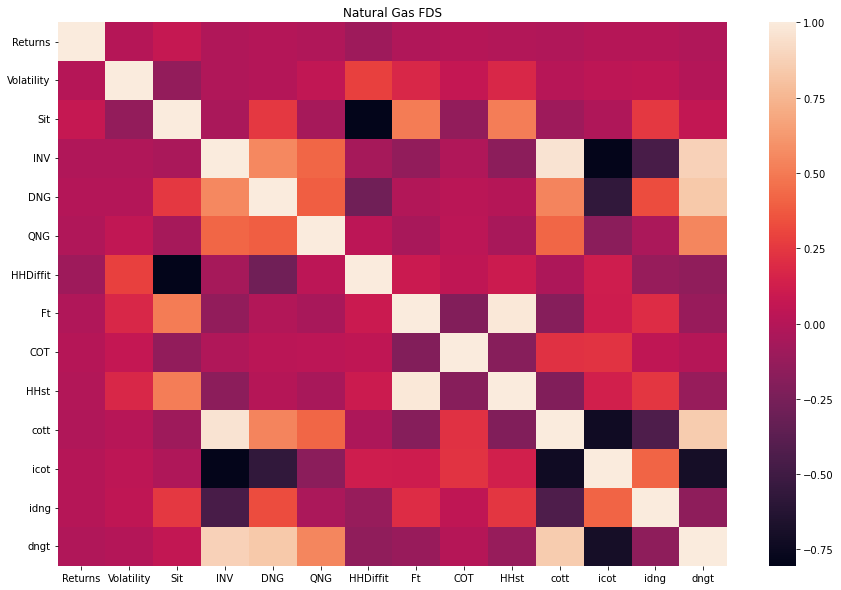

In [22]:
plt.figure(figsize=(15,10))
sns.heatmap(corrs_FDS)

plt.title('Natural Gas FDS')

# Save an image of the chart and print it to the screen
plt.savefig("Natural Gas FDS.png")

plt.show()

# End: Seaborn Pairplots

In [23]:
# Feature engineering, column selection.
# One must use ALL ONE-HOT ENCODED COLUMNS, one cannot simply use one column and leave the rest.
abs(df_FDS.corr()["HHst"]).sort_values(ascending=False)

HHst          1.000000
Ft            0.982086
Sit           0.507488
idng          0.240047
cott          0.212648
COT           0.184381
Volatility    0.171541
INV           0.168477
icot          0.129328
dngt          0.124584
HHDiffit      0.104079
QNG           0.053544
Returns       0.009858
DNG           0.002130
Name: HHst, dtype: float64

In [24]:
# Comparison by Nodes
fds_comparison = df_FDS.groupby(['Node']).describe()
fds_comparison

Returns                                                         \
                count      mean       std       min       25%  50%       75%   
Node                                                                           
East            366.0 -0.001803  0.246127 -1.596309 -0.039512  0.0  0.046308   
Midwest         366.0  0.000133  0.308061 -1.572880 -0.116007  0.0  0.096173   
Mountain        366.0 -0.006396  0.386887 -4.025352 -0.086910  0.0  0.088526   
Pacific         366.0 -0.007465  0.524034 -1.791759 -0.200671  0.0  0.157262   
South Central   366.0 -0.017440  0.547718 -3.091042 -0.167054  0.0  0.116155   

                        Volatility                                     \
                    max      count      mean       std  min       25%   
Node                                                                    
East           1.142737      366.0  0.124430  0.215037  0.0  0.017746   
Midwest        1.881786      366.0  0.195119  0.242048  0.0  0.043427   
Mountain       1.258040      366.0  0.198752  0.336163  0.0  0.034370   
Pacific        2.512306      366.0  0.328783  0.414249  0.0  0.068052   
South Central  3.465736      366.0  0.301899  0.463124  0.0  0.062584   

                                               Sit                            \
                    50%       75%       max  count      mean       std   min   
Node                                                                           
East           0.042248  0.119048  1.610057  366.0  6.959399  1.775059  3.40   
Midwest        0.111490  0.257568  1.900010  366.0  4.691803  0.966011  2.79   
Mountain       0.090512  0.221631  4.058148  366.0  5.023798  1.010063  2.78   
Pacific        0.184615  0.458346  2.544375  366.0  4.012678  0.844165  2.25   
South Central  0.147288  0.340178  3.517207  366.0  4.351011  1.062798  2.30   

                                               INV                          \
                  25%    50%     75%    max  count        mean         std   
Node                                                                         
East           5.6775  6.870  8.0225  11.35  366.0  643.286885  215.518749   
Midwest        4.0900  4.680  5.2200   8.33  366.0  725.256831  262.592929   
Mountain       4.2300  5.020  5.7800   7.63  366.0  168.237705   40.050048   
Pacific        3.4100  4.055  4.5875   6.25  366.0  288.439891   64.135904   
South Central  3.5100  4.190  5.0300   6.88  366.0  973.601093  230.356910   

                                                         DNG                 \
                 min     25%     50%      75%     max  count           mean   
Node                                                                          
East           167.0  468.50   662.0   836.75   960.0  366.0  152808.677596   
Midwest        133.0  535.00   733.5   952.75  1155.0  366.0   83383.797814   
Mountain        80.0  137.00   167.5   200.00   259.0  366.0   33925.081967   
Pacific        102.0  258.00   301.5   335.00   386.0  366.0   52319.617486   
South Central  332.0  818.75  1014.5  1160.75  1370.0  366.0  127110.202186   

                                                                         \
                        std      min        25%         50%         75%   
Node                                                                      
East           39200.012165  91133.0  121722.50  143668.000  181102.025   
Midwest        36466.973021  39050.8   51518.40   71027.125  120051.000   
Mountain        8535.452427  20309.2   27629.00   32084.725   39956.600   
Pacific         9742.728185  34743.8   46315.60   51656.625   58142.500   
South Central  20830.778526  66996.4  113066.85  127791.475  141253.875   

                            QNG                                         \
                     max  count           mean           std       min   
Node                                                                     
East           259140.25  366.0   86671.005464  48377.842786   134

# Begin Cumulative Plots

#  Histograms

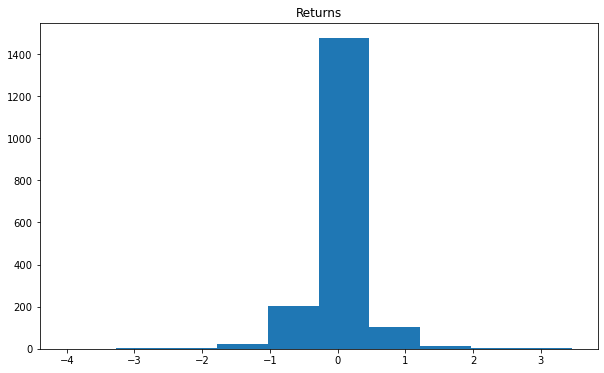

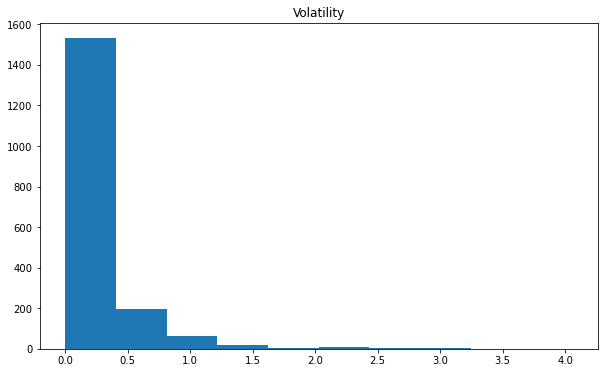

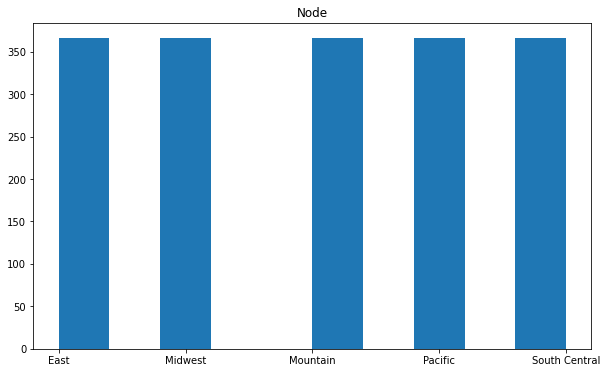

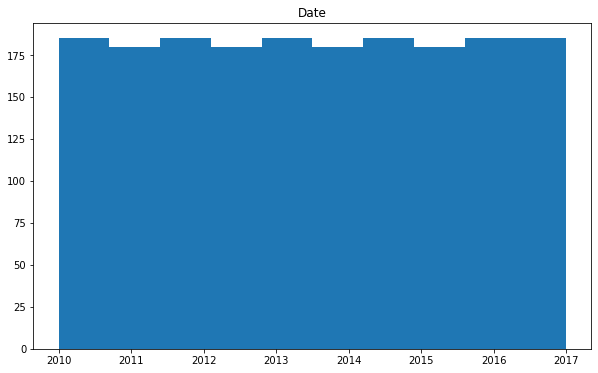

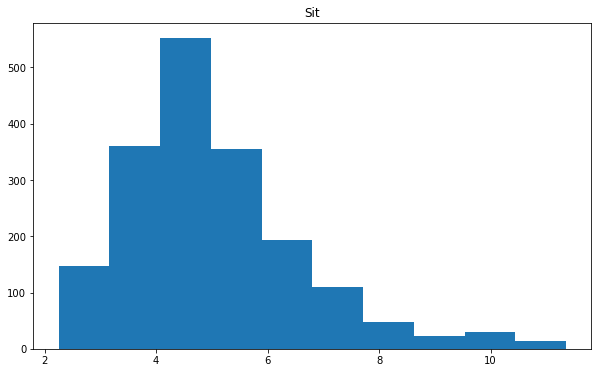

...

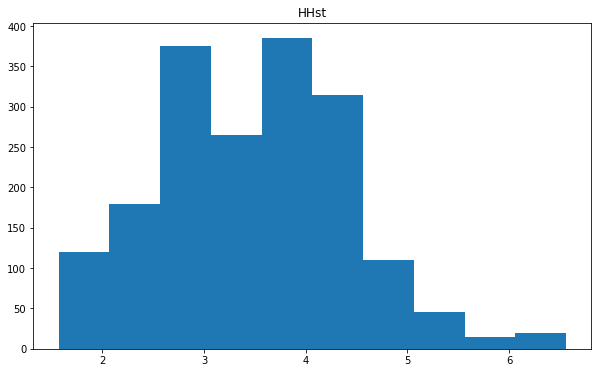

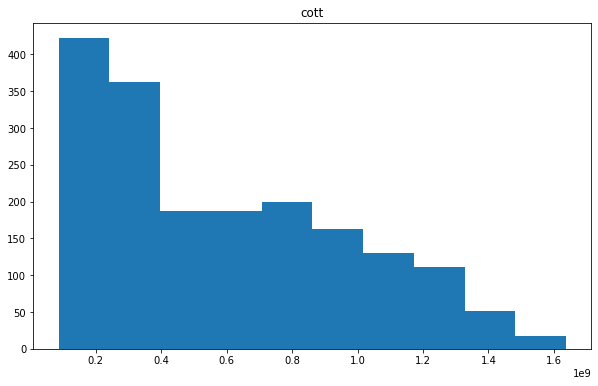

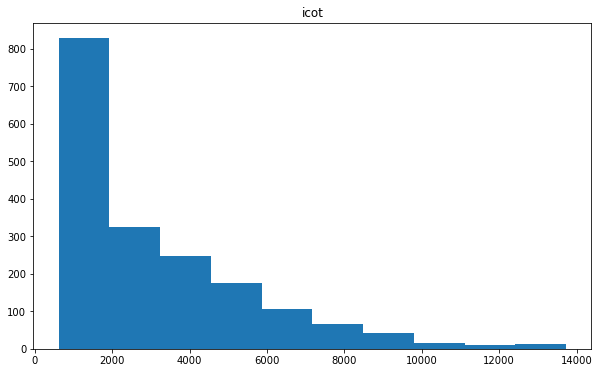

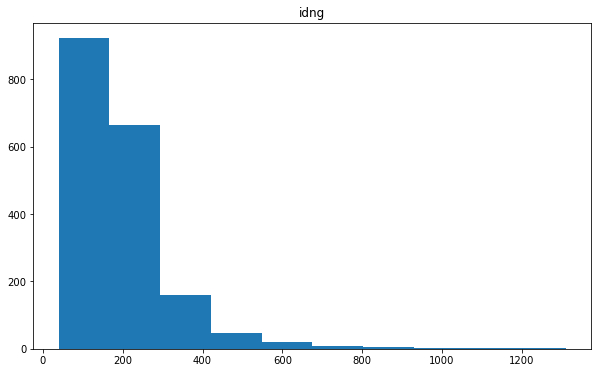

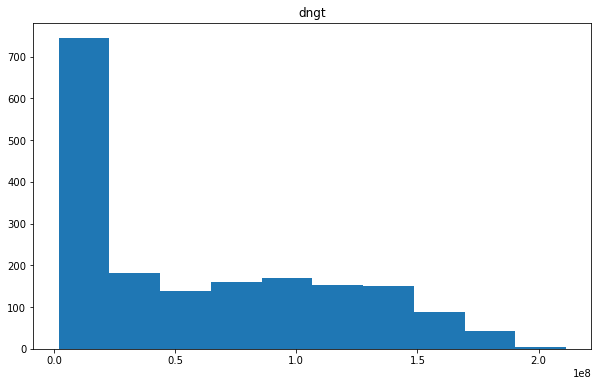

In [25]:
for col in df_FDS.columns:
    plt.figure(figsize=(10,6))
    plt.hist(df_FDS[col])
    plt.title(col)
    # Save an image of the chart and print it to the screen
    plt.savefig("Natural Gas FDS Cumulative Histogram Plots.png")
    plt.show()
    print()

# Line Plots

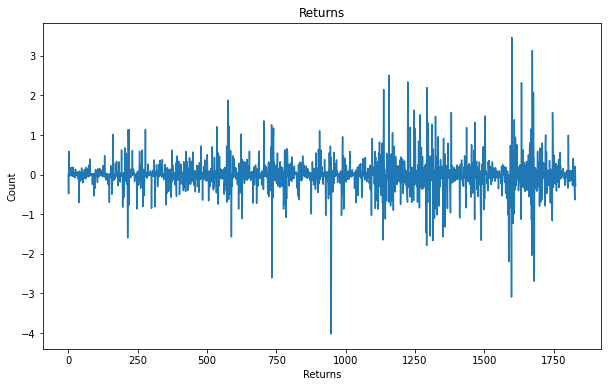

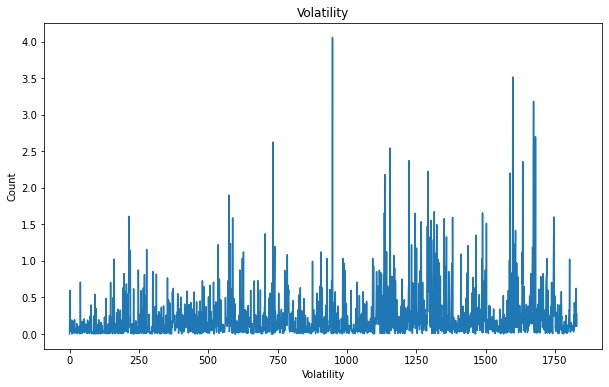

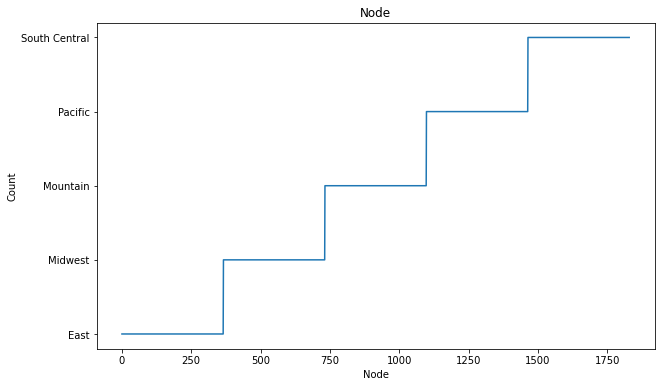

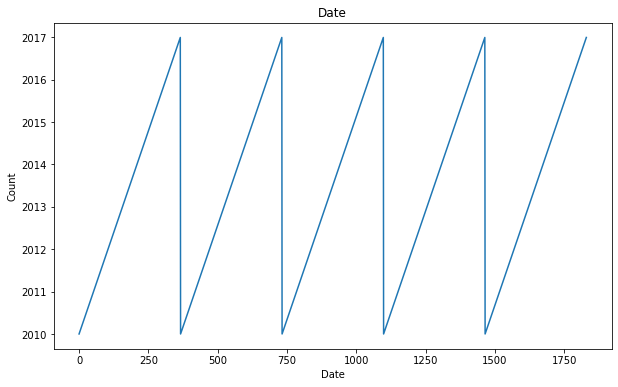

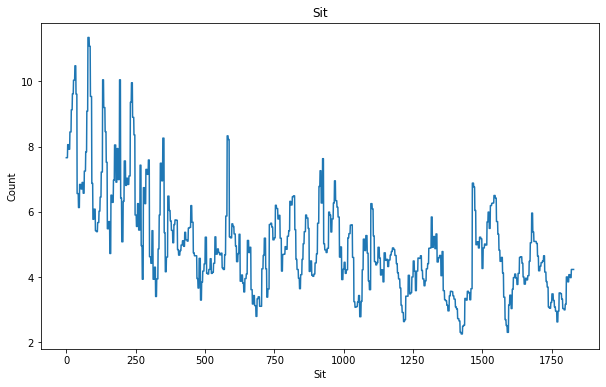

...

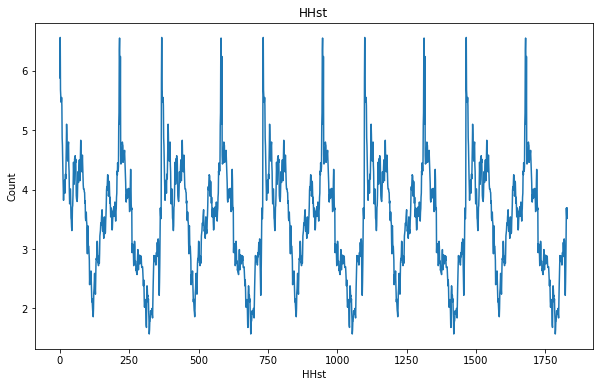

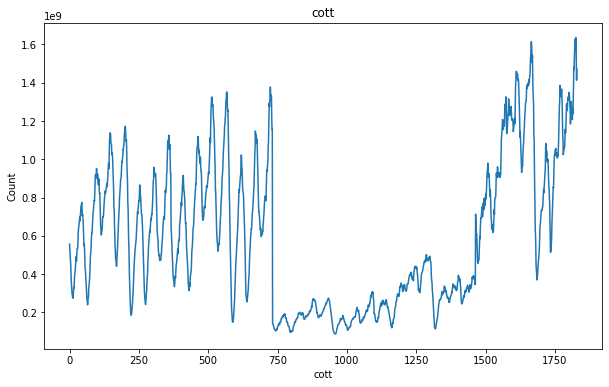

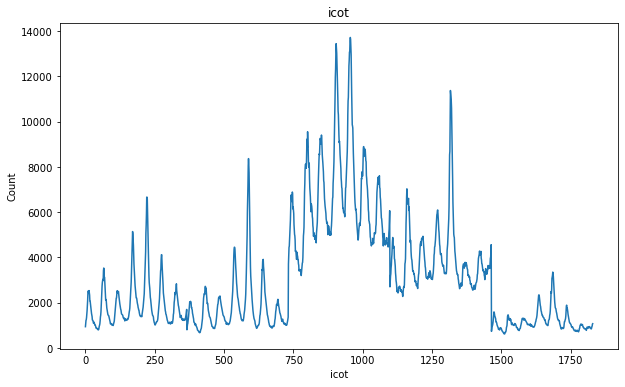

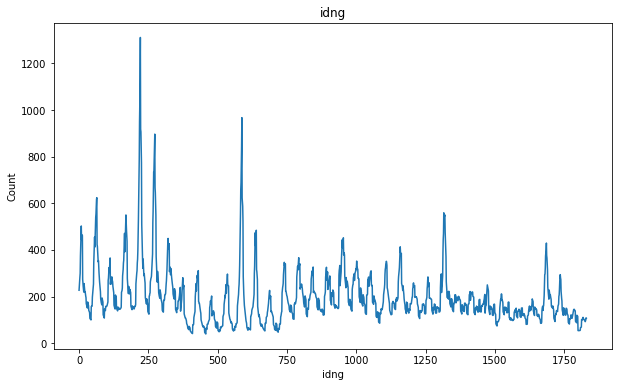

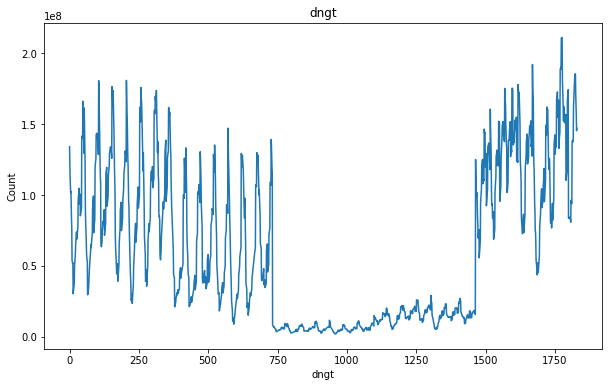

In [26]:
for col in df_FDS.columns: 
    plt.figure(figsize=(10,6))
    plt.plot(df_FDS[col])
    plt.title(col)
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.show()
    print()

# Boxplots

In [27]:
df_FDS.columns

Index(['Returns', 'Volatility', 'Node', 'Date', 'Sit', 'INV', 'DNG', 'QNG',
       'HHDiffit', 'Ft', 'COT', 'HHst', 'cott', 'icot', 'idng', 'dngt'],
      dtype='object')

In [28]:
cols_date = ['Returns', 'Volatility', 'Sit', 'INV', 'DNG', 'QNG',
       'HHDiffit', 'Ft', 'COT', 'HHst', 'cott', 'icot', 'idng', 'dngt']

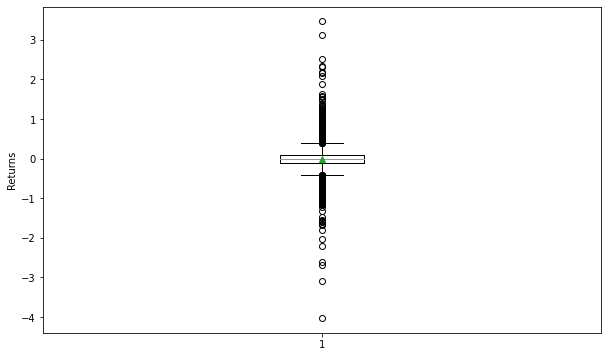

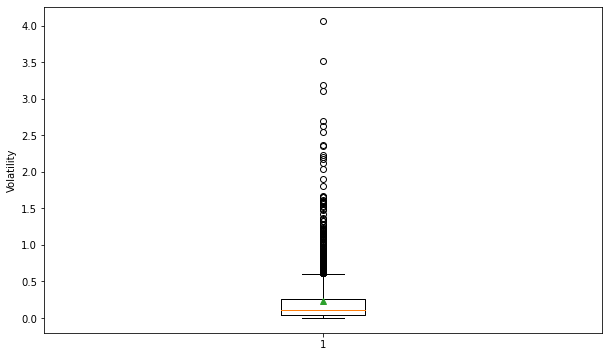

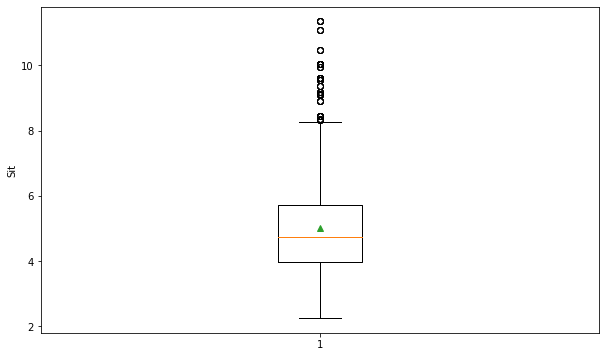

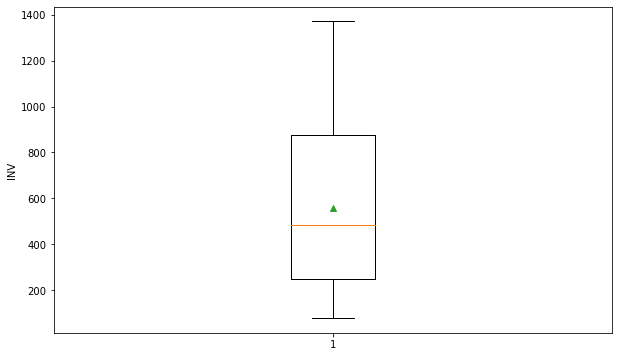

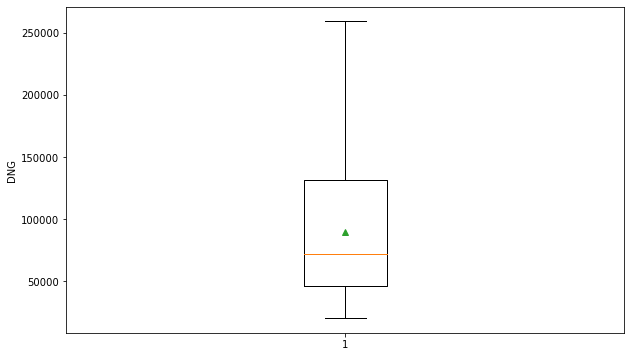

...

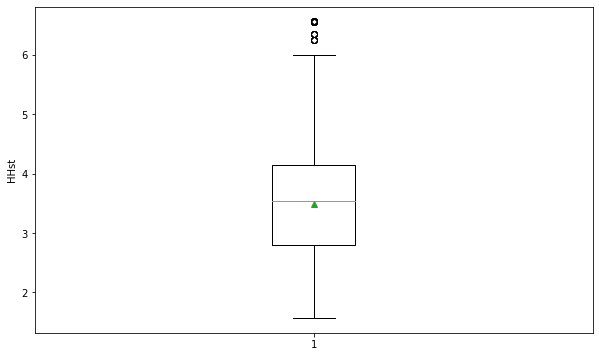

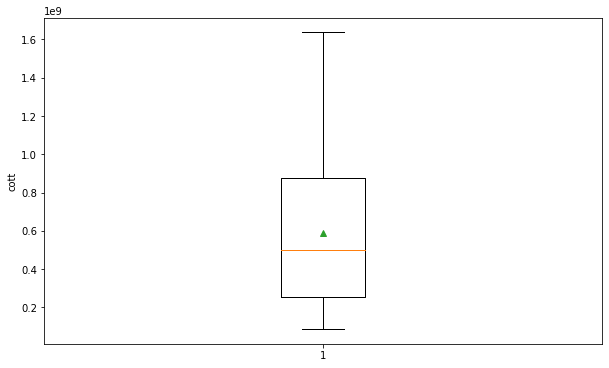

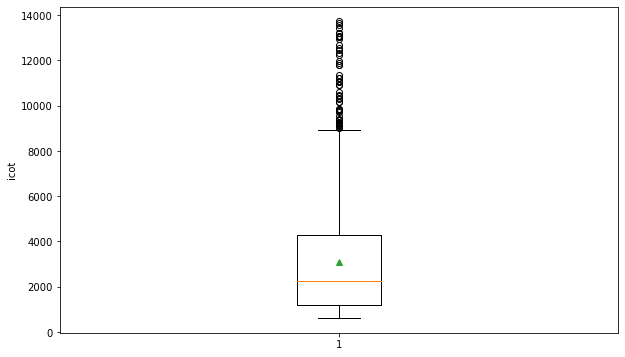

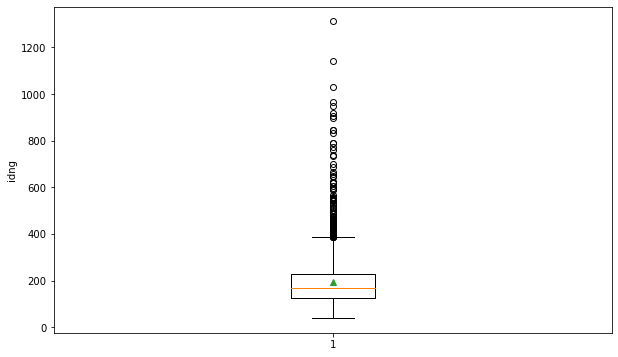

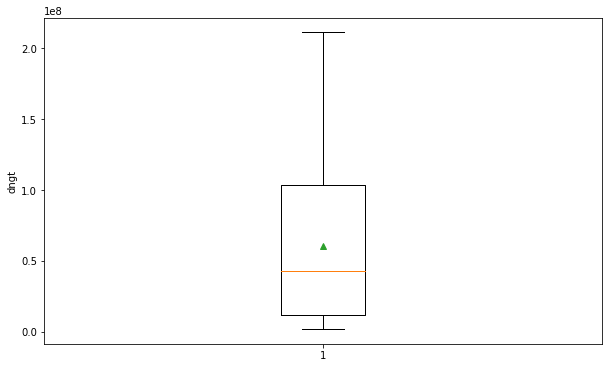

In [29]:
# to create a boxplot of all the columns in the dataset
for col in cols_date: 
    plt.figure(figsize=(10,6))
    plt.boxplot(df_FDS[col], showmeans=True)
    plt.ylabel(col)
    plt.show()

# End Cumulative Plots

# Begin: Break the "df_FDS" into columns

In [30]:
node = df_FDS.Node.value_counts()
node

East             366
Midwest          366
Mountain         366
Pacific          366
South Central    366
Name: Node, dtype: int64

In [31]:
fds_East = df_FDS_date.loc[df_FDS_date.Node=="East"]
fds_East.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 366 entries, 2010-01-01 to 2016-12-30
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Returns     366 non-null    float64
 1   Volatility  366 non-null    float64
 2   Node        366 non-null    object 
 3   Sit         366 non-null    float64
 4   INV         366 non-null    int64  
 5   DNG         366 non-null    float64
 6   QNG         366 non-null    float64
 7   HHDiffit    366 non-null    float64
 8   Ft          366 non-null    float64
 9   COT         366 non-null    int64  
 10  HHst        366 non-null    float64
 11  cott        366 non-null    int64  
 12  icot        366 non-null    float64
 13  idng        366 non-null    float64
 14  dngt        366 non-null    float64
dtypes: float64(11), int64(3), object(1)
memory usage: 45.8+ KB


In [32]:
fds_East.describe()

,Returns,Volatility,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
count,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,3.660000e+02,366.000000,3.660000e+02,366.000000,366.000000,3.660000e+02
mean,-0.001803,0.124430,6.959399,643.286885,152808.677596,86671.005464,-3.471421,3.493694,1.055391e+06,3.487978,6.755678e+08,1934.384238,282.401225,9.731731e+07
std,0.246127,0.215037,1.775059,215.518749,39200.012165,48377.842786,1.503977,0.873156,1.751522e+05,0.937066,2.449250e+08,1038.406048,173.915042,3.872576e+07
min,-1.596309,0.000000,3.400000,167.000000,91133.000000,13475.000000,-7.230000,1.687000,7.240870e+05,1.570000,1.859091e+08,796.924468,99.804188,2.354869e+07
25%,-0.039512,0.017746,5.677500,468.500000,121722.500000,41924.200000,-4.475000,2.773000,9.493555e+05,2.790000,4.902404e+08,1235.966349,163.948192,6.898085e+07
50%,0.000000,0.042248,6.870000,662.000000,143668.000000,81122.500000,-3.180000,3.611500,1.019501e+06,3.540000,6.865678e+08,1578.007302,227.676694,9.388335e+07
75%,0.046308,0.119048,8.022500,836.750000,181102.025000,132187.387500,-2.342500,4.167250,1.174931e+06,4.150000,8.640297e+08,2318.361975,323.581444,1.287942e+08
max,1.142737,1.610057,11.350000,960.000000,259140.250000,173862.750000,-0.260000,5.975000,1.573733e+06,6.560000,1.173169e+09,6667.293413,1310.914671,1.809858e+08


In [33]:
fds_East.head()

,Returns,Volatility,Node,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
Date,,,,,,,,,,,,,,,
2010-01-01,0.000000,0.000000,East,7.66,769,174475.2,13475.0,-1.78,5.770,724087,5.88,556822903,941.595579,226.885826,134171428.8
2010-01-08,-0.481303,0.484173,East,7.66,703,174475.2,13475.0,-1.10,5.818,760159,6.56,534391777,1081.307255,248.186629,122656065.6
2010-01-15,0.587787,0.595347,East,7.66,642,174475.2,13475.0,-1.98,5.610,782549,5.68,502396458,1218.923676,271.768224,112013078.4
2010-01-22,0.058840,0.061240,East,7.66,616,174475.2,13475.0,-2.10,5.625,769887,5.56,474250392,1249.816558,283.238961,107476723.2
2010-01-29,0.041964,0.044199,East,7.66,582,174475.2,13475.0,-2.19,5.350,782673,5.47,455515686,1344.798969,299.785567,101544566.4


In [34]:
fds_Midwest = df_FDS_date.loc[df_FDS_date.Node=="Midwest"]
fds_Midwest.info()          

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 366 entries, 2010-01-01 to 2016-12-30
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Returns     366 non-null    float64
 1   Volatility  366 non-null    float64
 2   Node        366 non-null    object 
 3   Sit         366 non-null    float64
 4   INV         366 non-null    int64  
 5   DNG         366 non-null    float64
 6   QNG         366 non-null    float64
 7   HHDiffit    366 non-null    float64
 8   Ft          366 non-null    float64
 9   COT         366 non-null    int64  
 10  HHst        366 non-null    float64
 11  cott        366 non-null    int64  
 12  icot        366 non-null    float64
 13  idng        366 non-null    float64
 14  dngt        366 non-null    float64
dtypes: float64(11), int64(3), object(1)
memory usage: 45.8+ KB


In [35]:
fds_Midwest.describe()

,Returns,Volatility,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
count,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,3.660000e+02,366.000000,3.660000e+02,366.000000,366.000000,3.660000e+02
mean,0.000133,0.195119,4.691803,725.256831,83383.797814,3462.519126,-1.203825,3.493694,1.055391e+06,3.487978,7.599146e+08,1799.223739,143.625852,6.011943e+07
std,0.308061,0.242048,0.966011,262.592929,36466.973021,2278.725755,0.564948,0.873156,1.751522e+05,0.937066,2.927714e+08,1197.990394,123.784158,3.426306e+07
min,-1.572880,0.000000,2.790000,133.000000,39050.800000,0.000000,-3.790000,1.687000,7.240870e+05,1.570000,1.480593e+08,671.846637,39.445253,8.920127e+06
25%,-0.116007,0.043427,4.090000,535.000000,51518.400000,0.000000,-1.470000,2.773000,9.493555e+05,2.790000,5.537713e+08,1068.614079,69.345900,3.315636e+07
50%,0.000000,0.111490,4.680000,733.500000,71027.125000,4461.250000,-1.120000,3.611500,1.019501e+06,3.540000,7.537182e+08,1415.392968,104.188773,4.706741e+07
75%,0.096173,0.257568,5.220000,952.750000,120051.000000,5067.250000,-0.832500,4.167250,1.174931e+06,4.150000,9.607953e+08,2026.426871,170.934622,8.876239e+07
max,1.881786,1.900010,8.330000,1155.000000,170915.250000,7166.000000,0.080000,5.975000,1.573733e+06,6.560000,1.377943e+09,8370.135338,967.132246,1.472406e+08


In [36]:
fds_Midwest.head()

,Returns,Volatility,Node,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
Date,,,,,,,,,,,,,,,
2010-01-01,0.000000,0.000000,Midwest,6.48,900,123648.8,4551.4,-0.60,5.770,724087,5.88,651678300,804.541111,137.387556,111283920.0
2010-01-08,0.000000,0.000135,Midwest,6.48,820,123648.8,4551.4,0.08,5.818,760159,6.56,623330380,927.023171,150.791220,101392016.0
2010-01-15,0.000000,0.000135,Midwest,6.48,750,123648.8,4551.4,-0.80,5.610,782549,5.68,586911750,1043.398667,164.865067,92736600.0
2010-01-22,0.139762,0.140991,Midwest,6.48,710,123648.8,4551.4,-0.92,5.625,769887,5.56,546619770,1084.347887,174.153239,87790648.0
2010-01-29,0.093332,0.094108,Midwest,6.48,661,123648.8,4551.4,-1.01,5.350,782673,5.47,517346853,1184.074130,187.063238,81731856.8


In [37]:
fds_Mountain = df_FDS_date.loc[df_FDS_date.Node=="Mountain"]
fds_Mountain.info()    

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 366 entries, 2010-01-01 to 2016-12-30
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Returns     366 non-null    float64
 1   Volatility  366 non-null    float64
 2   Node        366 non-null    object 
 3   Sit         366 non-null    float64
 4   INV         366 non-null    int64  
 5   DNG         366 non-null    float64
 6   QNG         366 non-null    float64
 7   HHDiffit    366 non-null    float64
 8   Ft          366 non-null    float64
 9   COT         366 non-null    int64  
 10  HHst        366 non-null    float64
 11  cott        366 non-null    int64  
 12  icot        366 non-null    float64
 13  idng        366 non-null    float64
 14  dngt        366 non-null    float64
dtypes: float64(11), int64(3), object(1)
memory usage: 45.8+ KB


In [38]:
fds_Mountain.describe()

,Returns,Volatility,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
count,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,3.660000e+02,366.000000,3.660000e+02,366.000000,366.000000,3.660000e+02
mean,-0.006396,0.198752,5.023798,168.237705,33925.081967,107222.193989,-1.535820,3.493694,1.055391e+06,3.487978,1.767722e+08,6714.001914,213.777648,5.715956e+06
std,0.386887,0.336163,1.010063,40.050048,8535.452427,11589.248141,0.888921,0.873156,1.751522e+05,0.937066,4.907255e+07,2252.114987,73.702753,1.999063e+06
min,-4.025352,0.000000,2.780000,80.000000,20309.200000,89485.200000,-4.080000,1.687000,7.240870e+05,1.570000,8.733552e+07,3201.320513,85.692827,1.971316e+06
25%,-0.086910,0.034370,4.230000,137.000000,27629.000000,95728.800000,-2.217500,2.773000,9.493555e+05,2.790000,1.405508e+08,5040.167075,156.019070,4.116937e+06
50%,0.000000,0.090512,5.020000,167.500000,32084.725000,111621.750000,-1.415000,3.611500,1.019501e+06,3.540000,1.731265e+08,6169.351913,199.279649,5.436611e+06
75%,0.088526,0.221631,5.780000,200.000000,39956.600000,117133.687500,-0.912500,4.167250,1.174931e+06,4.150000,2.034562e+08,7998.481493,269.946966,6.821592e+06
max,1.258040,4.058148,7.630000,259.000000,58289.750000,127092.500000,0.950000,5.975000,1.573733e+06,6.560000,3.073859e+08,13723.555556,451.764706,1.165795e+07


In [39]:
fds_Mountain.head()

,Returns,Volatility,Node,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
Date,,,,,,,,,,,,,,,
2010-01-01,0.000000,0.000000,Mountain,5.61,195,42086.0,97762.8,0.27,5.770,724087,5.88,141196965,3713.266667,215.825641,8206770.0
2010-01-08,1.258040,1.276790,Mountain,5.61,185,42086.0,97762.8,0.95,5.818,760159,6.56,140629415,4108.967568,227.491892,7785910.0
2010-01-15,-2.607967,2.626935,Mountain,5.61,176,42086.0,97762.8,0.07,5.610,782549,5.68,137728624,4446.301136,239.125000,7407136.0
2010-01-22,0.000000,0.006476,Mountain,5.61,171,42086.0,97762.8,-0.05,5.625,769887,5.56,131650677,4502.263158,246.116959,7196706.0
2010-01-29,1.029619,1.046141,Mountain,5.61,164,42086.0,97762.8,-0.14,5.350,782673,5.47,128358372,4772.396341,256.621951,6902104.0


In [40]:
fds_Pacific = df_FDS_date.loc[df_FDS_date.Node=="Pacific"]
fds_Pacific.info()  

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 366 entries, 2010-01-01 to 2016-12-30
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Returns     366 non-null    float64
 1   Volatility  366 non-null    float64
 2   Node        366 non-null    object 
 3   Sit         366 non-null    float64
 4   INV         366 non-null    int64  
 5   DNG         366 non-null    float64
 6   QNG         366 non-null    float64
 7   HHDiffit    366 non-null    float64
 8   Ft          366 non-null    float64
 9   COT         366 non-null    int64  
 10  HHst        366 non-null    float64
 11  cott        366 non-null    int64  
 12  icot        366 non-null    float64
 13  idng        366 non-null    float64
 14  dngt        366 non-null    float64
dtypes: float64(11), int64(3), object(1)
memory usage: 45.8+ KB


In [41]:
fds_Pacific.describe()

,Returns,Volatility,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
count,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,3.660000e+02,366.000000,3.660000e+02,366.000000,366.000000,3.660000e+02
mean,-0.007465,0.328783,4.012678,288.439891,52319.617486,4707.874317,-0.524699,3.493694,1.055391e+06,3.487978,3.060160e+08,3918.199129,194.455529,1.515887e+07
std,0.524034,0.414249,0.844165,64.135904,9742.728185,658.629558,0.395225,0.873156,1.751522e+05,0.937066,9.044534e+07,1463.076858,75.569919,4.648038e+06
min,-1.791759,0.000000,2.250000,102.000000,34743.800000,3434.800000,-1.840000,1.687000,7.240870e+05,1.570000,1.135707e+08,2276.927052,105.593201,5.163177e+06
25%,-0.200671,0.068052,3.410000,258.000000,46315.600000,4241.500000,-0.730000,2.773000,9.493555e+05,2.790000,2.508678e+08,3067.798997,144.643799,1.226550e+07
50%,0.000000,0.184615,4.055000,301.500000,51656.625000,4779.250000,-0.540000,3.611500,1.019501e+06,3.540000,3.136699e+08,3515.540507,175.138024,1.497780e+07
75%,0.157262,0.458346,4.587500,335.000000,58142.500000,5210.687500,-0.320000,4.167250,1.174931e+06,4.150000,3.630351e+08,4299.103568,208.410325,1.801151e+07
max,2.512306,2.544375,6.250000,386.000000,83463.750000,6291.500000,1.660000,5.975000,1.573733e+06,6.560000,5.016705e+08,11378.708738,559.014957,2.921231e+07


In [42]:
fds_Pacific.head()

,Returns,Volatility,Node,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
Date,,,,,,,,,,,,,,,
2010-01-01,0.000000,0.000000,Pacific,6.25,268,55720.8,5109.2,-0.37,5.770,724087,5.88,194055316,2701.817164,207.913433,14933174.4
2010-01-08,0.000000,0.007558,Pacific,6.25,257,55720.8,5109.2,0.31,5.818,760159,6.56,195360863,2957.817121,216.812451,14320245.6
2010-01-15,0.000000,0.007558,Pacific,6.25,246,55720.8,5109.2,-0.57,5.610,782549,5.68,192507054,3181.093496,226.507317,13707316.8
2010-01-22,0.191055,0.200477,Pacific,6.25,235,55720.8,5109.2,-0.69,5.625,769887,5.56,180923445,3276.114894,237.109787,13094388.0
2010-01-29,0.122602,0.131356,Pacific,6.25,221,55720.8,5109.2,-0.78,5.350,782673,5.47,172970733,3541.506787,252.130317,12314296.8


In [43]:
fds_SC = df_FDS_date.loc[df_FDS_date.Node=="South Central"]
fds_SC.info()  

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 366 entries, 2010-01-01 to 2016-12-30
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Returns     366 non-null    float64
 1   Volatility  366 non-null    float64
 2   Node        366 non-null    object 
 3   Sit         366 non-null    float64
 4   INV         366 non-null    int64  
 5   DNG         366 non-null    float64
 6   QNG         366 non-null    float64
 7   HHDiffit    366 non-null    float64
 8   Ft          366 non-null    float64
 9   COT         366 non-null    int64  
 10  HHst        366 non-null    float64
 11  cott        366 non-null    int64  
 12  icot        366 non-null    float64
 13  idng        366 non-null    float64
 14  dngt        366 non-null    float64
dtypes: float64(11), int64(3), object(1)
memory usage: 45.8+ KB


In [44]:
fds_SC.describe()

,Returns,Volatility,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
count,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,3.660000e+02,366.000000,3.660000e+02,366.000000,366.000000,3.660000e+02
mean,-0.017440,0.301899,4.351011,973.601093,127110.202186,255757.857923,-0.863033,3.493694,1.055391e+06,3.487978,1.029097e+09,1171.112203,141.829444,1.232218e+08
std,0.547718,0.463124,1.062798,230.356910,20830.778526,31247.099279,0.594338,0.873156,1.751522e+05,0.937066,3.005068e+08,457.838644,56.212055,3.469738e+07
min,-3.091042,0.000000,2.300000,332.000000,66996.400000,196213.800000,-2.410000,1.687000,7.240870e+05,1.570000,3.696614e+08,619.098347,53.468795,4.371577e+07
25%,-0.167054,0.062584,3.510000,818.750000,113066.850000,230394.400000,-1.237500,2.773000,9.493555e+05,2.790000,7.919491e+08,888.078721,107.219982,9.539956e+07
50%,0.000000,0.147288,4.190000,1014.500000,127791.475000,257196.750000,-0.735000,3.611500,1.019501e+06,3.540000,1.042725e+09,1033.714091,132.299436,1.256230e+08
75%,0.116155,0.340178,5.030000,1160.750000,141253.875000,285957.500000,-0.420000,4.167250,1.174931e+06,4.150000,1.264764e+09,1288.836473,154.770435,1.468193e+08
max,3.465736,3.517207,6.880000,1370.000000,163019.500000,302955.500000,0.860000,5.975000,1.573733e+06,6.560000,1.636590e+09,3353.728916,429.284639,2.112762e+08


In [45]:
fds_SC.head()

,Returns,Volatility,Node,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
Date,,,,,,,,,,,,,,,
2010-01-01,0.000000,0.000000,South Central,6.88,985,127012.0,196213.8,-1.00,5.770,724087,5.88,713225695,735.113706,128.946193,125106820.0
2010-01-08,-1.139434,1.132892,South Central,6.88,886,127012.0,196213.8,-0.32,5.818,760159,6.56,673500874,857.967269,143.354402,112532632.0
2010-01-15,1.321756,1.352310,South Central,6.88,793,127012.0,196213.8,-1.20,5.610,782549,5.68,620561357,986.820933,160.166456,100720516.0
2010-01-22,0.095310,0.113899,South Central,6.88,789,127012.0,196213.8,-1.32,5.625,769887,5.56,607440843,975.775665,160.978454,100212468.0
2010-01-29,0.065958,0.084260,South Central,6.88,779,127012.0,196213.8,-1.41,5.350,782673,5.47,609702267,1004.715019,163.044929,98942348.0


# Begin: Subplots

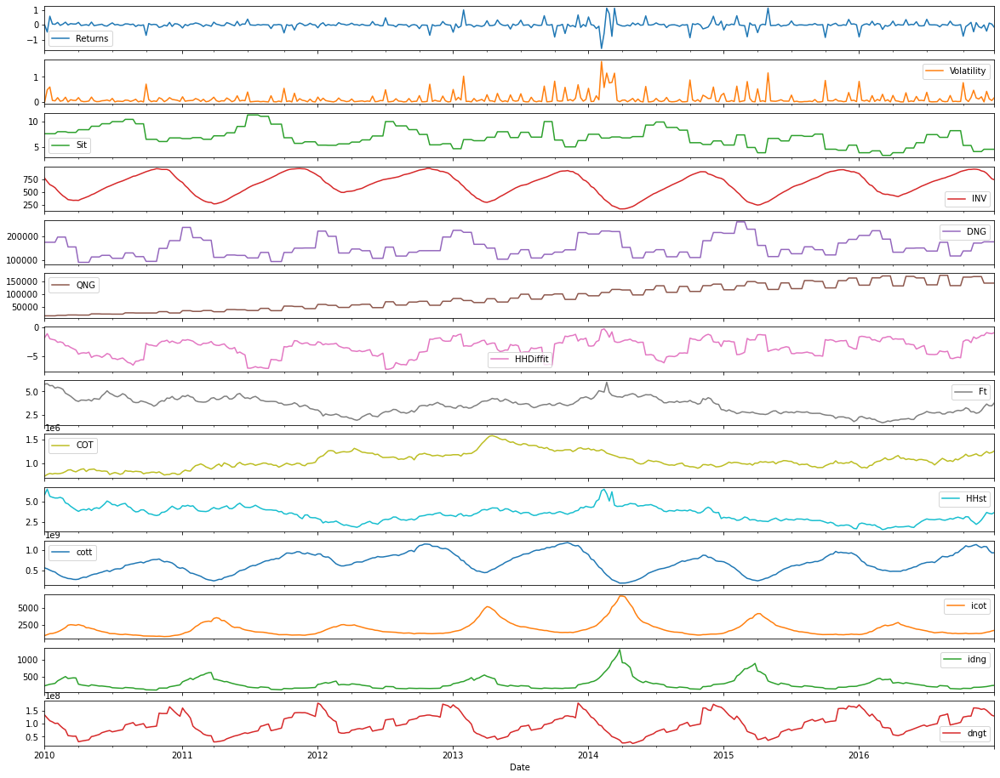

In [46]:
fds_East.plot(figsize=(20, 16), subplots=True)
plt.savefig("Eastern Node.png")
plt.show()

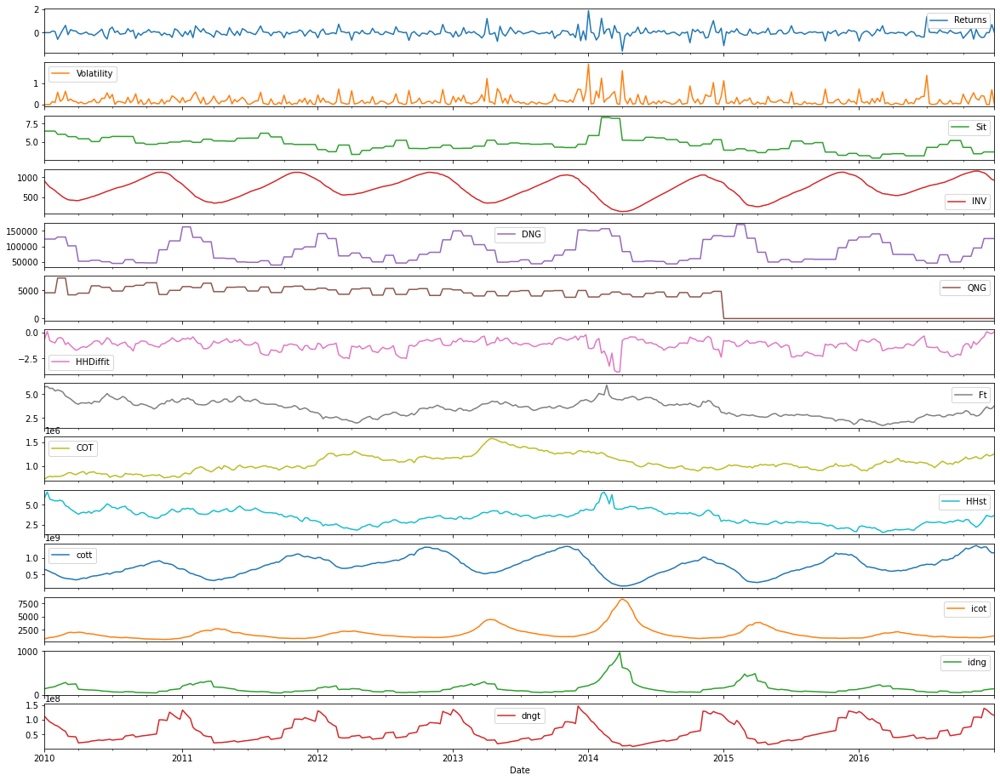

In [47]:
fds_Midwest.plot(figsize=(20, 16), subplots=True)
plt.savefig("Midwestern Node.png")
plt.show()

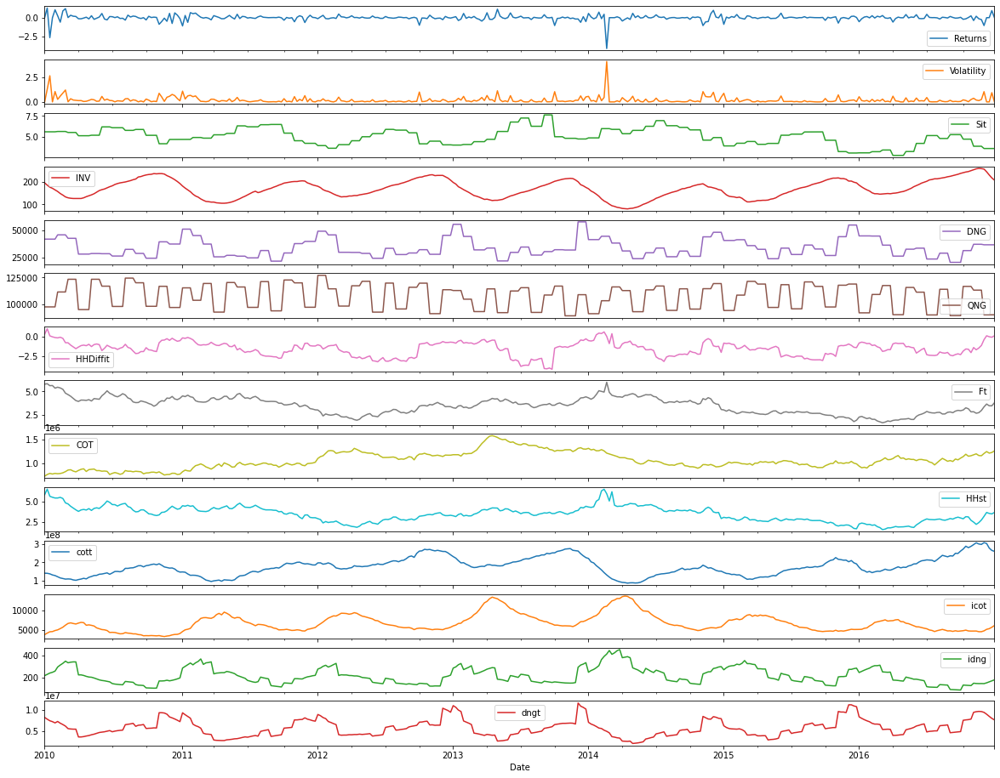

In [48]:
fds_Mountain.plot(figsize=(20, 16), subplots=True)
plt.savefig("Mountain Node.png")
plt.show()

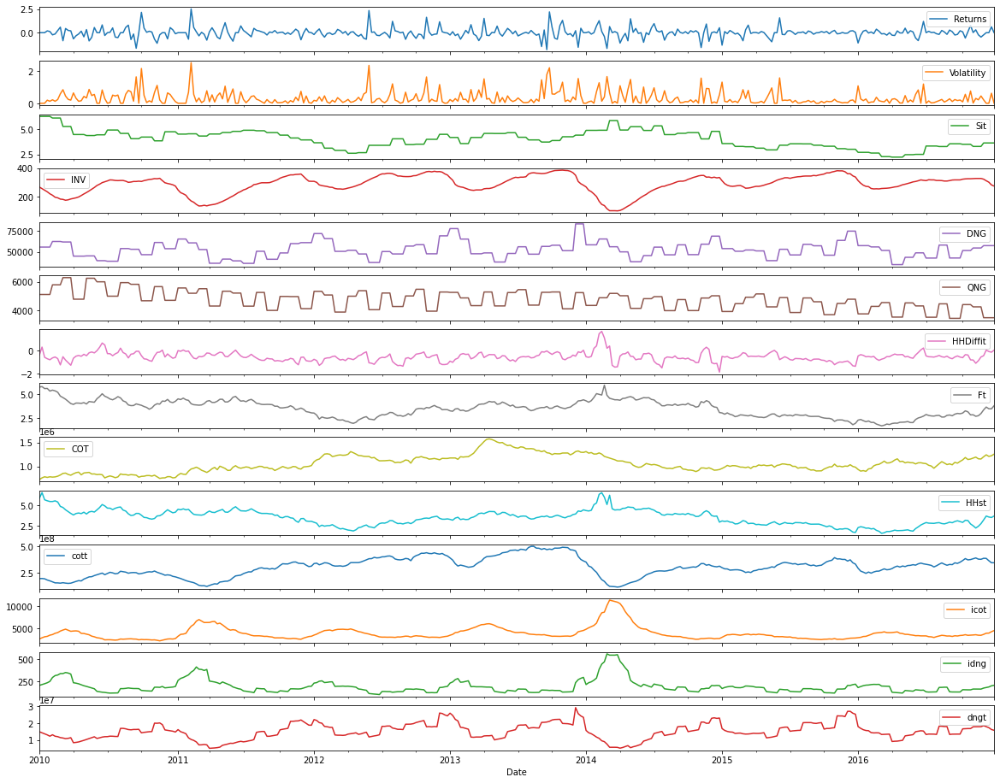

In [49]:
fds_Pacific.plot(figsize=(20, 16), subplots=True)
plt.savefig("Pacific Node.png")
plt.show()

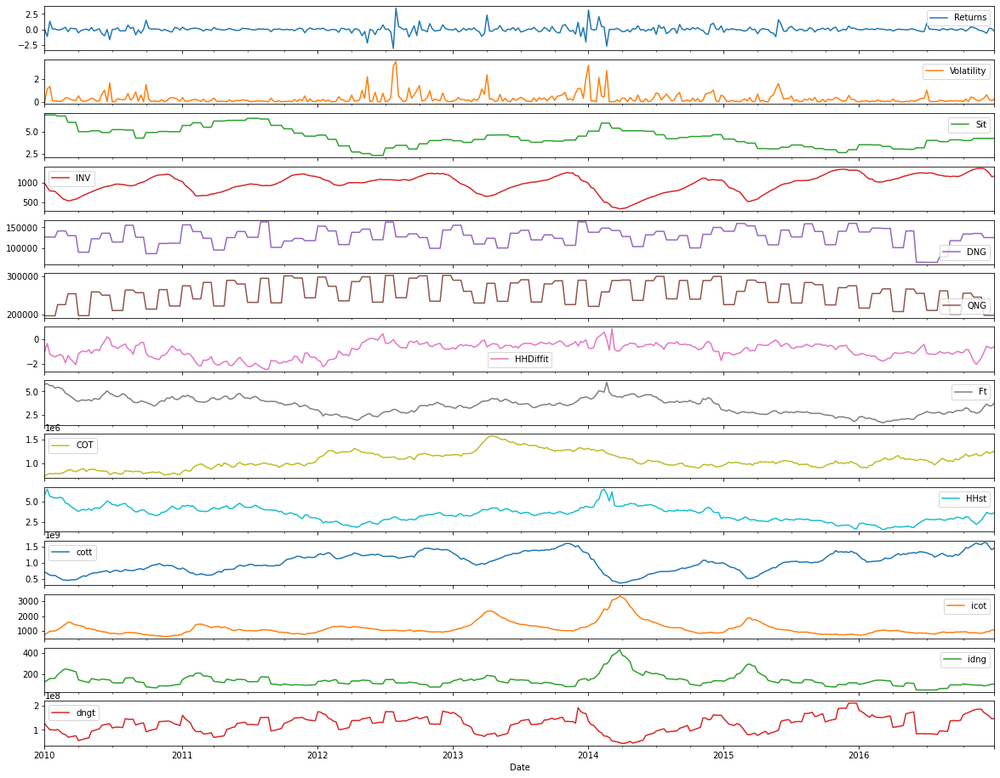

In [50]:
fds_SC.plot(figsize=(20, 16), subplots=True)
plt.savefig("South Central Node.png")
plt.show()

# End: Subplots

# End: Break the "df_FDS" into columns 

# Begin: Seaborn Pairplots 

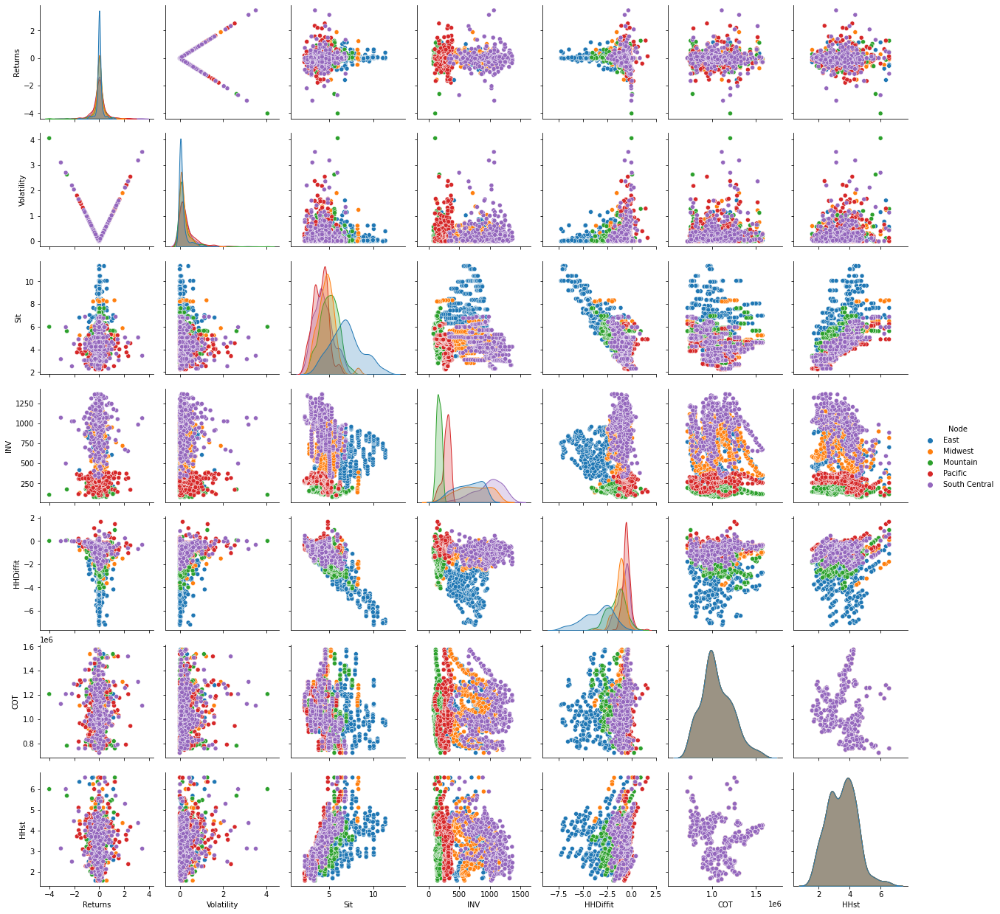

In [51]:
sns.pairplot(df_FDS[['Returns', 'Volatility', 'Sit', 'INV', 'HHDiffit', 'COT', 'HHst', 'Node']], hue = "Node")
plt.show()

In [52]:
abs(df_FDS.corr()["HHDiffit"]).sort_values(ascending=False)

HHDiffit      1.000000
Sit           0.804160
DNG           0.283760
Volatility    0.281353
dngt          0.154035
idng          0.122943
icot          0.115770
HHst          0.104079
Ft            0.096669
Returns       0.094775
INV           0.058615
COT           0.042539
QNG           0.034444
cott          0.034233
Name: HHDiffit, dtype: float64

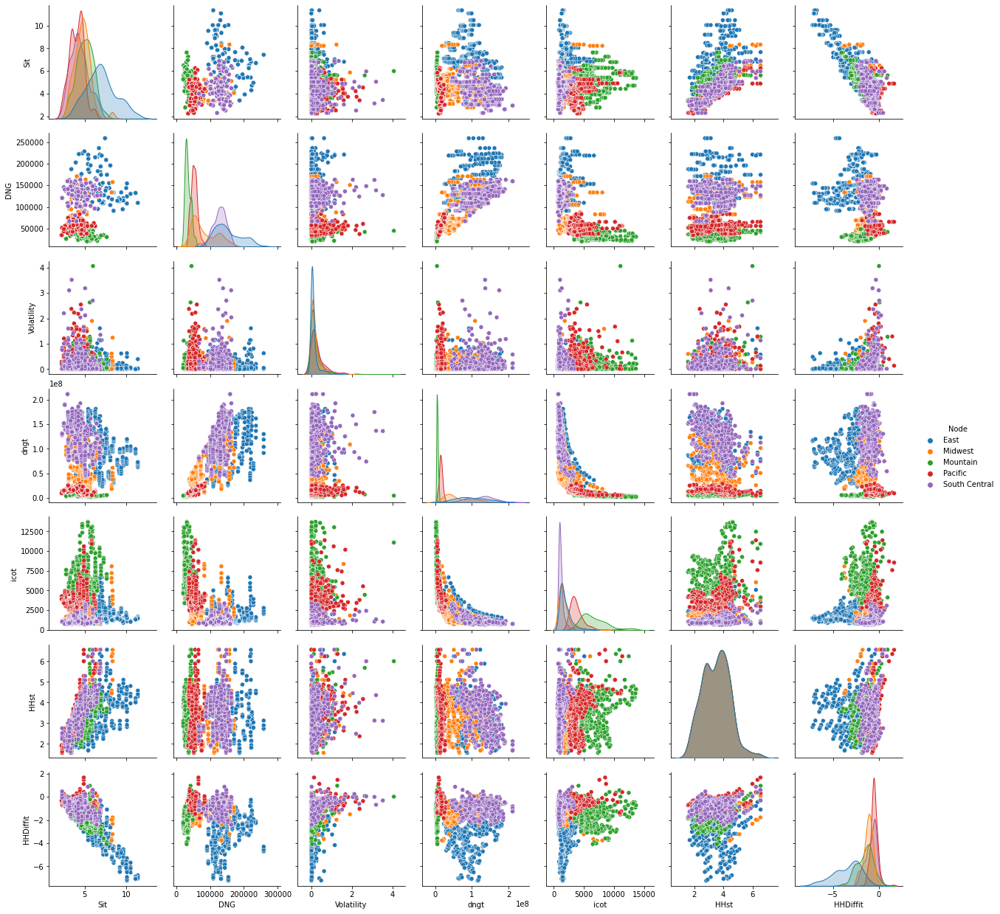

In [53]:
sns.pairplot(df_FDS[['Sit', 'DNG', 'Volatility', 'dngt', 'icot', 'HHst', 'Node','HHDiffit']], hue = "Node")
plt.show()

In [54]:
abs(df_FDS.corr()["HHDiffit"]).sort_values(ascending=False)

HHDiffit      1.000000
Sit           0.804160
DNG           0.283760
Volatility    0.281353
dngt          0.154035
idng          0.122943
icot          0.115770
HHst          0.104079
Ft            0.096669
Returns       0.094775
INV           0.058615
COT           0.042539
QNG           0.034444
cott          0.034233
Name: HHDiffit, dtype: float64

In [55]:
node

East             366
Midwest          366
Mountain         366
Pacific          366
South Central    366
Name: Node, dtype: int64

In [56]:
fds_East.columns

Index(['Returns', 'Volatility', 'Node', 'Sit', 'INV', 'DNG', 'QNG', 'HHDiffit',
       'Ft', 'COT', 'HHst', 'cott', 'icot', 'idng', 'dngt'],
      dtype='object')

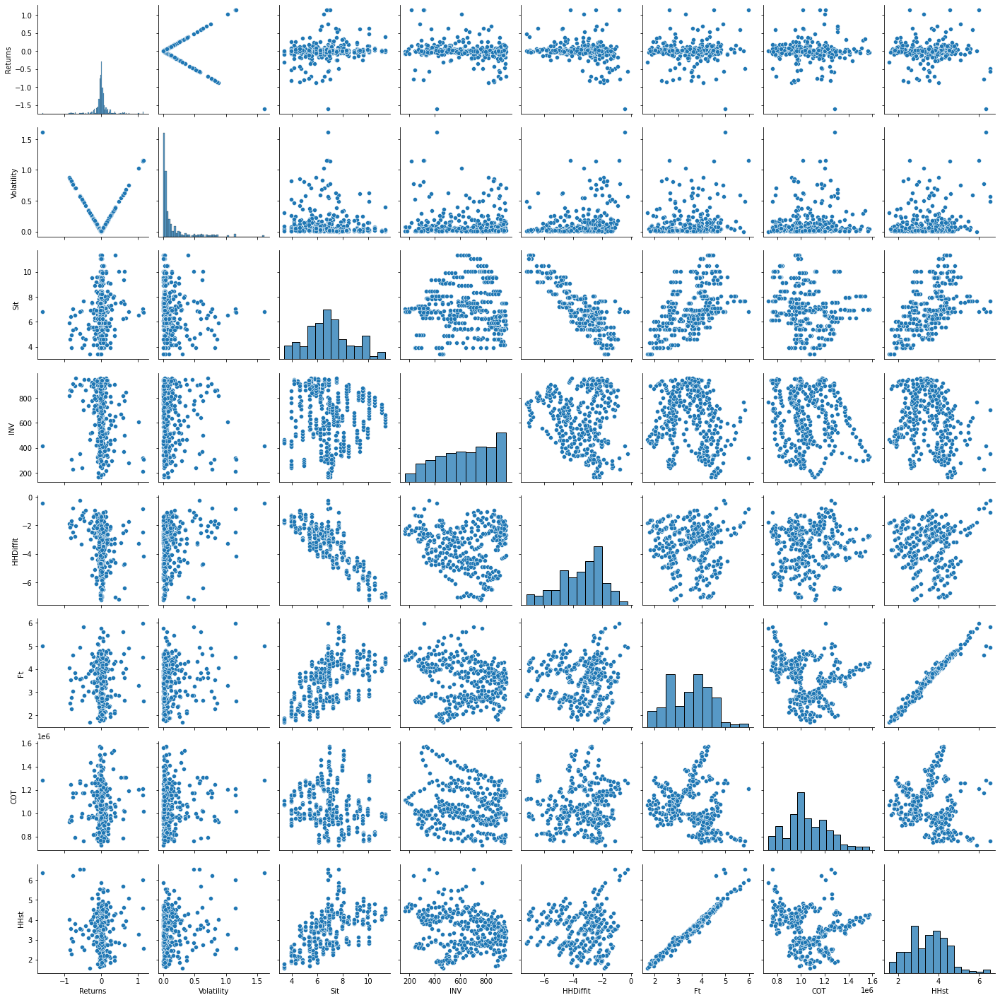

In [57]:
sns.pairplot(fds_East[['Returns', 'Volatility', 'Sit', 'INV', 'HHDiffit', 'Ft', 'COT', 'HHst']])
plt.show()

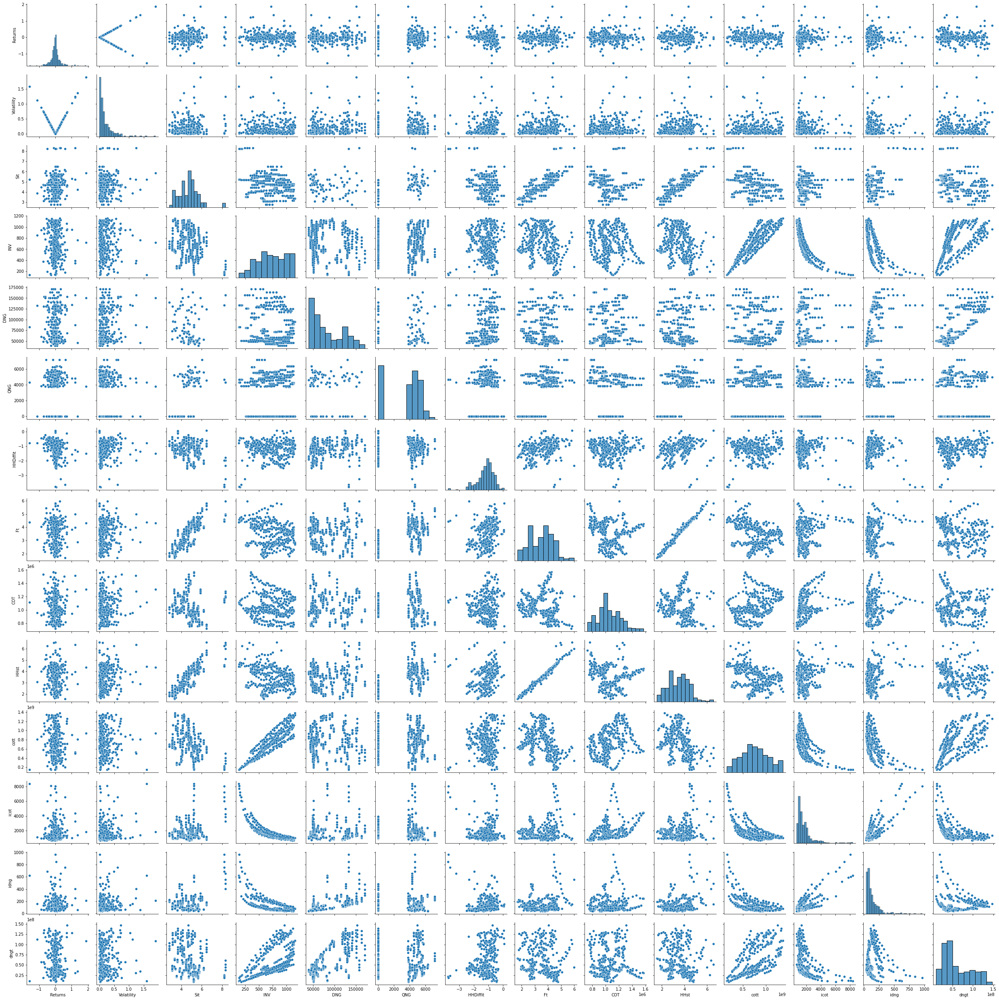

In [58]:
sns.pairplot(fds_Midwest)
plt.show()

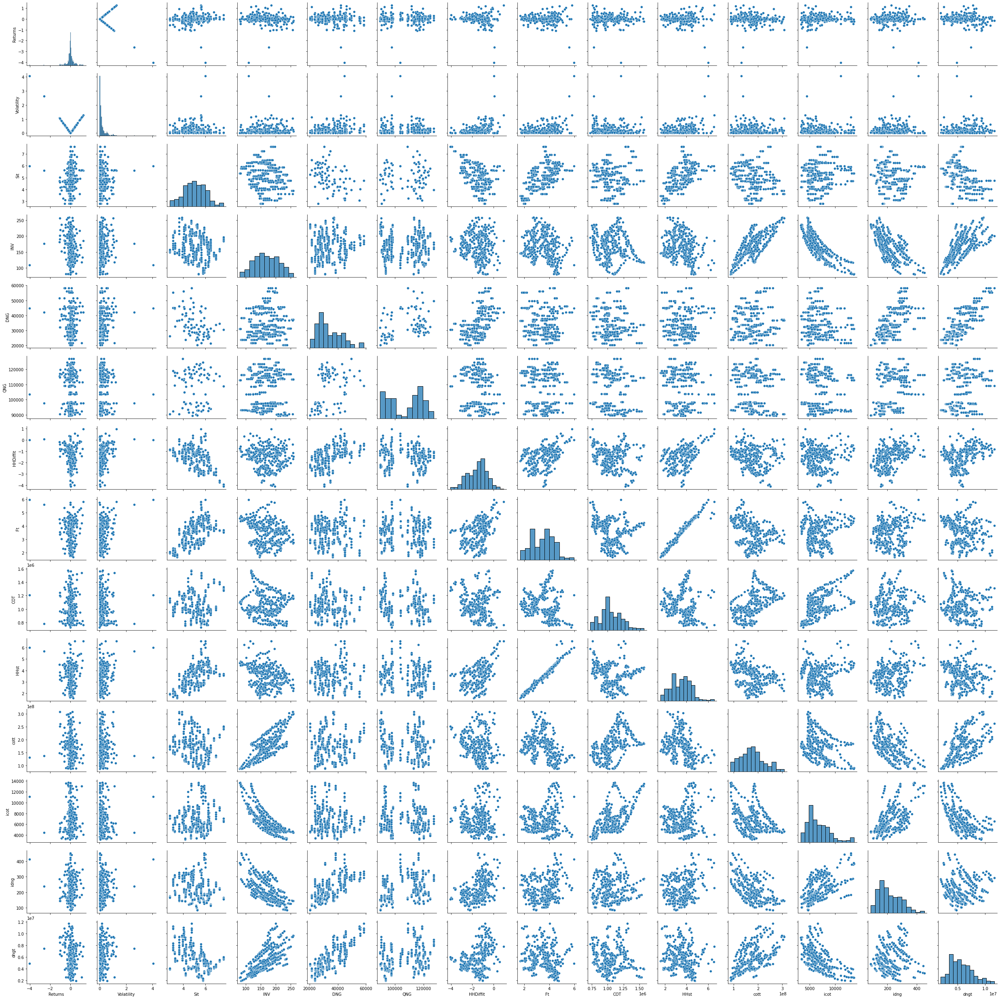

In [59]:
sns.pairplot(fds_Mountain)
plt.show()

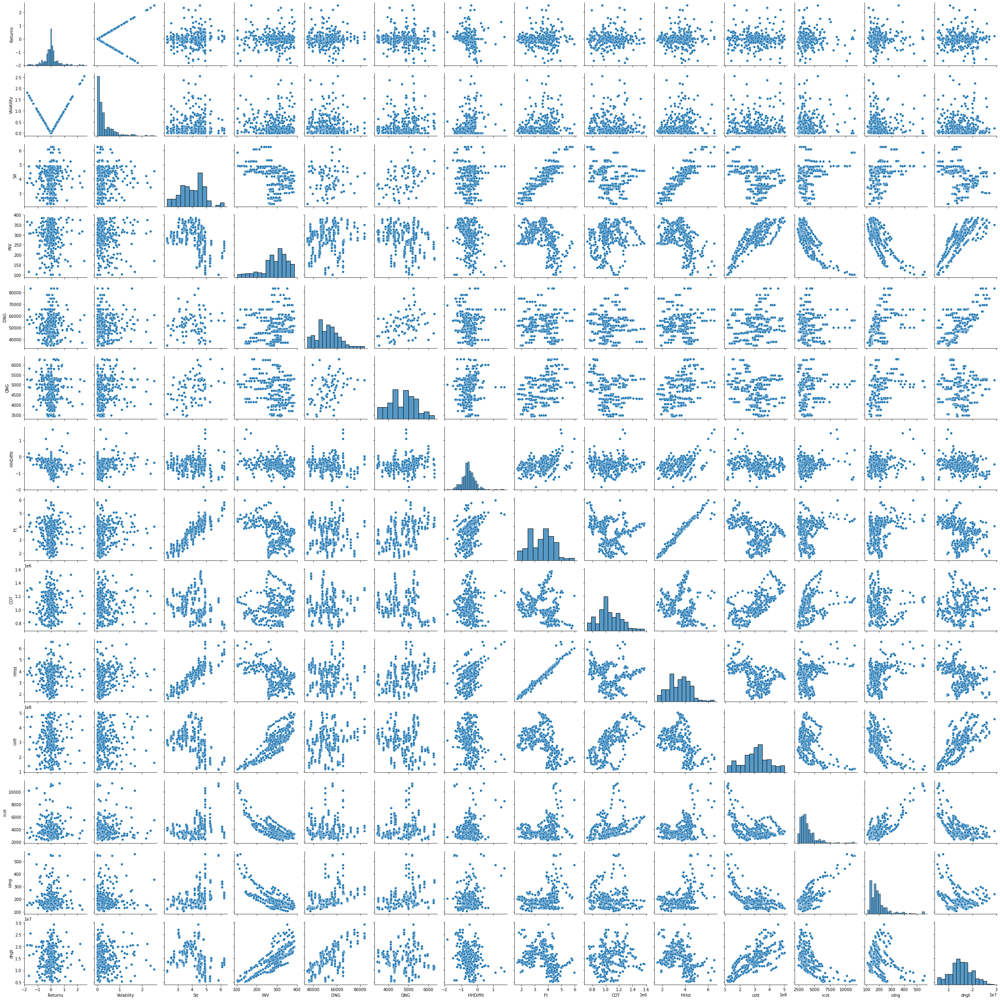

In [60]:
sns.pairplot(fds_Pacific)
plt.show()

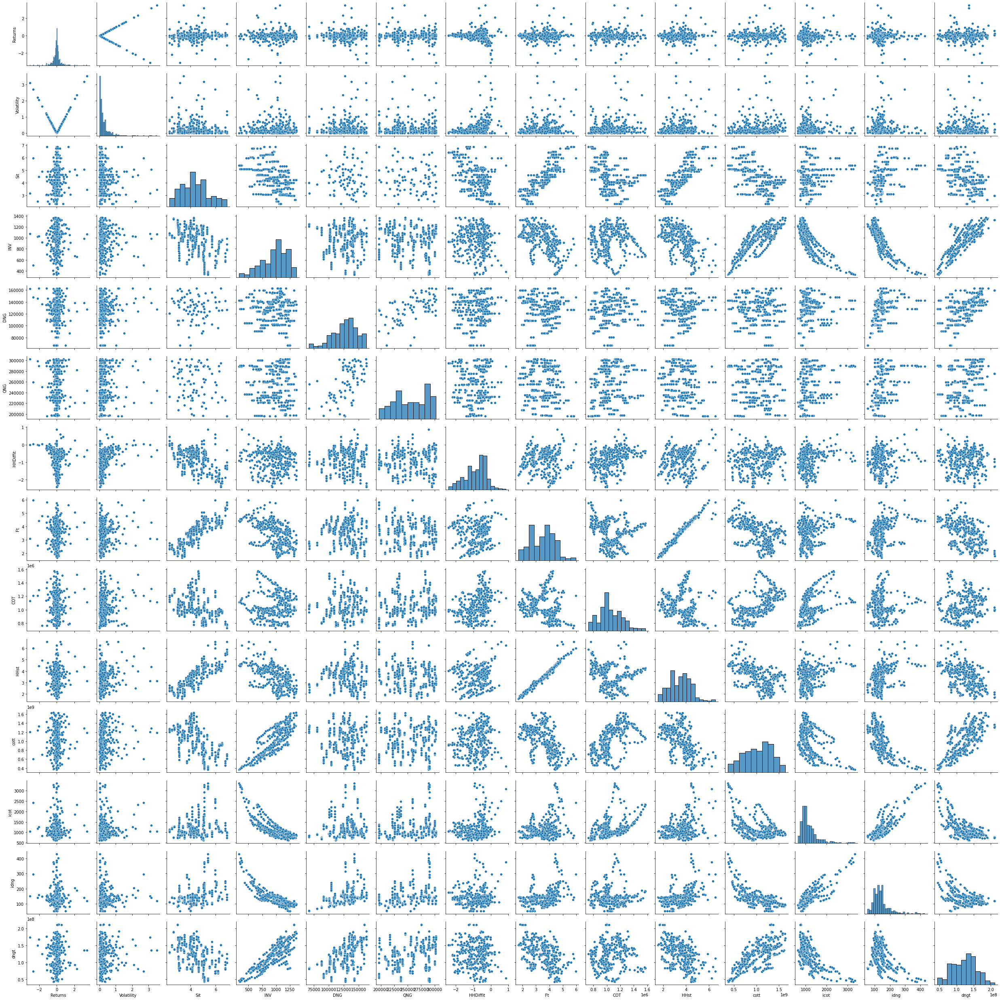

In [61]:
sns.pairplot(fds_SC)
plt.show()

# End: Seaborn Pairplots

# Begin: Histogram of Nodes

In [62]:
node

East             366
Midwest          366
Mountain         366
Pacific          366
South Central    366
Name: Node, dtype: int64

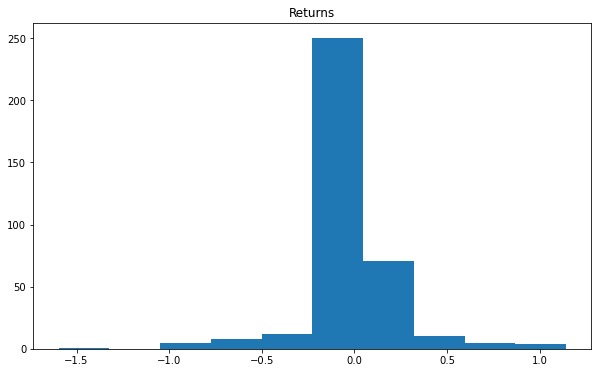

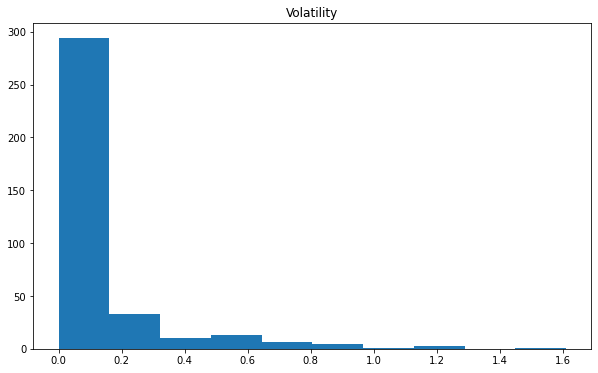

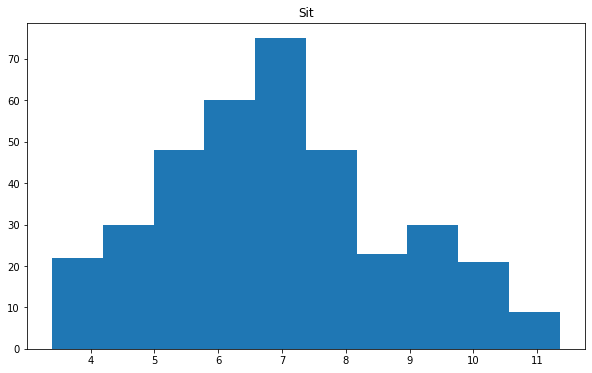

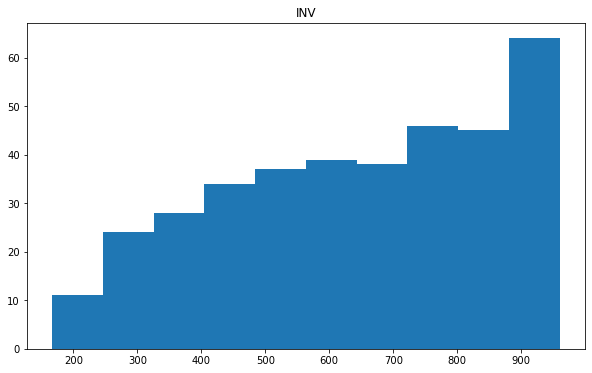

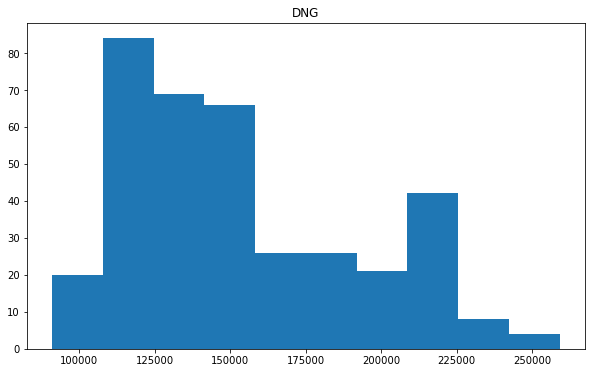

...

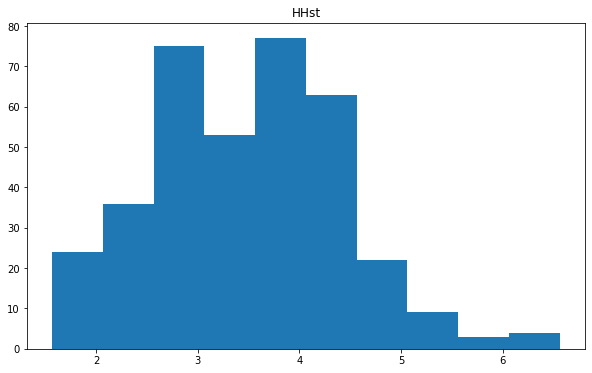

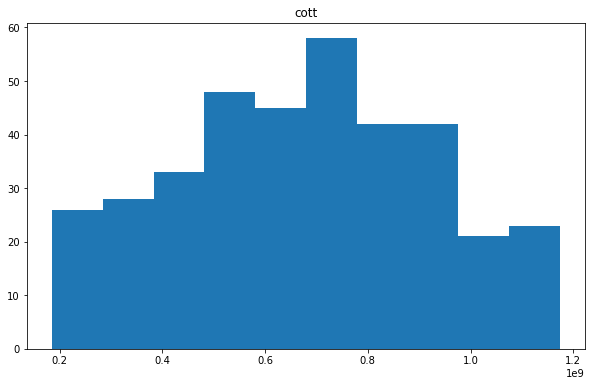

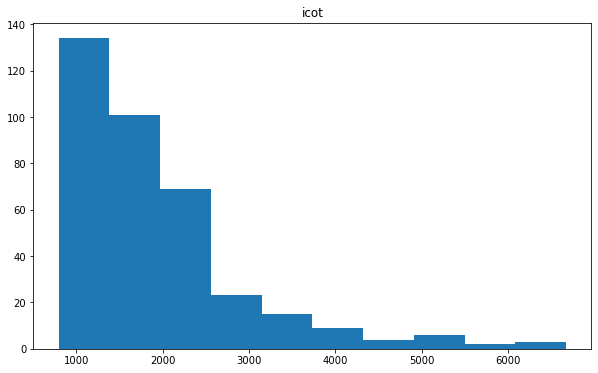

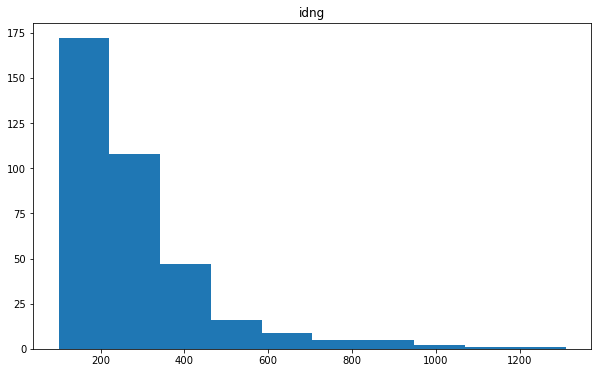

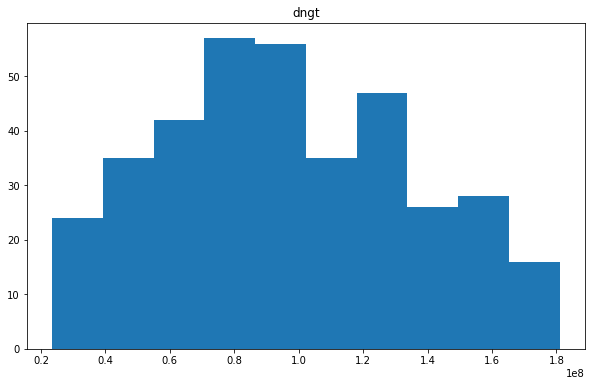

In [63]:
for col in cols_date:
    plt.figure(figsize=(10,6))
    plt.hist(fds_East[col])
    plt.title(col)
    plt.show()
    print()

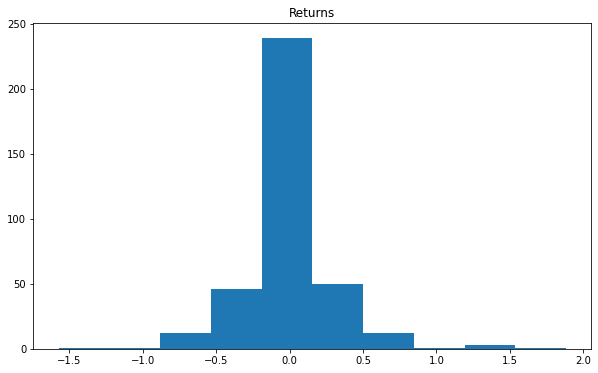

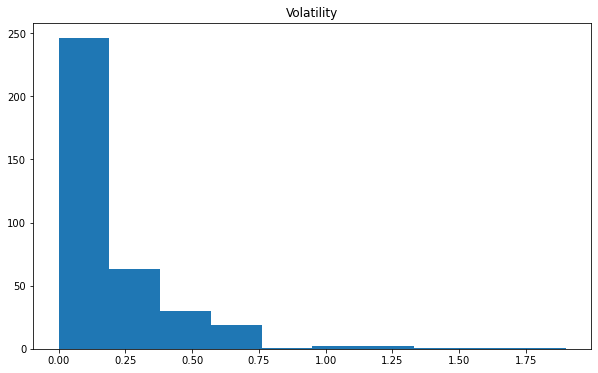

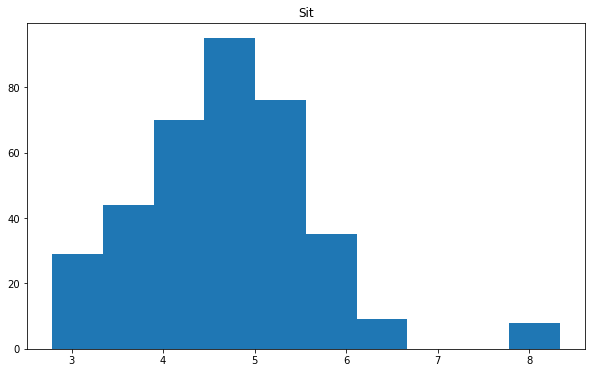

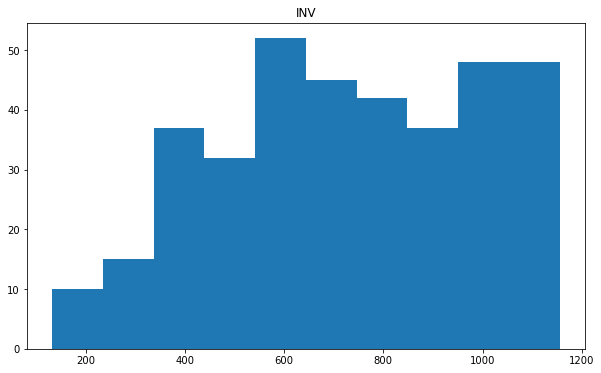

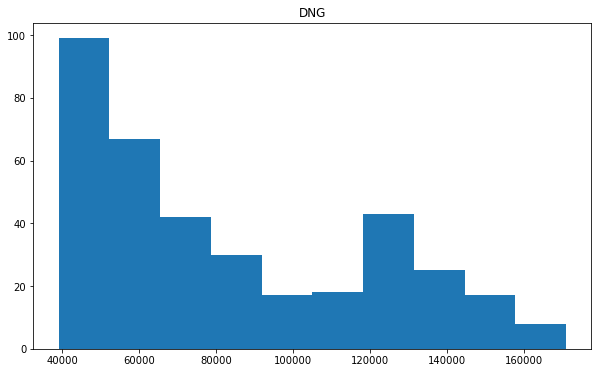

...

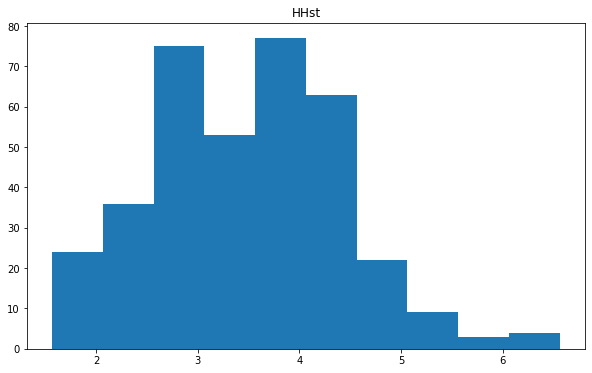

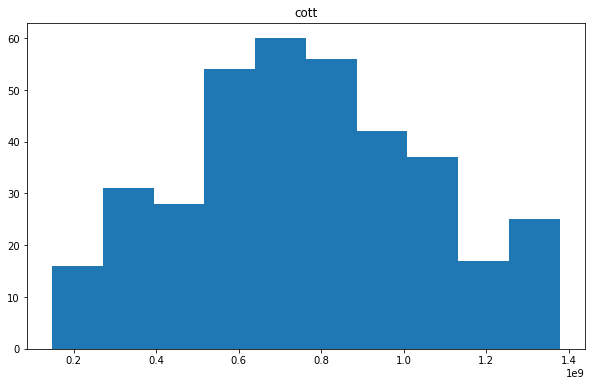

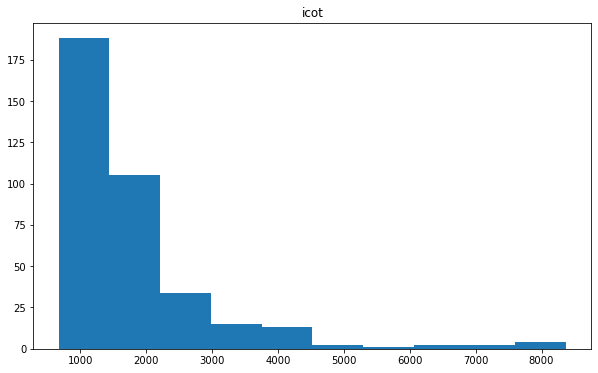

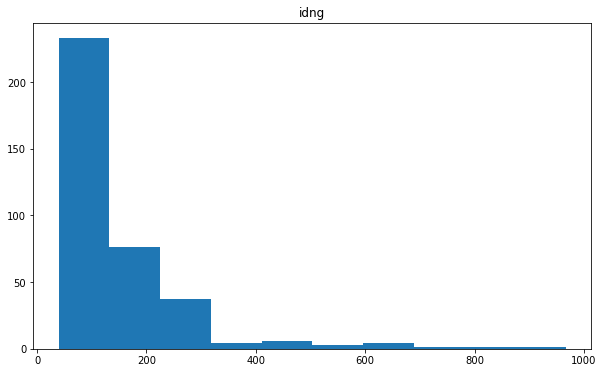

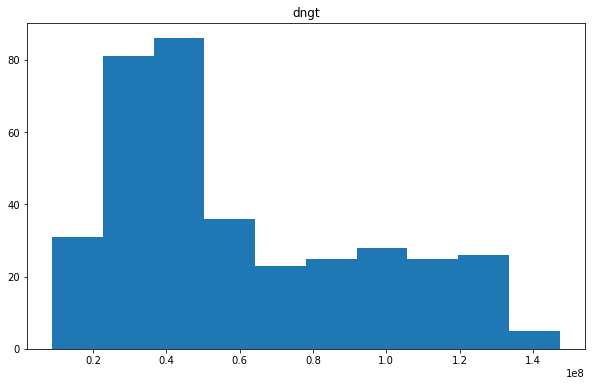

In [64]:
for col in cols_date:
    plt.figure(figsize=(10,6))
    plt.hist(fds_Midwest[col])
    plt.title(col)
    plt.show()
    print()

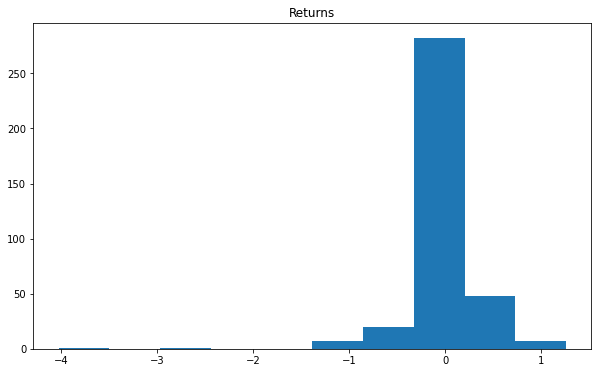

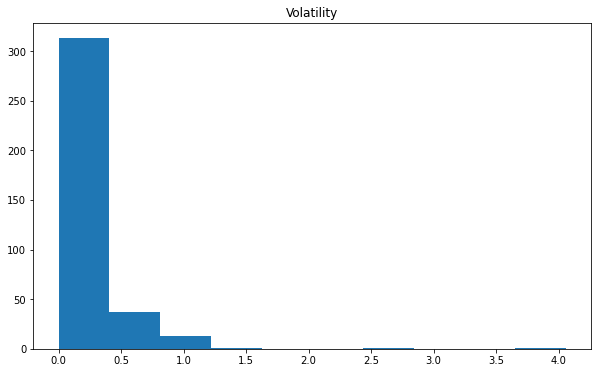

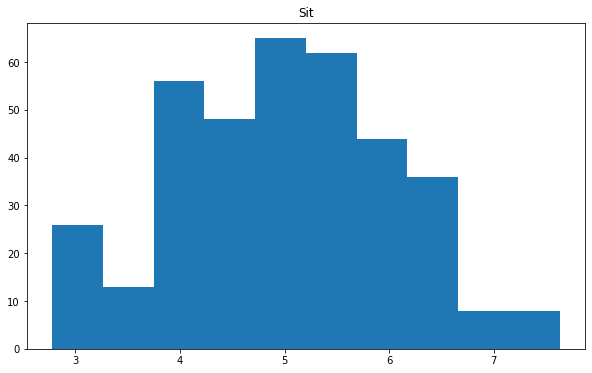

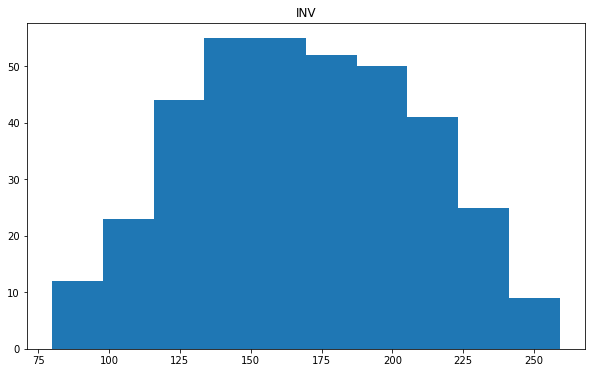

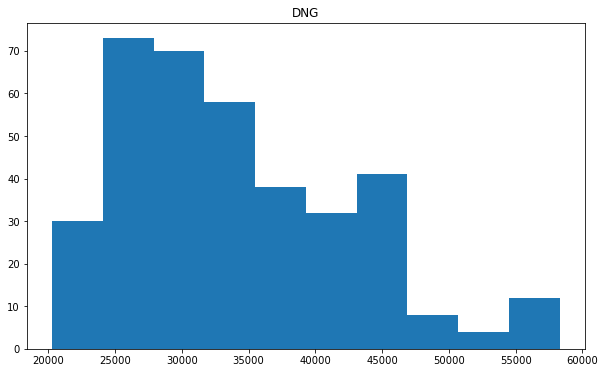

...

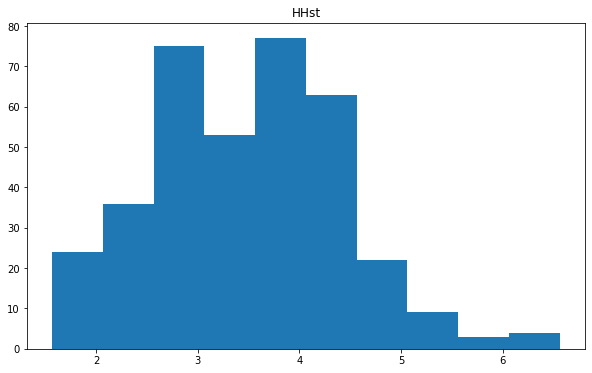

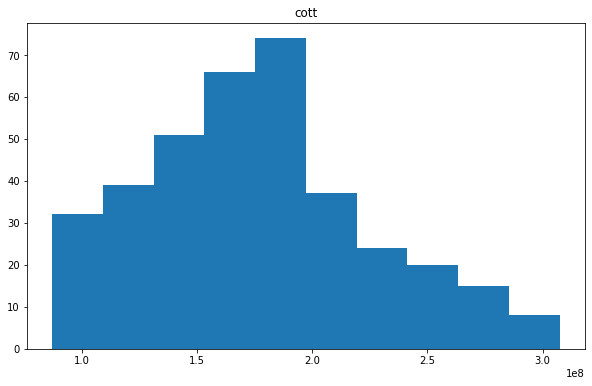

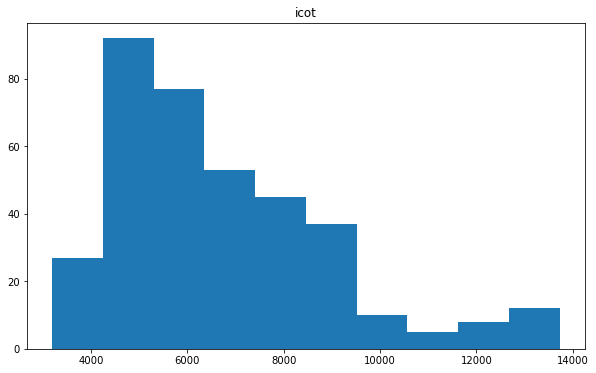

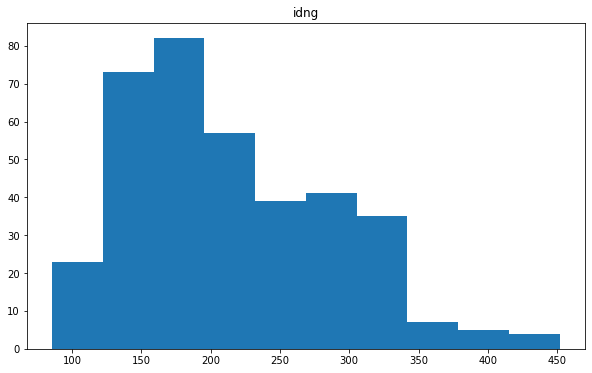

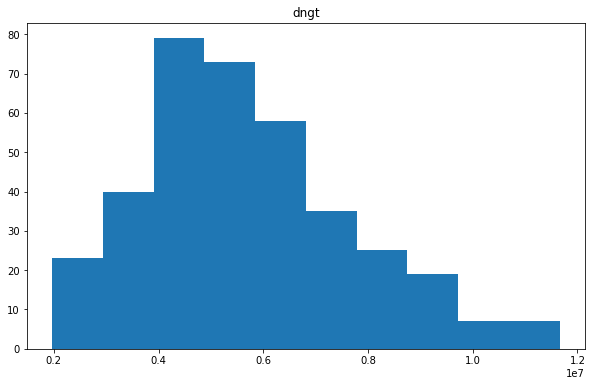

In [65]:
for col in cols_date:
    plt.figure(figsize=(10,6))
    plt.hist(fds_Mountain[col])
    plt.title(col)
    plt.show()
    print()

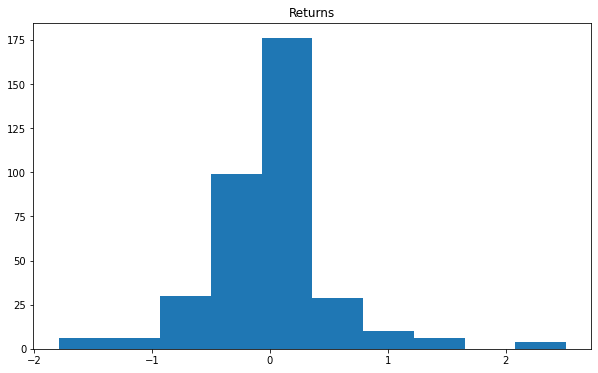

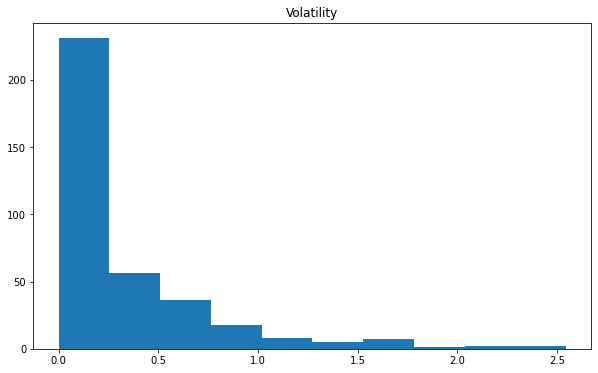

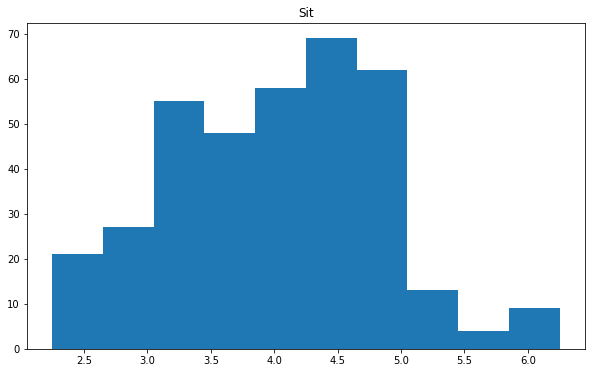

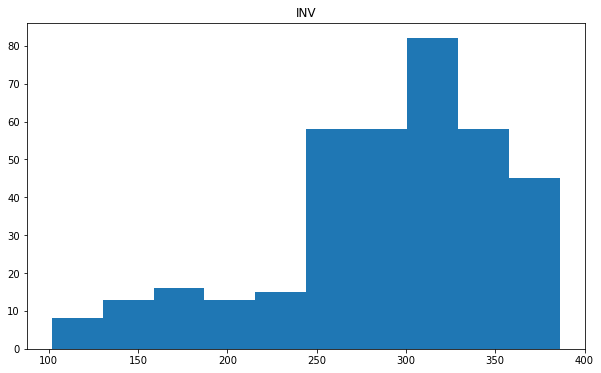

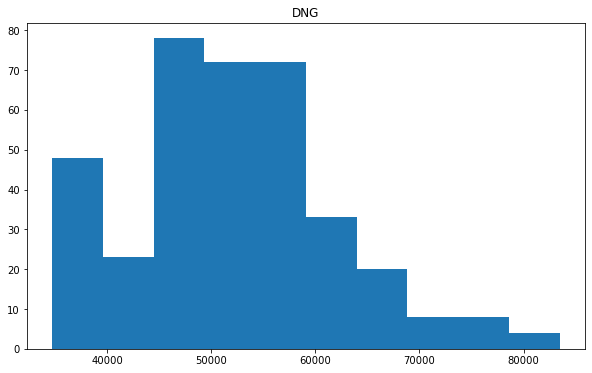

...

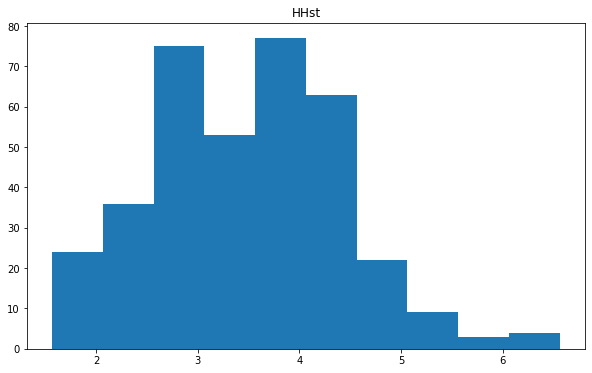

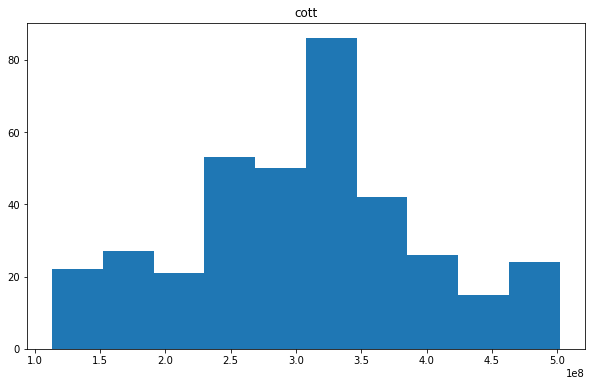

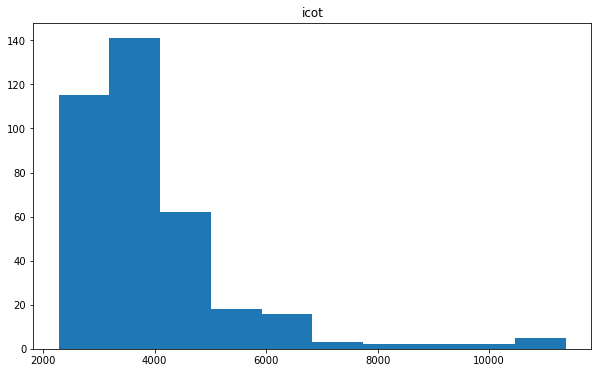

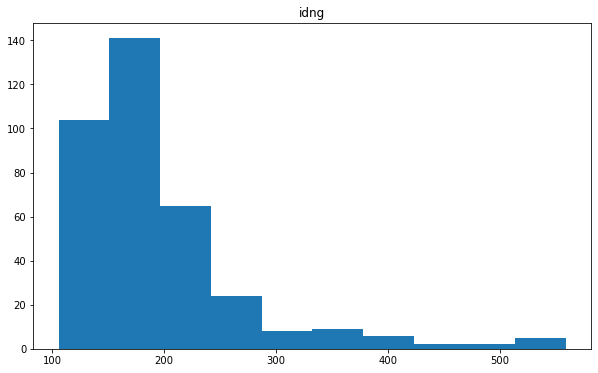

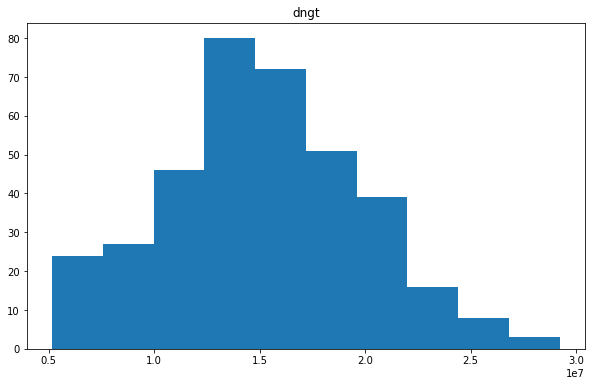

In [66]:
for col in cols_date:
    plt.figure(figsize=(10,6))
    plt.hist(fds_Pacific[col])
    plt.title(col)
    plt.show()
    print()

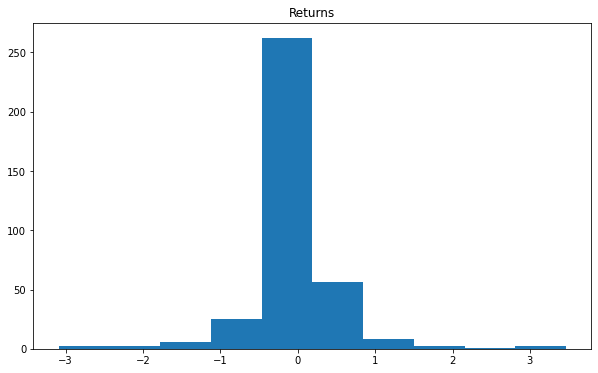

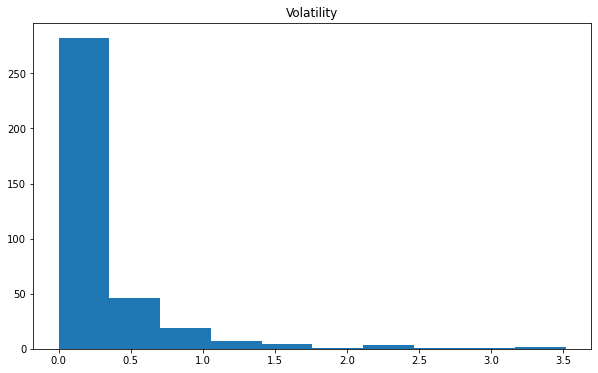

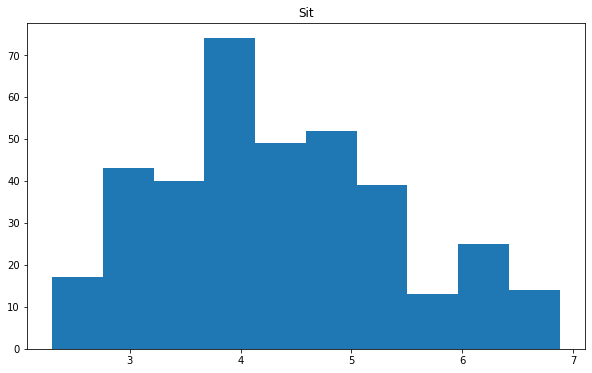

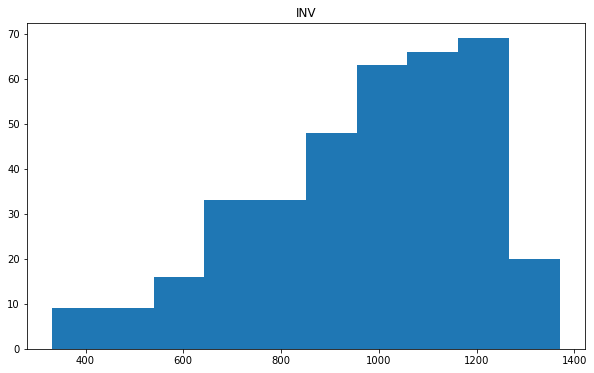

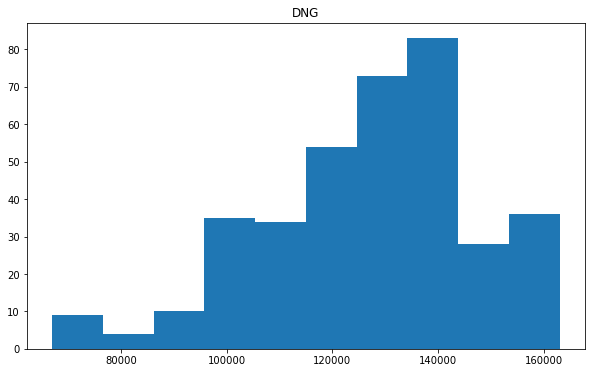

...

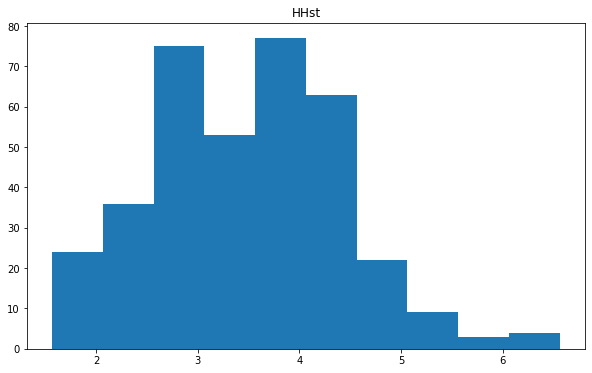

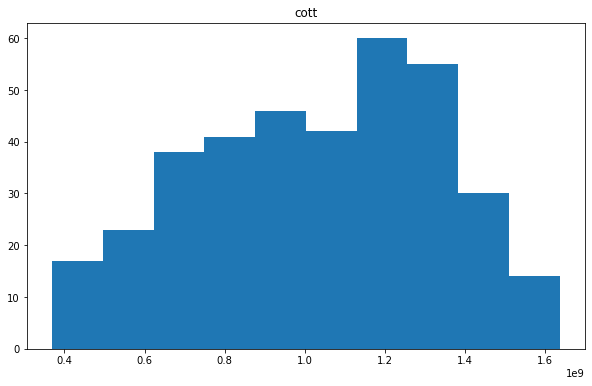

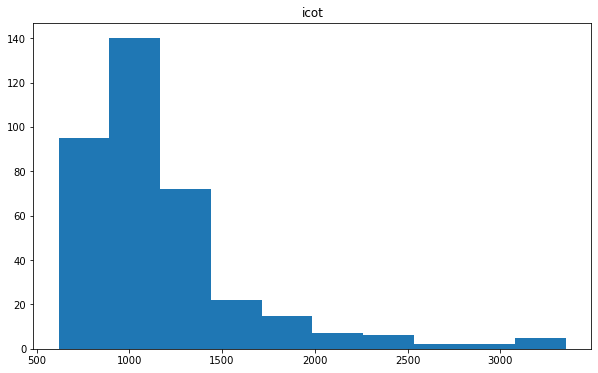

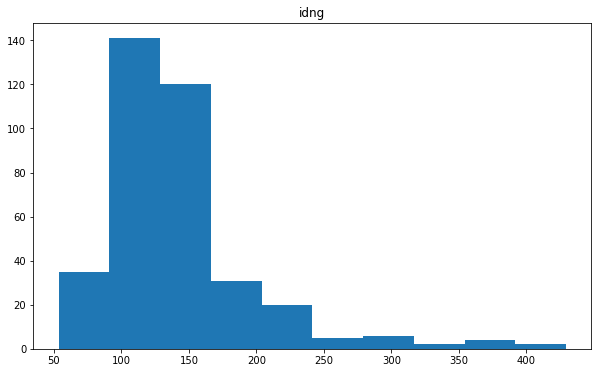

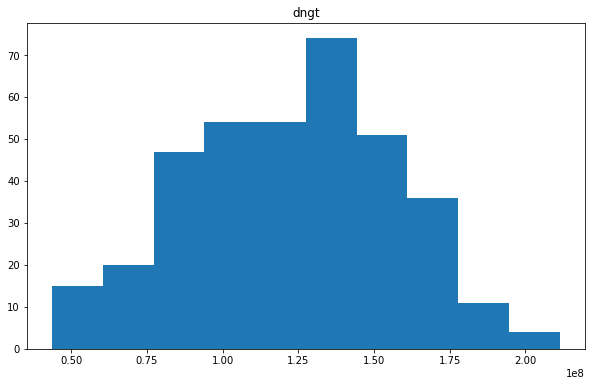

In [67]:
for col in cols_date:
    plt.figure(figsize=(10,6))
    plt.hist(fds_SC[col])
    plt.title(col)
    plt.show()
    print()

# End: Histogram of Nodes

# Begin: Line plots of Nodes

In [68]:
node

East             366
Midwest          366
Mountain         366
Pacific          366
South Central    366
Name: Node, dtype: int64

In [69]:
fds_East.describe()

,Returns,Volatility,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
count,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,366.000000,3.660000e+02,366.000000,3.660000e+02,366.000000,366.000000,3.660000e+02
mean,-0.001803,0.124430,6.959399,643.286885,152808.677596,86671.005464,-3.471421,3.493694,1.055391e+06,3.487978,6.755678e+08,1934.384238,282.401225,9.731731e+07
std,0.246127,0.215037,1.775059,215.518749,39200.012165,48377.842786,1.503977,0.873156,1.751522e+05,0.937066,2.449250e+08,1038.406048,173.915042,3.872576e+07
min,-1.596309,0.000000,3.400000,167.000000,91133.000000,13475.000000,-7.230000,1.687000,7.240870e+05,1.570000,1.859091e+08,796.924468,99.804188,2.354869e+07
25%,-0.039512,0.017746,5.677500,468.500000,121722.500000,41924.200000,-4.475000,2.773000,9.493555e+05,2.790000,4.902404e+08,1235.966349,163.948192,6.898085e+07
50%,0.000000,0.042248,6.870000,662.000000,143668.000000,81122.500000,-3.180000,3.611500,1.019501e+06,3.540000,6.865678e+08,1578.007302,227.676694,9.388335e+07
75%,0.046308,0.119048,8.022500,836.750000,181102.025000,132187.387500,-2.342500,4.167250,1.174931e+06,4.150000,8.640297e+08,2318.361975,323.581444,1.287942e+08
max,1.142737,1.610057,11.350000,960.000000,259140.250000,173862.750000,-0.260000,5.975000,1.573733e+06,6.560000,1.173169e+09,6667.293413,1310.914671,1.809858e+08


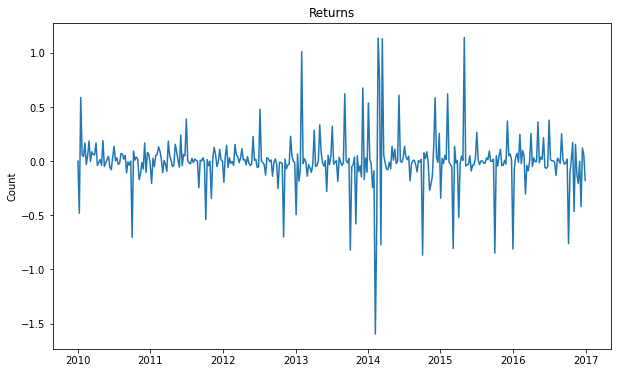

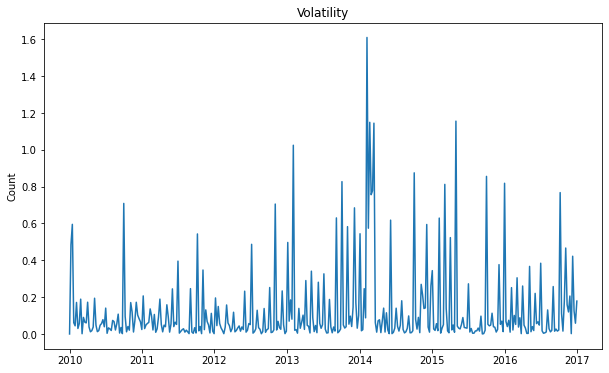

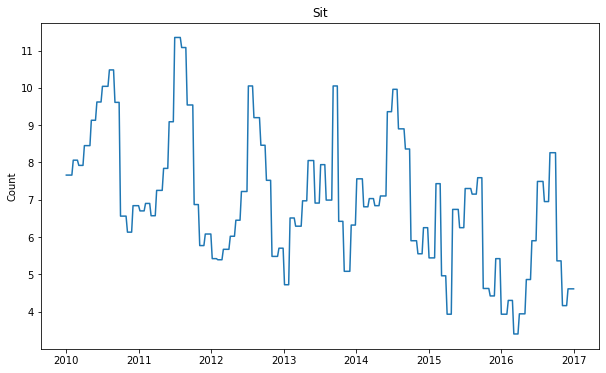

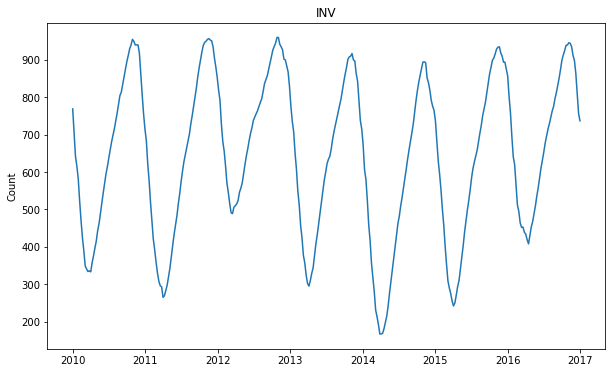

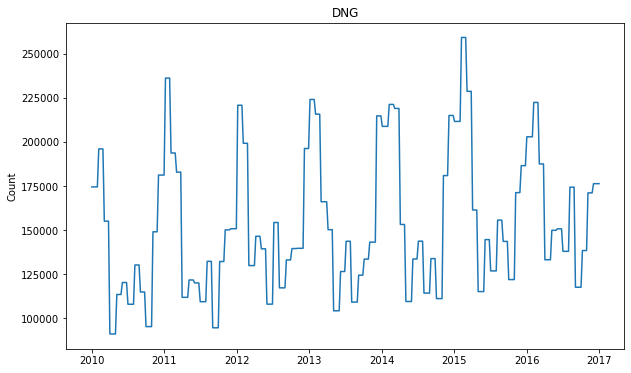

...

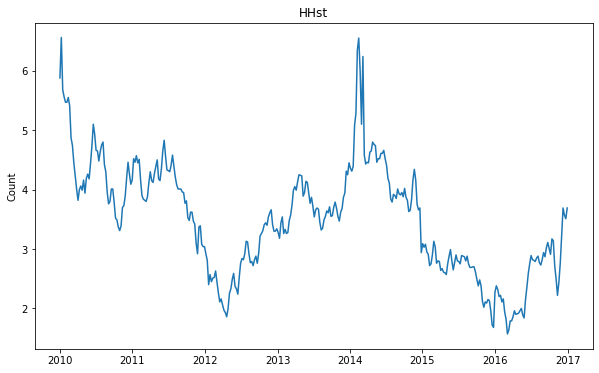

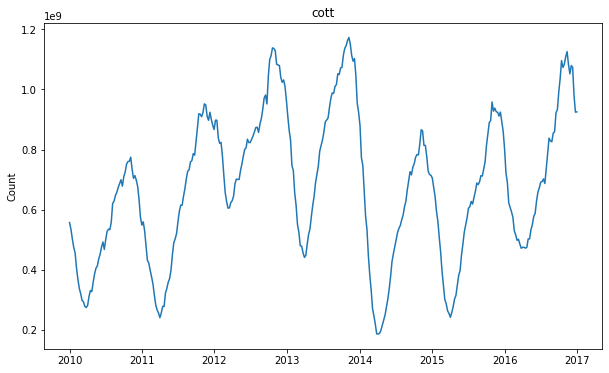

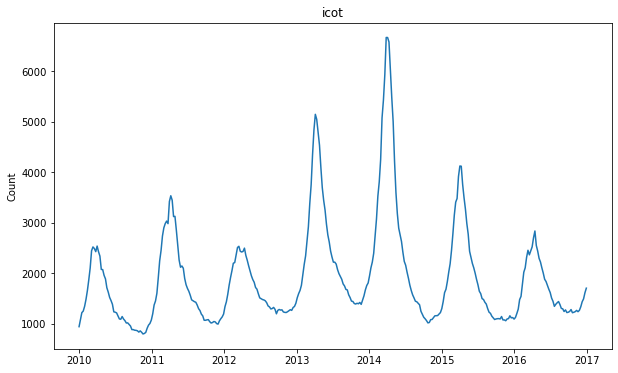

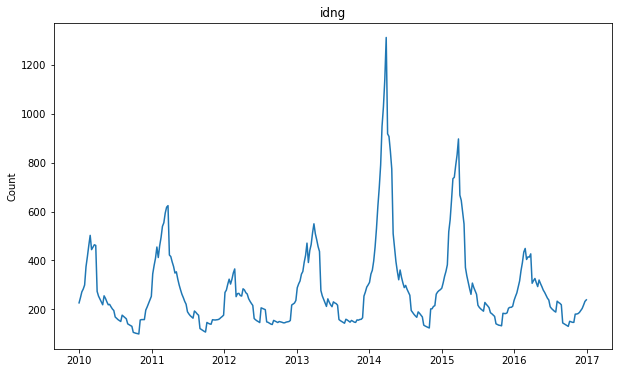

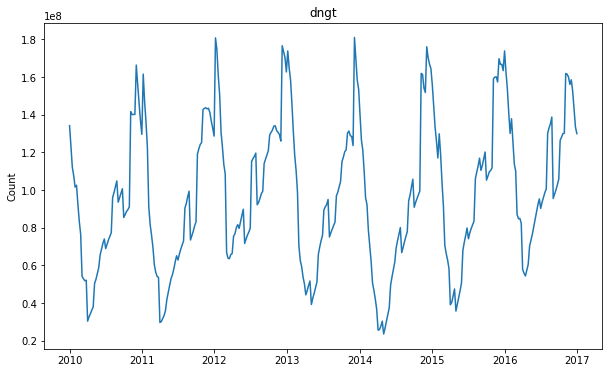

In [70]:
for col in cols_date: 
    plt.figure(figsize=(10,6))
    plt.plot(fds_East[col])
    plt.title(col)
    plt.ylabel("Count")
    plt.show()
    print()

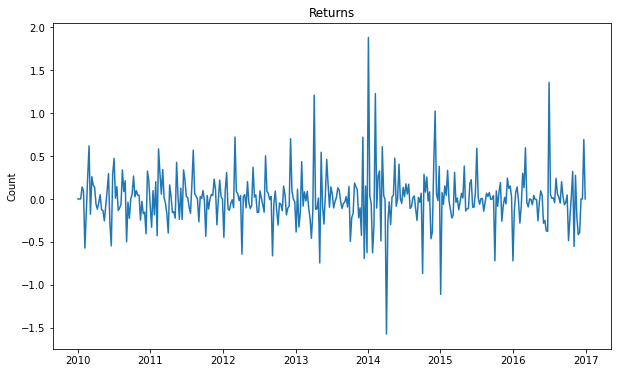

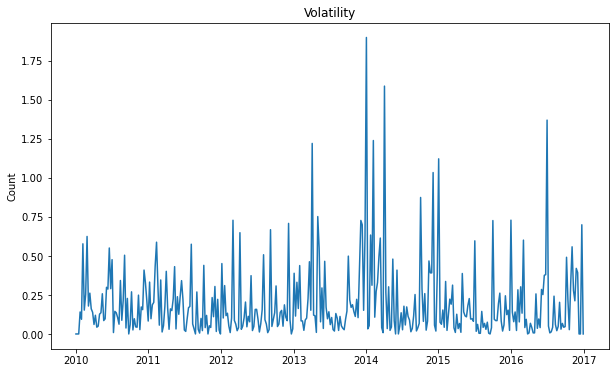

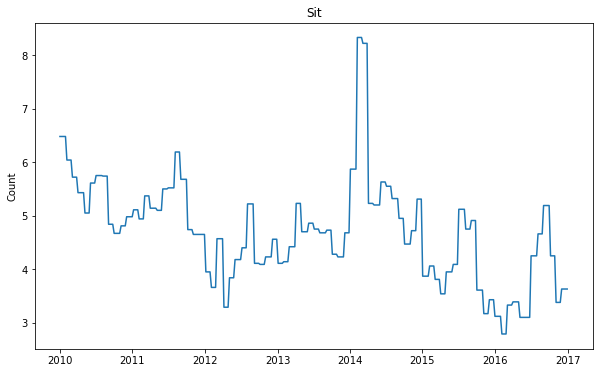

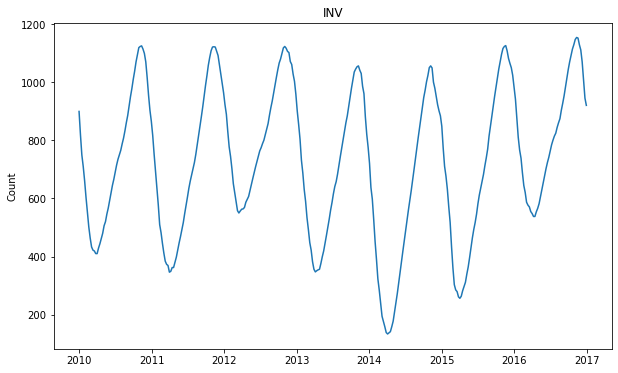

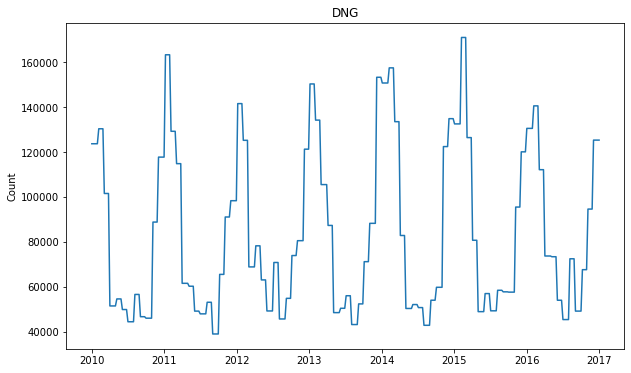

...

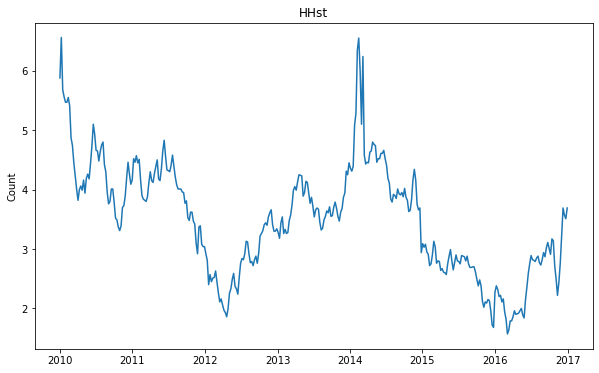

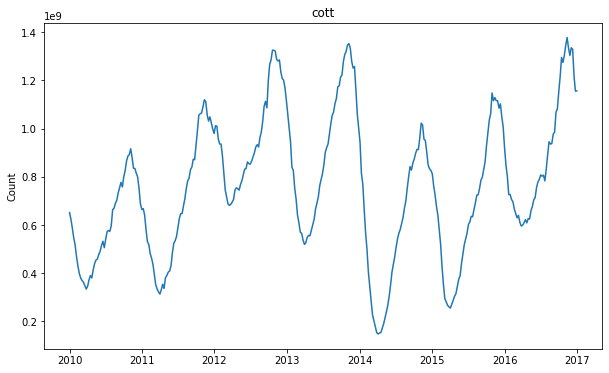

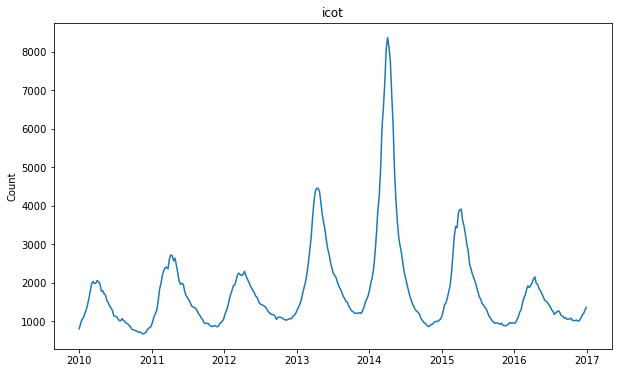

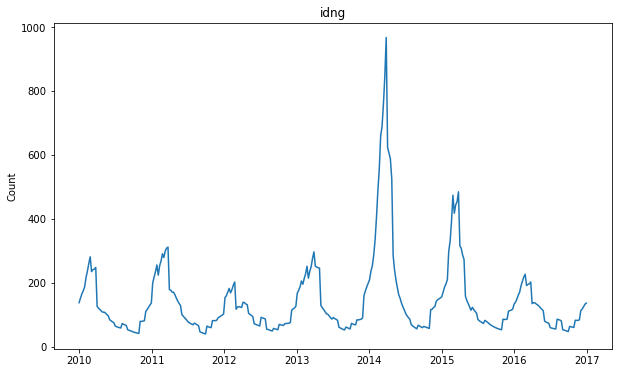

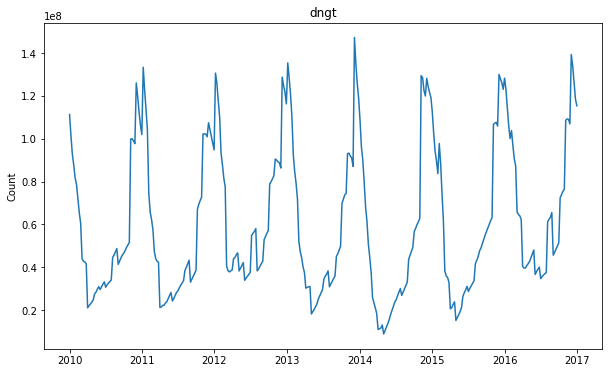

In [71]:
for col in cols_date: 
    plt.figure(figsize=(10,6))
    plt.plot(fds_Midwest[col])
    plt.title(col)
    plt.ylabel("Count")
    plt.show()
    print()

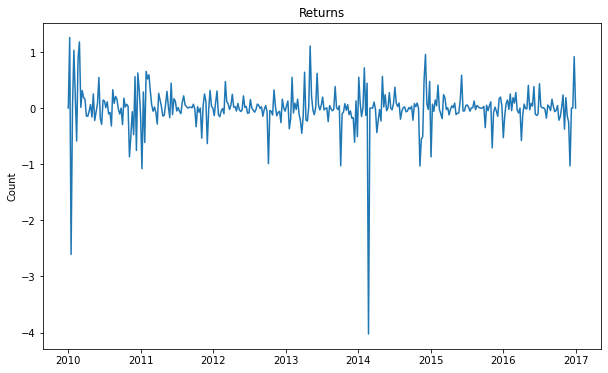

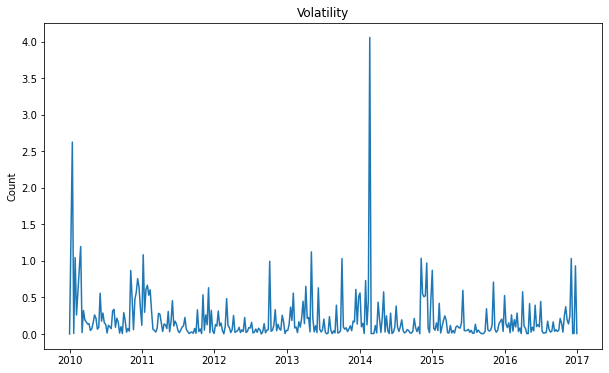

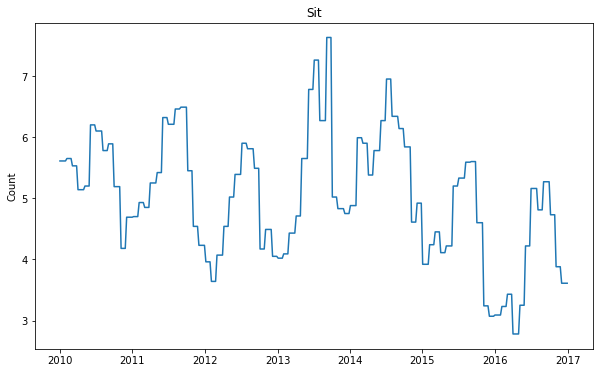

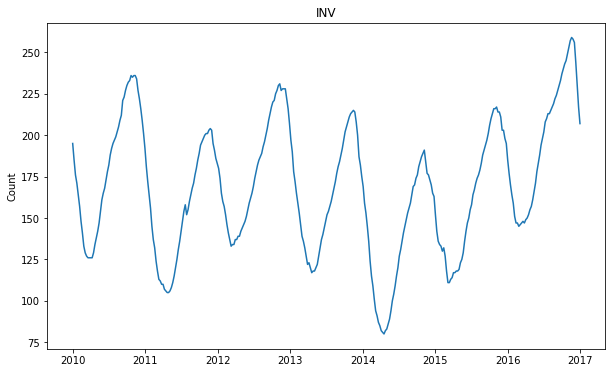

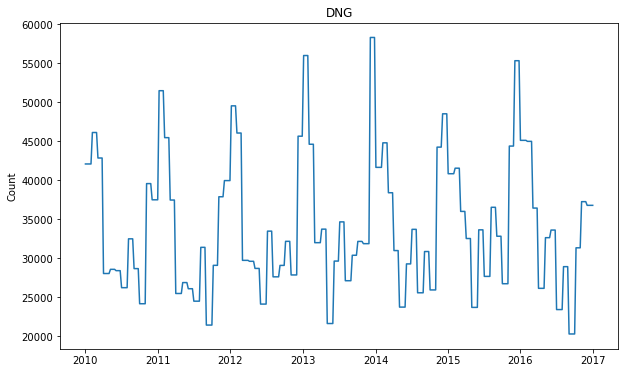

...

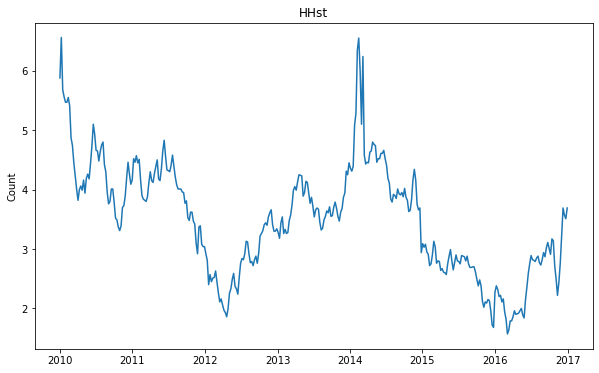

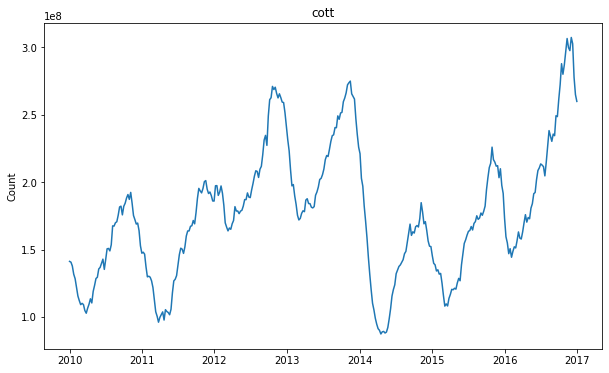

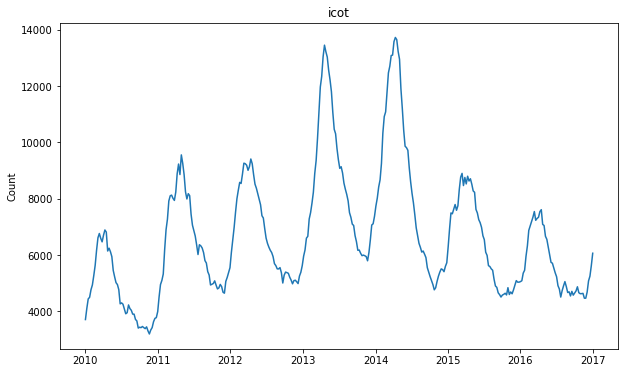

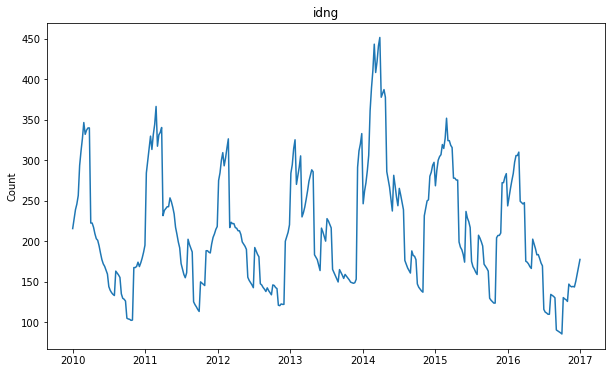

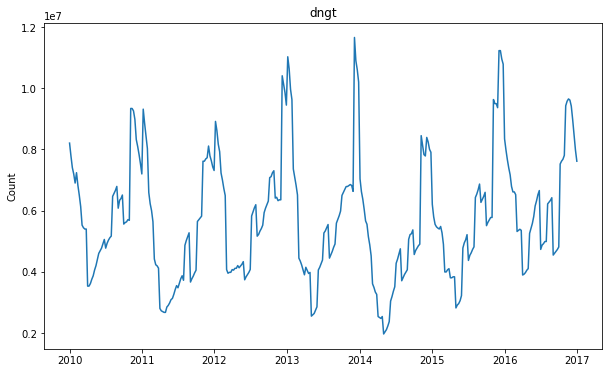

In [72]:
for col in cols_date: 
    plt.figure(figsize=(10,6))
    plt.plot(fds_Mountain[col])
    plt.title(col)
    plt.ylabel("Count")
    plt.show()
    print()

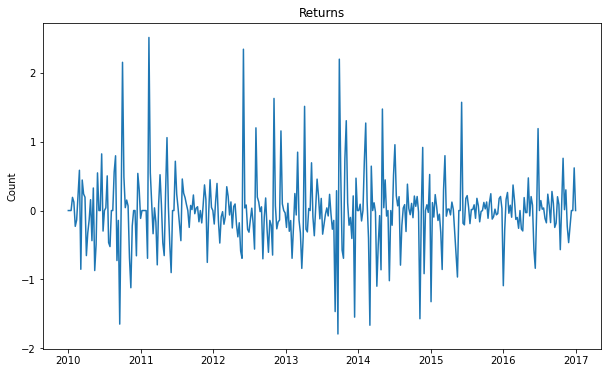

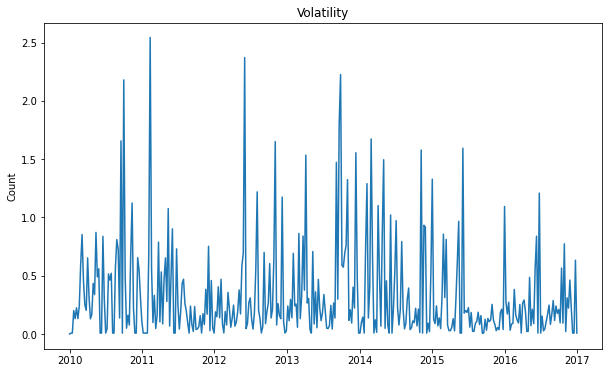

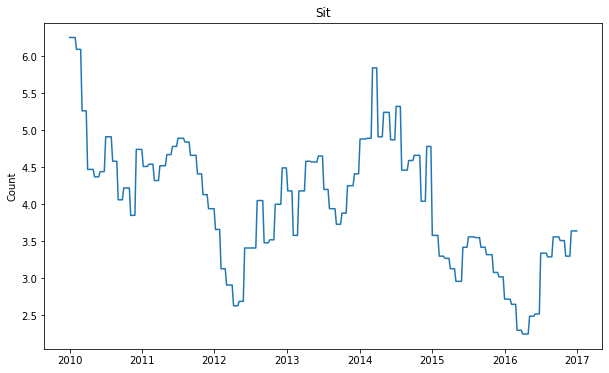

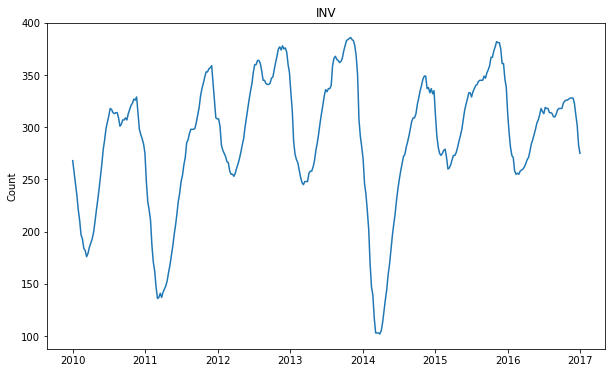

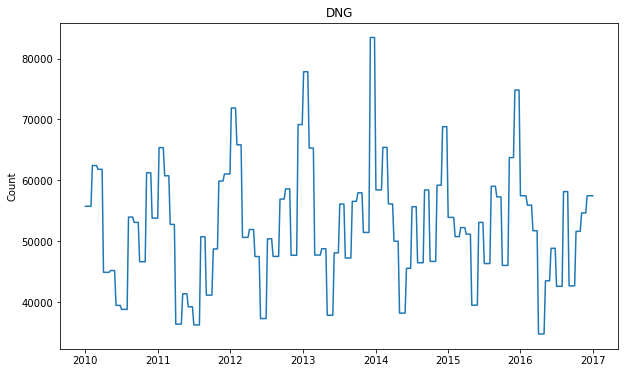

...

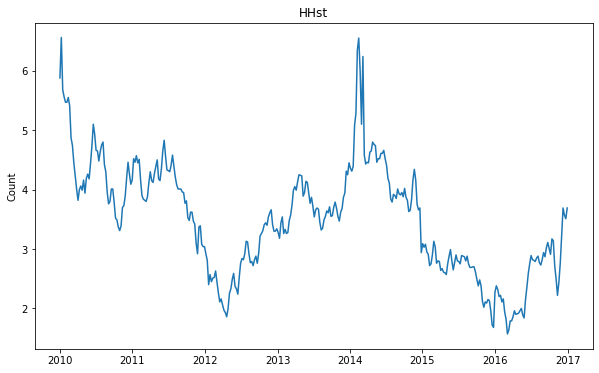

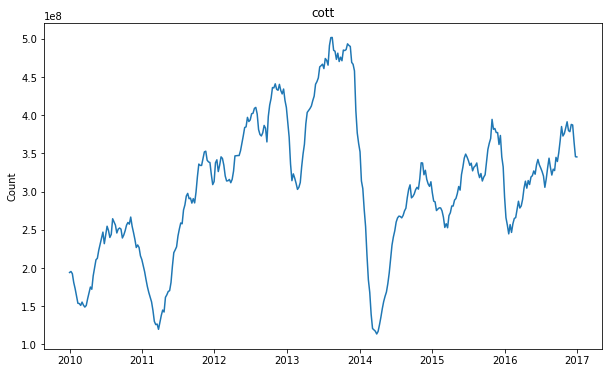

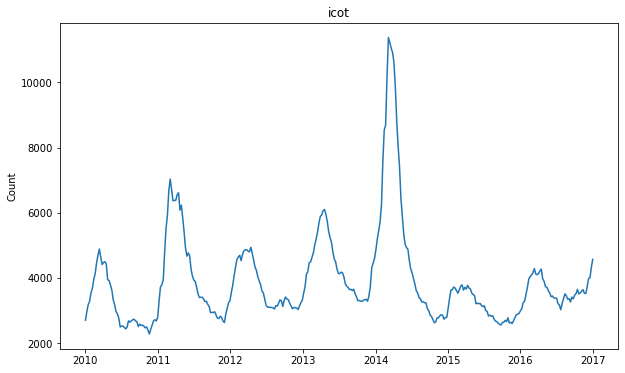

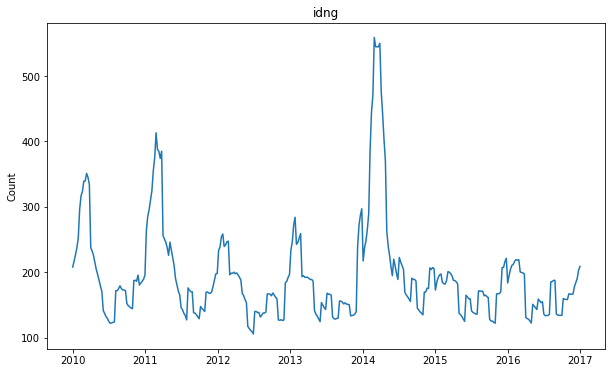

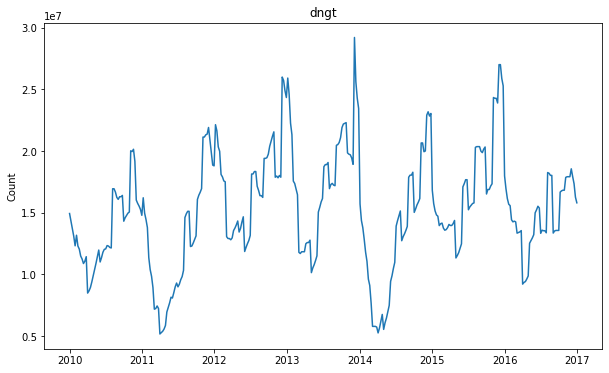

In [73]:
for col in cols_date: 
    plt.figure(figsize=(10,6))
    plt.plot(fds_Pacific[col])
    plt.title(col)
    plt.ylabel("Count")
    plt.show()
    print()

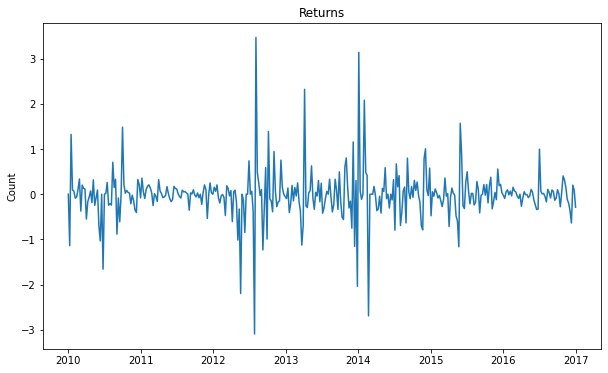

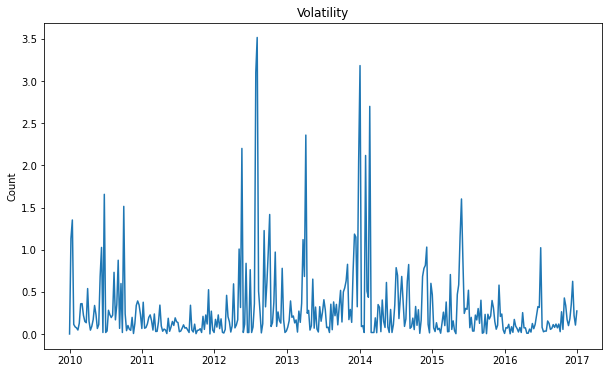

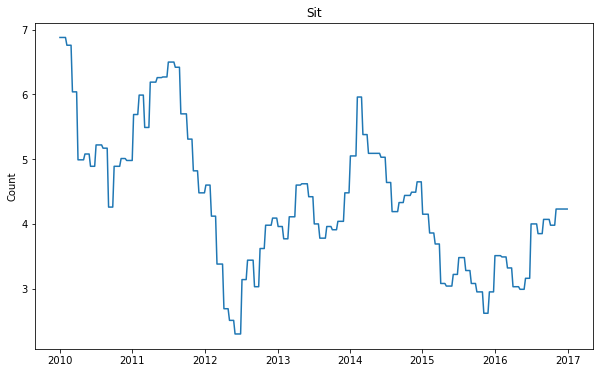

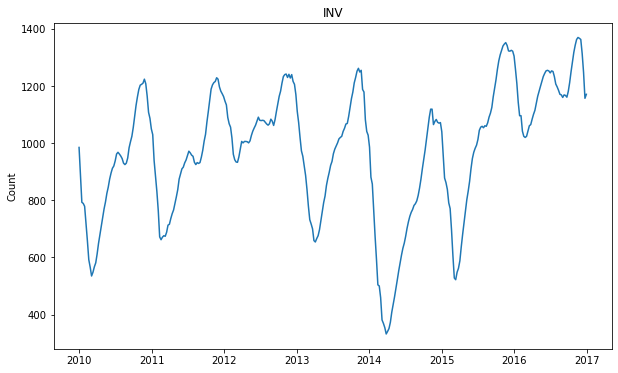

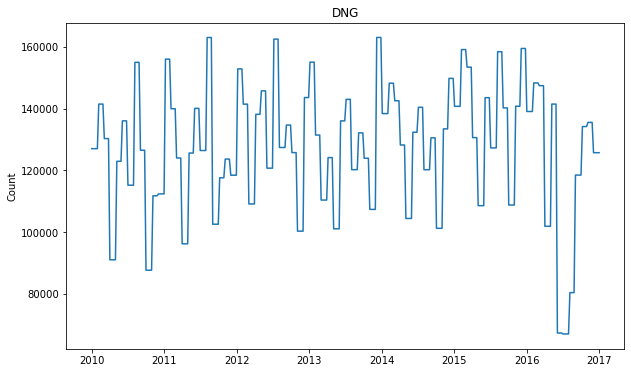

...

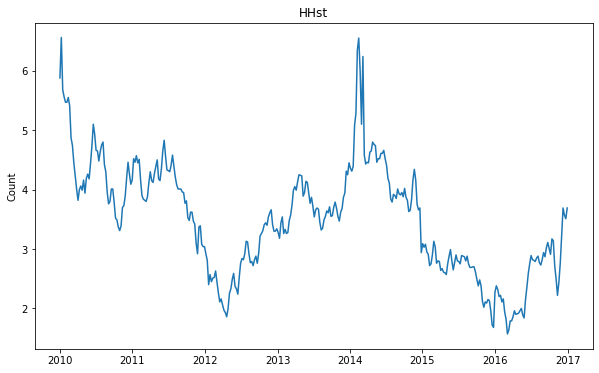

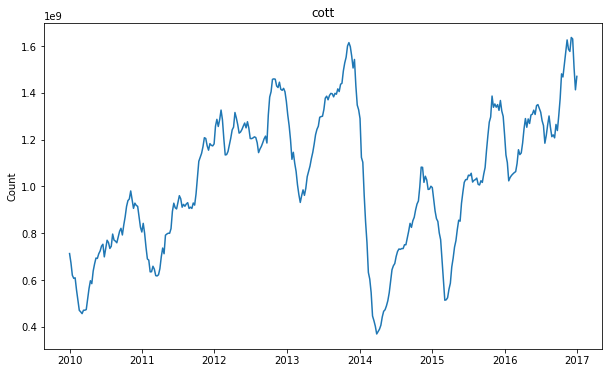

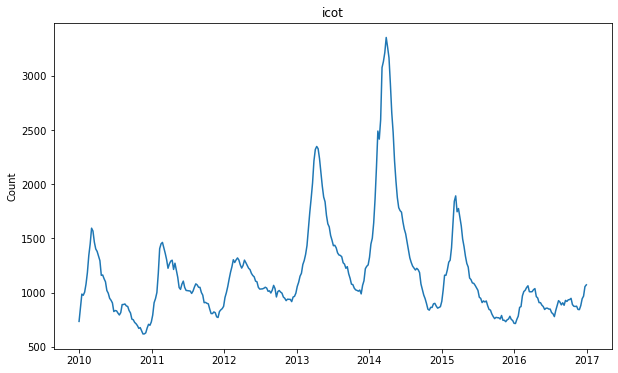

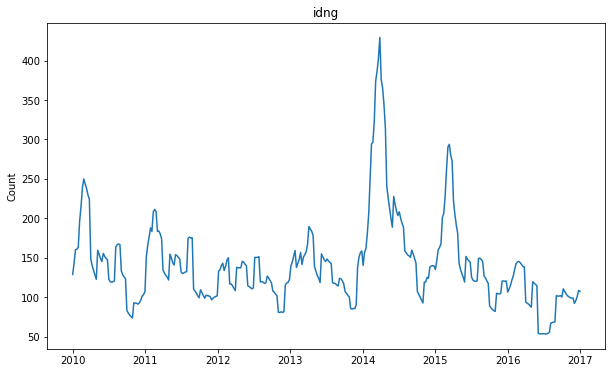

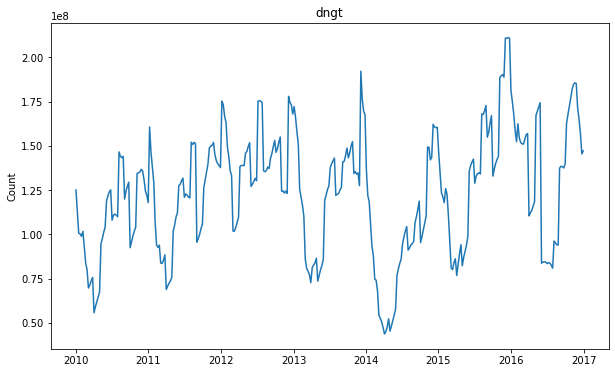

In [74]:
for col in cols_date: 
    plt.figure(figsize=(10,6))
    plt.plot(fds_SC[col])
    plt.title(col)
    plt.ylabel("Count")
    plt.show()
    print()

# End: Line plots of Nodes

## Begin: Scatter Plots

In [75]:
node

East             366
Midwest          366
Mountain         366
Pacific          366
South Central    366
Name: Node, dtype: int64

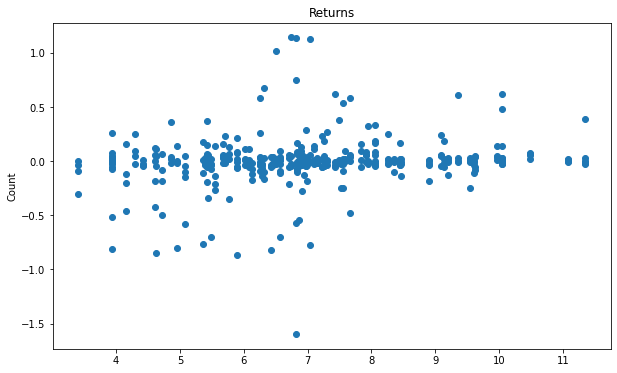

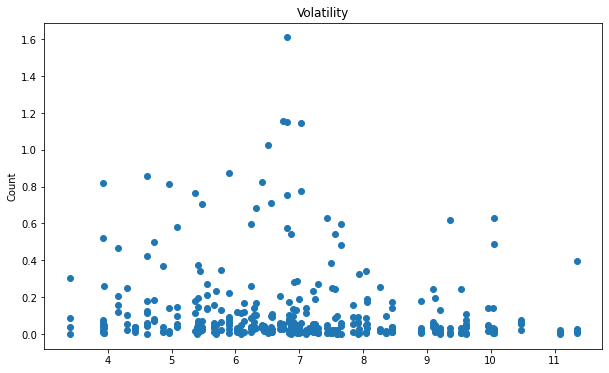

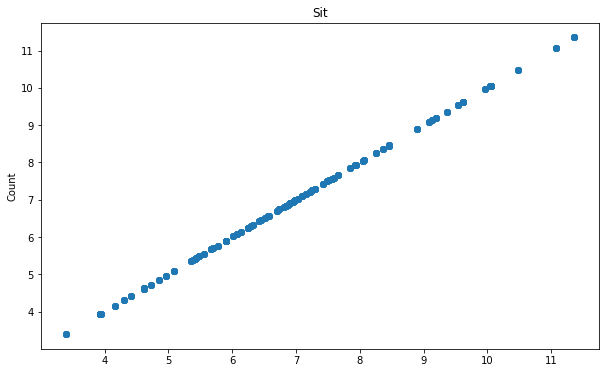

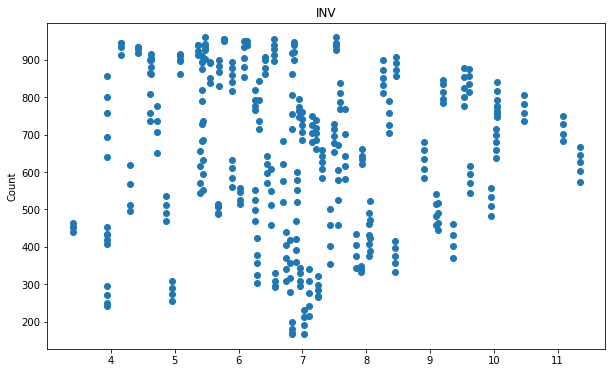

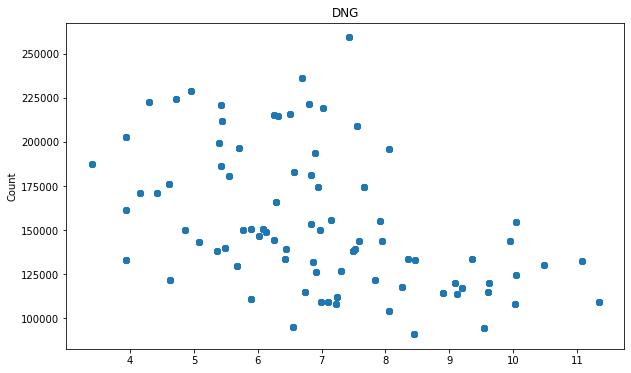

...

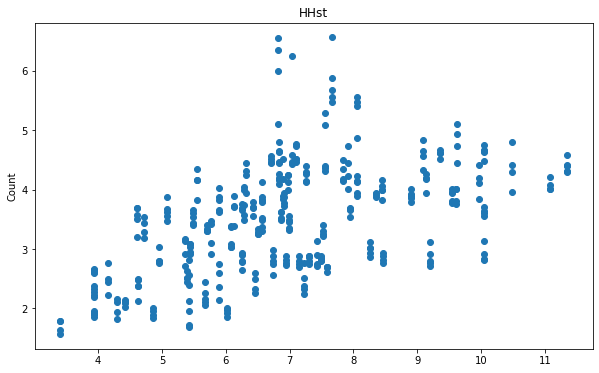

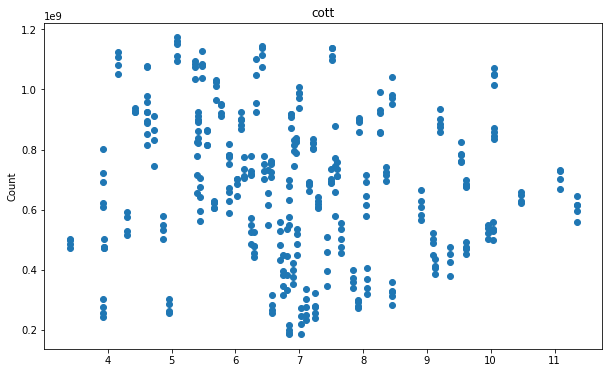

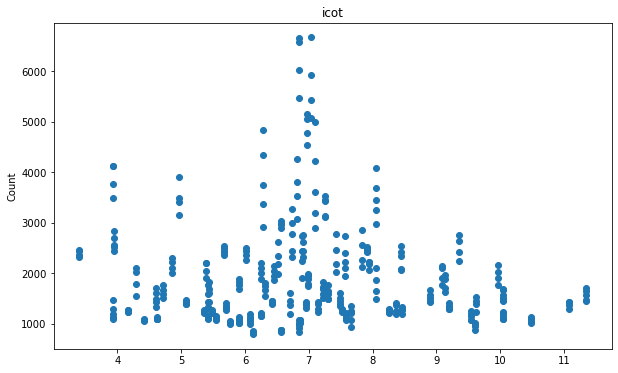

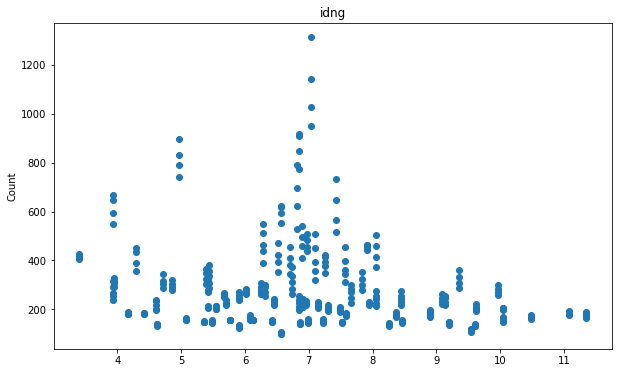

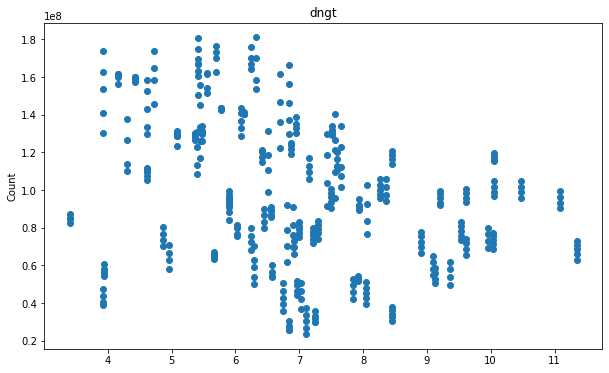

In [76]:
for col in cols_date: 
    plt.figure(figsize=(10,6))
    plt.scatter(fds_East.Sit, fds_East[col])
    plt.title(col)
    plt.ylabel("Count")
    plt.show()
    print()

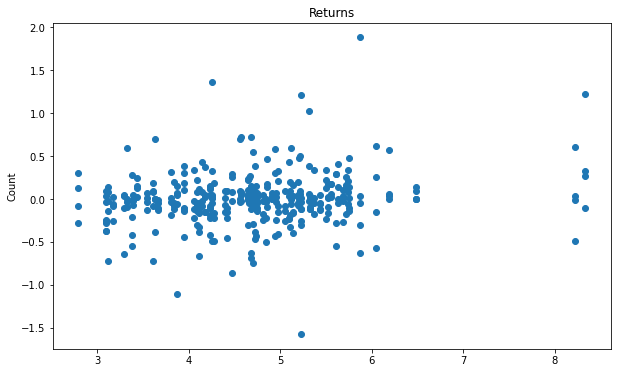

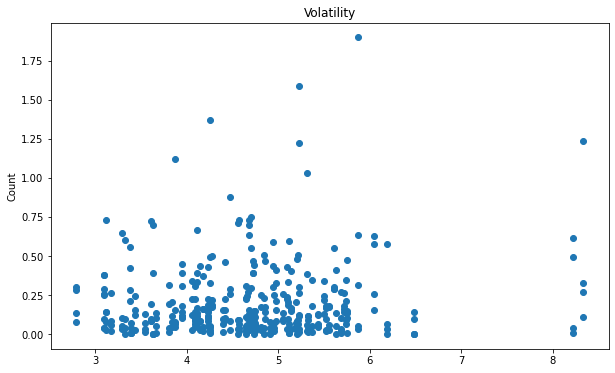

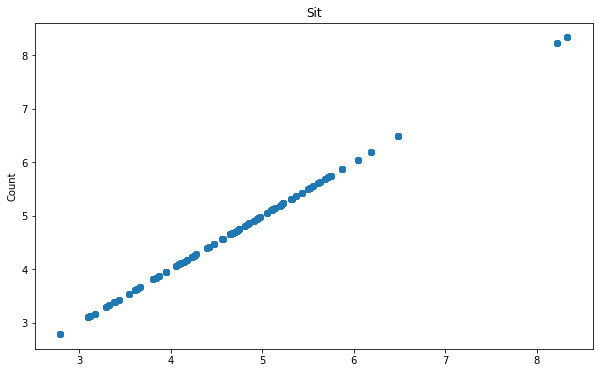

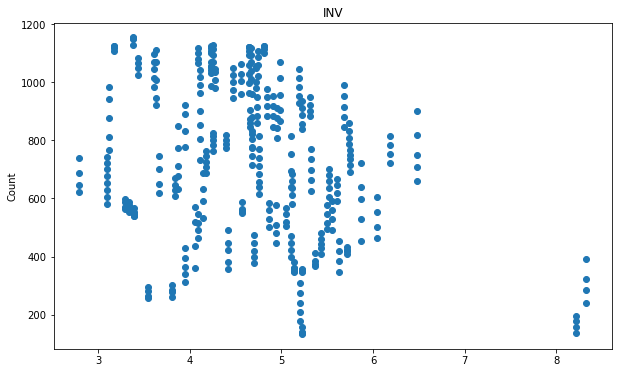

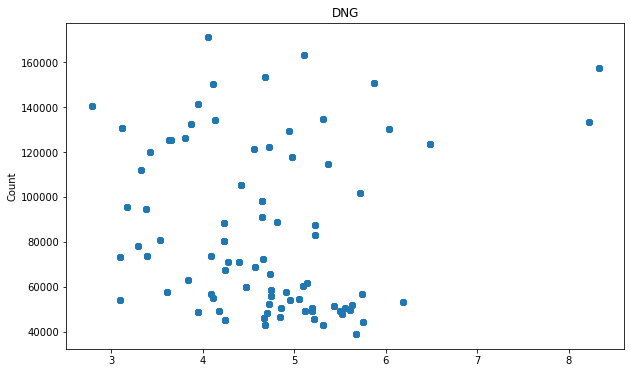

...

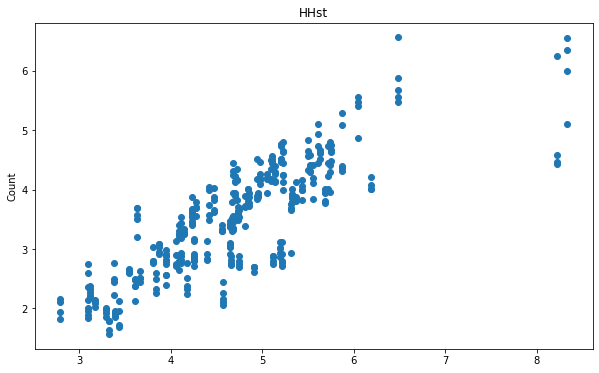

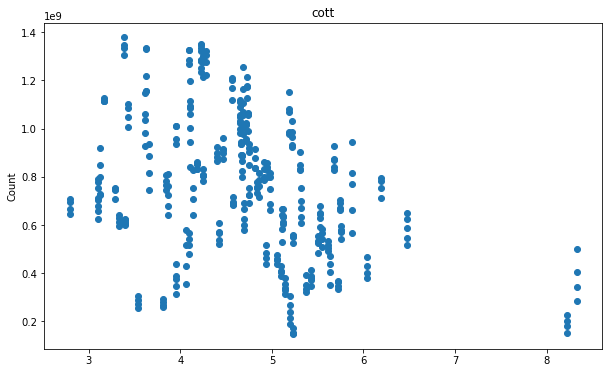

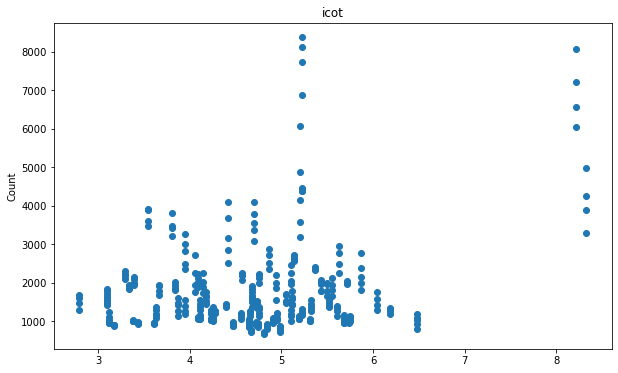

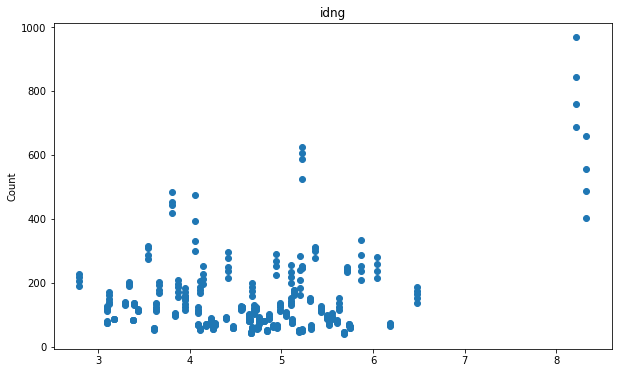

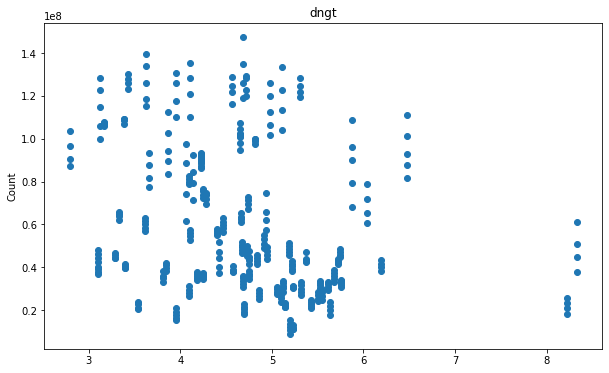

In [77]:
for col in cols_date: 
    plt.figure(figsize=(10,6))
    plt.scatter(fds_Midwest.Sit, fds_Midwest[col])
    plt.title(col)
    plt.ylabel("Count")
    plt.show()
    print()

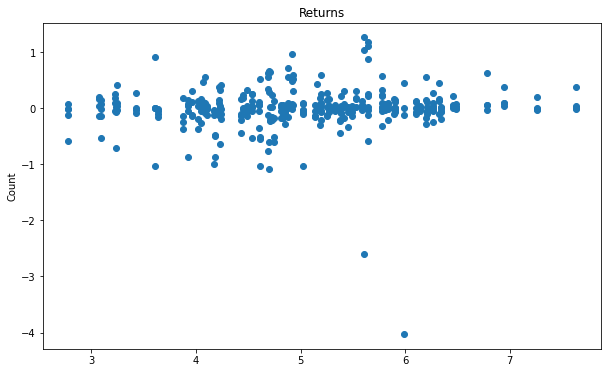

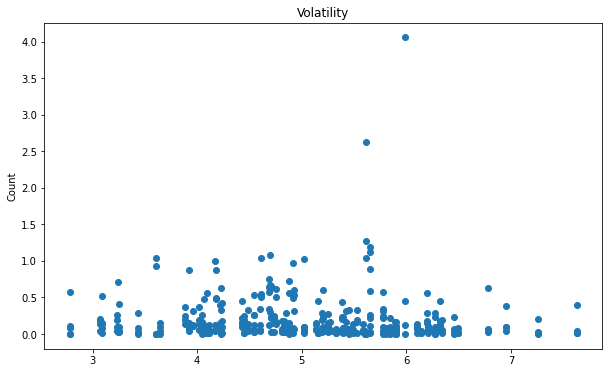

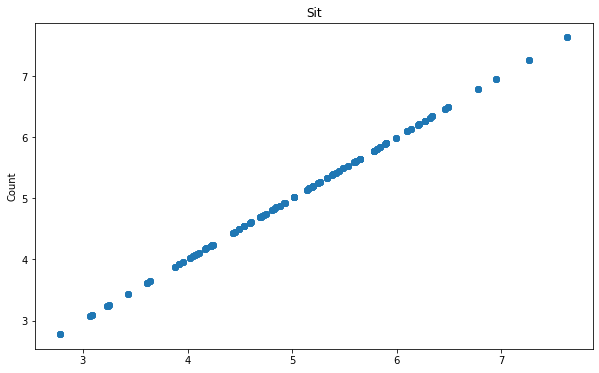

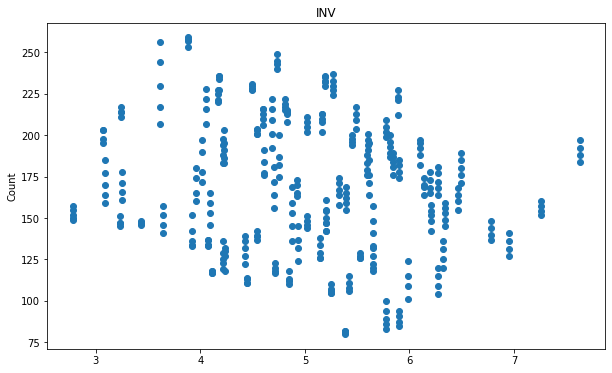

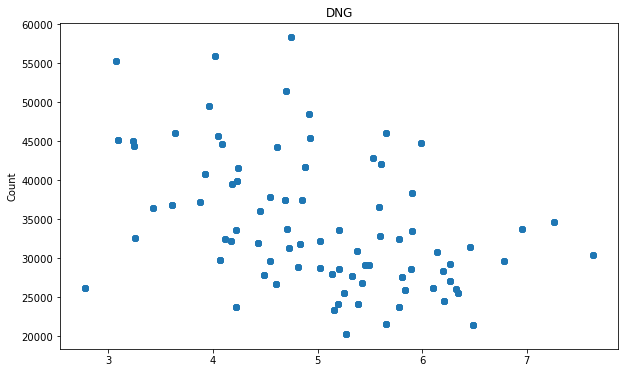

...

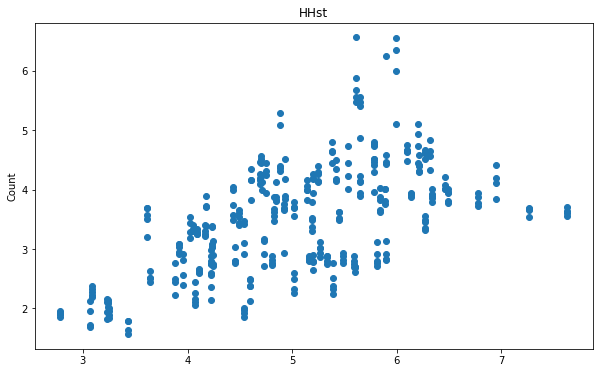

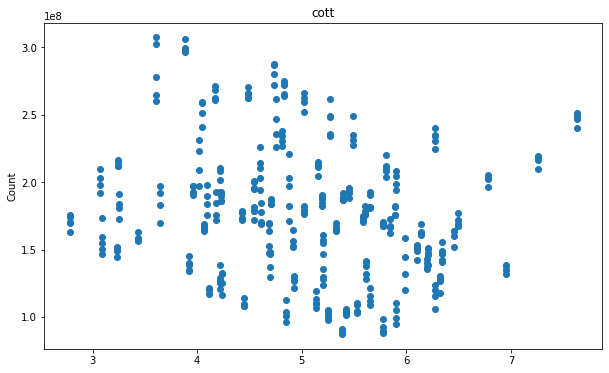

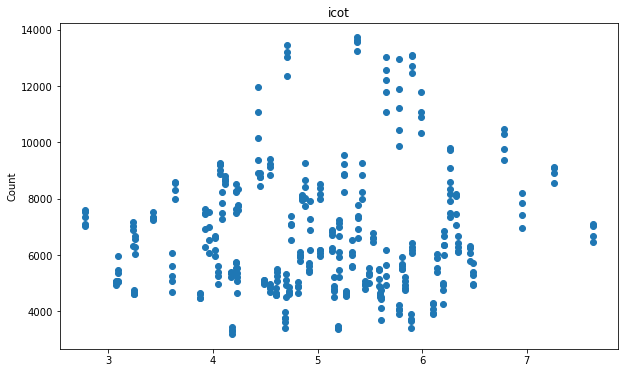

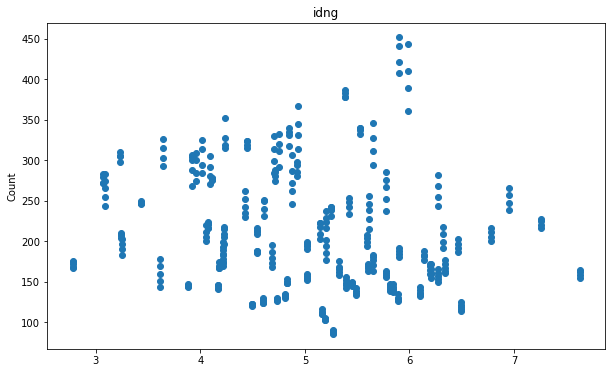

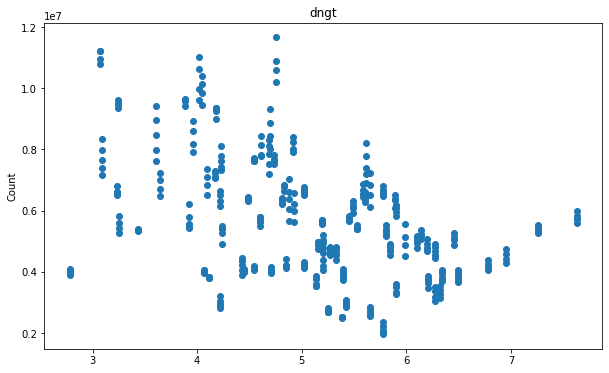

In [78]:
for col in cols_date: 
    plt.figure(figsize=(10,6))
    plt.scatter(fds_Mountain.Sit, fds_Mountain[col])
    plt.title(col)
    plt.ylabel("Count")
    plt.show()
    print()

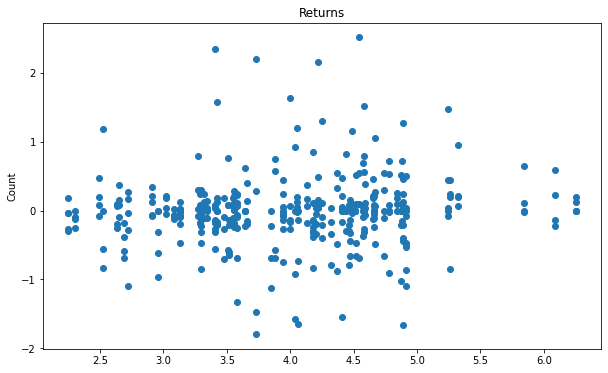

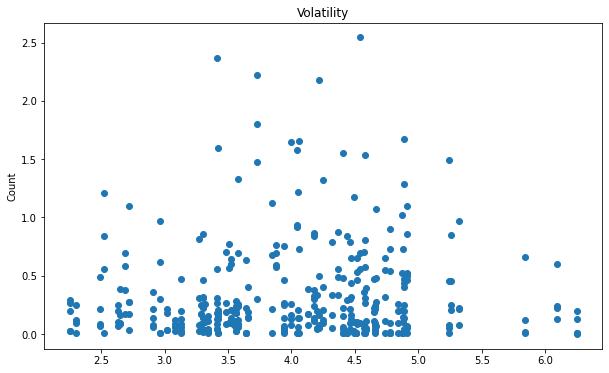

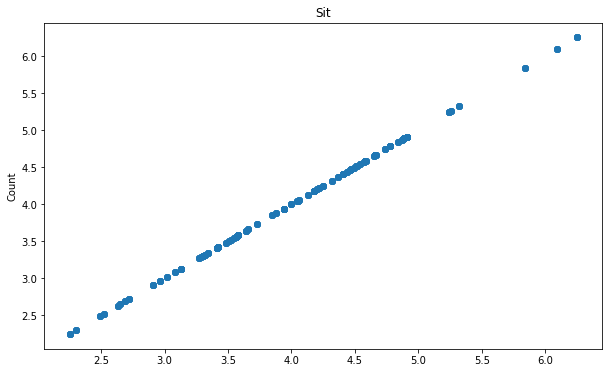

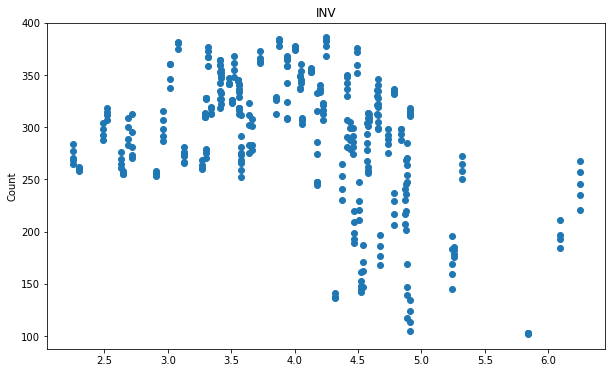

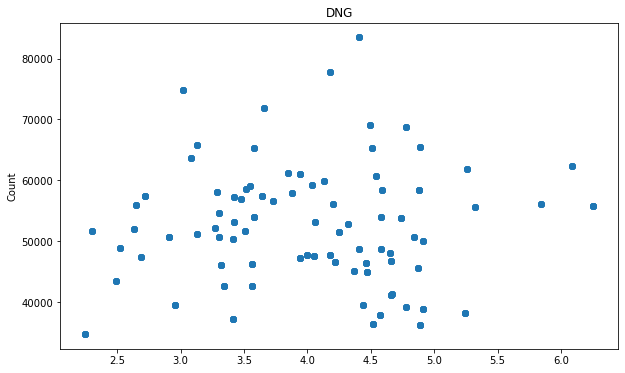

...

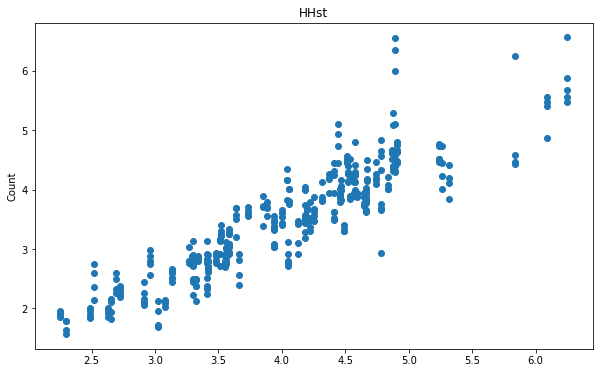

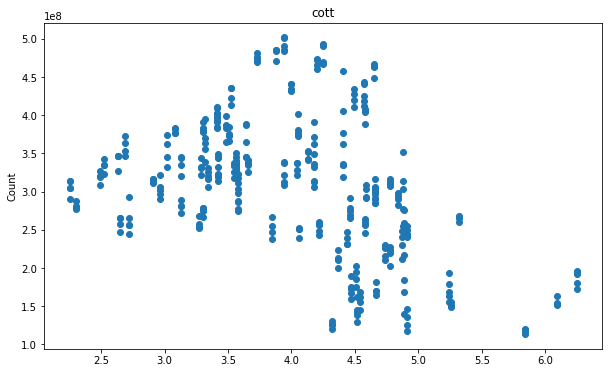

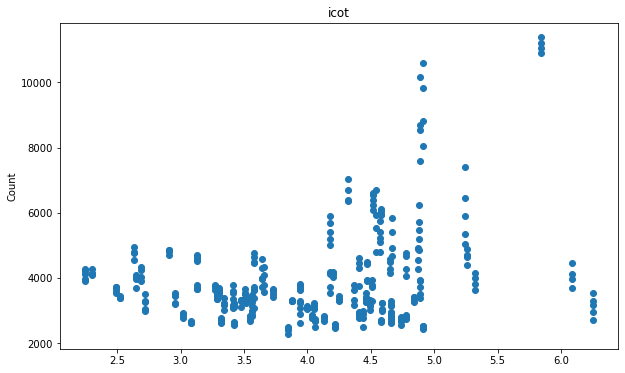

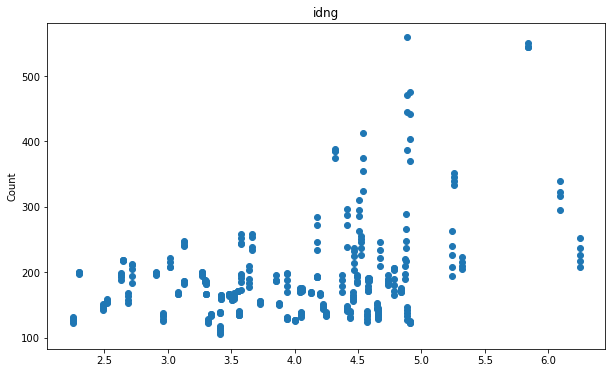

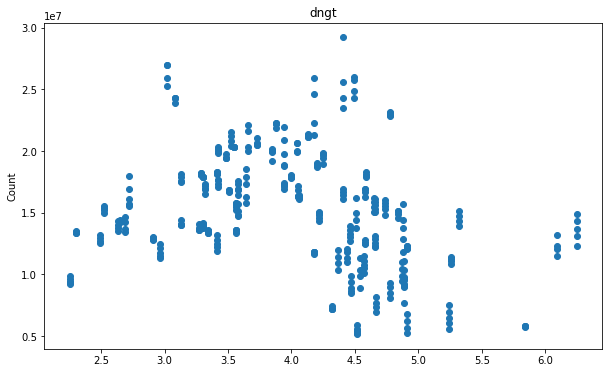

In [79]:
for col in cols_date: 
    plt.figure(figsize=(10,6))
    plt.scatter(fds_Pacific.Sit, fds_Pacific[col])
    plt.title(col)
    plt.ylabel("Count")
    plt.show()
    print()

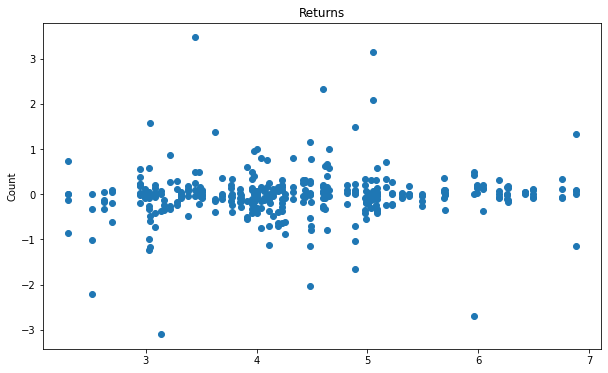

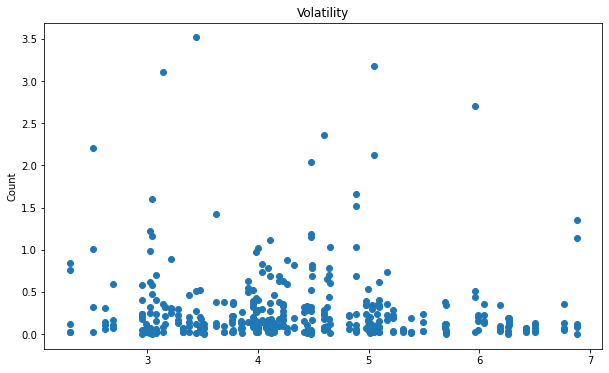

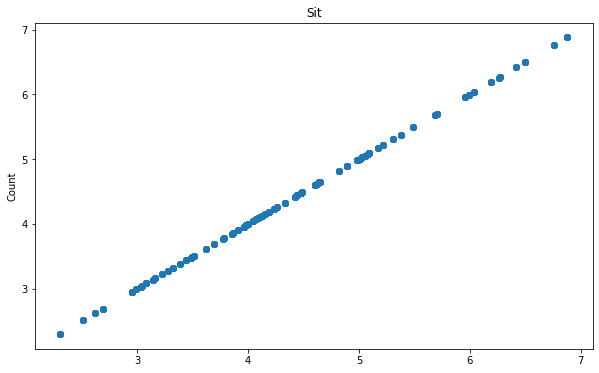

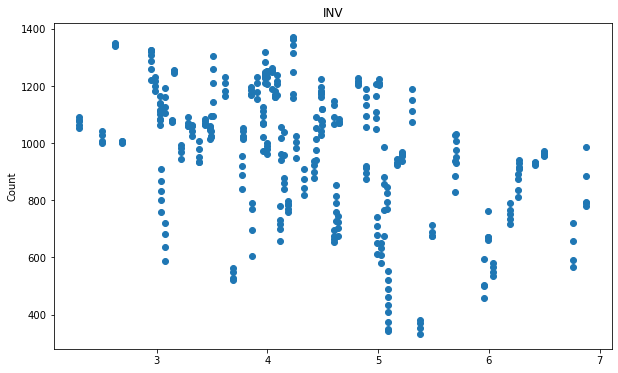

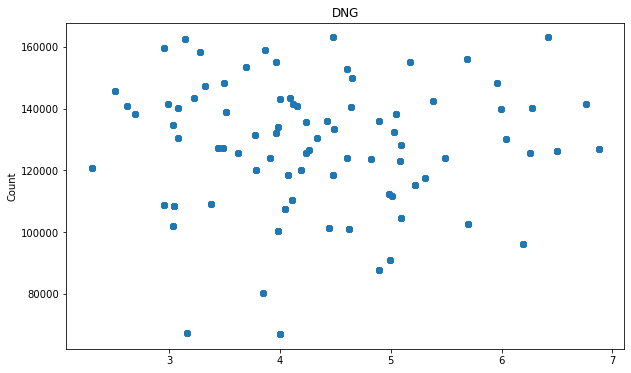

...

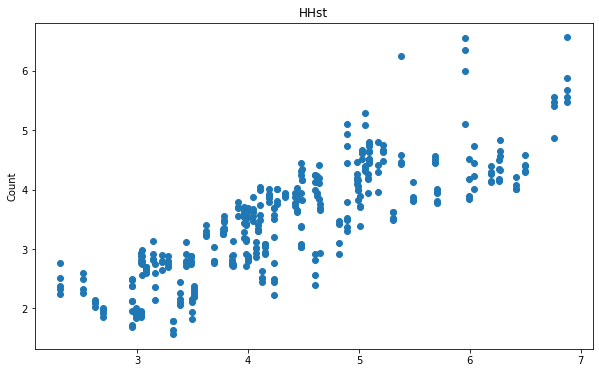

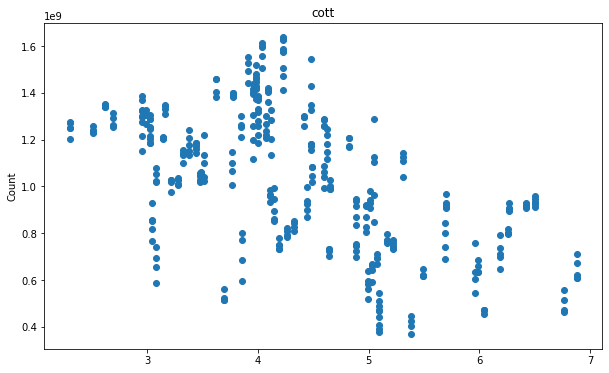

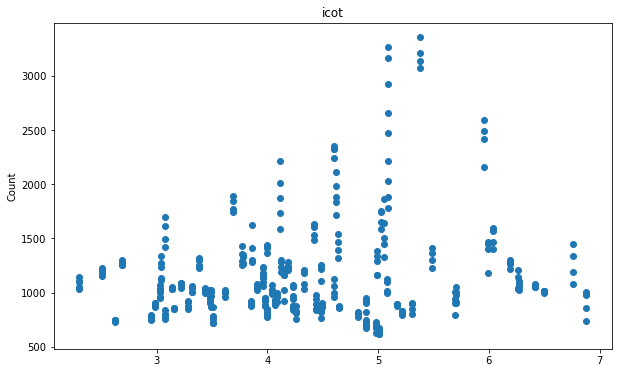

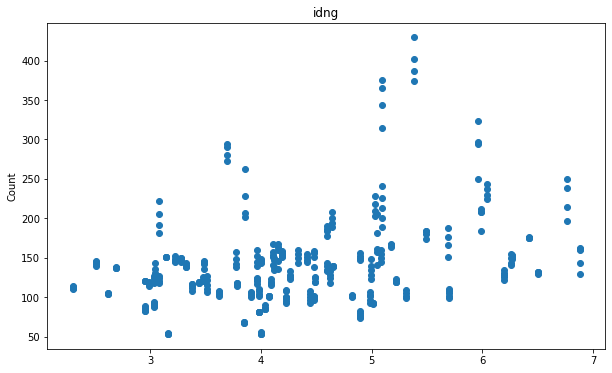

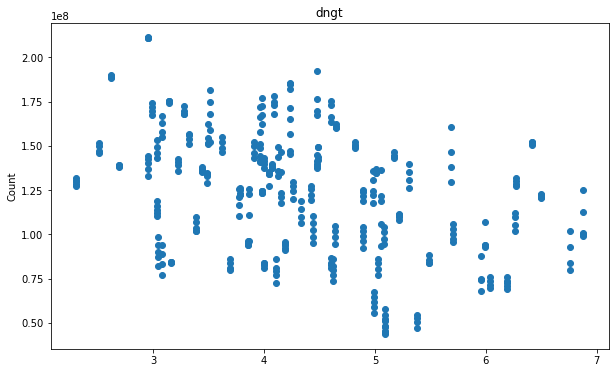

In [80]:
for col in cols_date: 
    plt.figure(figsize=(10,6))
    plt.scatter(fds_SC.Sit, fds_SC[col])
    plt.title(col)
    plt.ylabel("Count")
    plt.show()
    print()

## End: Scatter Plots

# Begin: Machine Learning

In [81]:
df_FDS.columns

Index(['Returns', 'Volatility', 'Node', 'Date', 'Sit', 'INV', 'DNG', 'QNG',
       'HHDiffit', 'Ft', 'COT', 'HHst', 'cott', 'icot', 'idng', 'dngt'],
      dtype='object')

In [82]:
df_FDS.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1830 entries, 0 to 1829
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Returns     1830 non-null   float64       
 1   Volatility  1830 non-null   float64       
 2   Node        1830 non-null   object        
 3   Date        1830 non-null   datetime64[ns]
 4   Sit         1830 non-null   float64       
 5   INV         1830 non-null   int64         
 6   DNG         1830 non-null   float64       
 7   QNG         1830 non-null   float64       
 8   HHDiffit    1830 non-null   float64       
 9   Ft          1830 non-null   float64       
 10  COT         1830 non-null   int64         
 11  HHst        1830 non-null   float64       
 12  cott        1830 non-null   int64         
 13  icot        1830 non-null   float64       
 14  idng        1830 non-null   float64       
 15  dngt        1830 non-null   float64       
dtypes: datetime64[ns](1), fl

In [83]:
# There was no need to perform this.

str_cols = []

for col in df_FDS.columns:
    if (df_FDS[col].dtype == str) & (df_FDS[col].dtype == object):
        print(col)
        df_FDS.append(col)
        
df_str = df_FDS.loc[:, str_cols]
df_str.head()

""
0
1
2
3
4


In [84]:
num_cols = []

for col in df_FDS.columns:
    if (df_FDS[col].dtype != object):
        print(col)
        num_cols.append(col)
        
df_num = df_FDS.loc[:, num_cols]
df_num.head()

Returns
Volatility
Date
Sit
INV
DNG
QNG
HHDiffit
Ft
COT
HHst
cott
icot
idng
dngt


,Returns,Volatility,Date,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
0,0.000000,0.000000,2010-01-01,7.66,769,174475.2,13475.0,-1.78,5.770,724087,5.88,556822903,941.595579,226.885826,134171428.8
1,-0.481303,0.484173,2010-01-08,7.66,703,174475.2,13475.0,-1.10,5.818,760159,6.56,534391777,1081.307255,248.186629,122656065.6
2,0.587787,0.595347,2010-01-15,7.66,642,174475.2,13475.0,-1.98,5.610,782549,5.68,502396458,1218.923676,271.768224,112013078.4
3,0.058840,0.061240,2010-01-22,7.66,616,174475.2,13475.0,-2.10,5.625,769887,5.56,474250392,1249.816558,283.238961,107476723.2
4,0.041964,0.044199,2010-01-29,7.66,582,174475.2,13475.0,-2.19,5.350,782673,5.47,455515686,1344.798969,299.785567,101544566.4


In [85]:
df_FDS.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1830 entries, 0 to 1829
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Returns     1830 non-null   float64       
 1   Volatility  1830 non-null   float64       
 2   Node        1830 non-null   object        
 3   Date        1830 non-null   datetime64[ns]
 4   Sit         1830 non-null   float64       
 5   INV         1830 non-null   int64         
 6   DNG         1830 non-null   float64       
 7   QNG         1830 non-null   float64       
 8   HHDiffit    1830 non-null   float64       
 9   Ft          1830 non-null   float64       
 10  COT         1830 non-null   int64         
 11  HHst        1830 non-null   float64       
 12  cott        1830 non-null   int64         
 13  icot        1830 non-null   float64       
 14  idng        1830 non-null   float64       
 15  dngt        1830 non-null   float64       
dtypes: datetime64[ns](1), fl

In [86]:
# linear model, drop_first=True
# One Hot Encode, columns with less than 10 categories.
cols_oh = ["Node"]
df_oh = pd.get_dummies(df_FDS.loc[:, cols_oh], drop_first=True)
df_oh.head()

,Node_Midwest,Node_Mountain,Node_Pacific,Node_South Central
0,0,0,0,0
1,0,0,0,0
2,0,0,0,0
3,0,0,0,0
4,0,0,0,0


In [87]:
df_FDS.columns

Index(['Returns', 'Volatility', 'Node', 'Date', 'Sit', 'INV', 'DNG', 'QNG',
       'HHDiffit', 'Ft', 'COT', 'HHst', 'cott', 'icot', 'idng', 'dngt'],
      dtype='object')

In [88]:
# Removed "Date", "Node"

cols_ns_ml = ['Returns', 'Volatility', 'Sit', 'INV', 'DNG', 'QNG',
       'HHDiffit', 'Ft', 'COT', 'HHst', 'cott', 'icot', 'idng', 'dngt']

In [89]:
# no scaler
df_no_scale_num = df_num.copy()
df_no_scale_num.head()

,Returns,Volatility,Date,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt
0,0.000000,0.000000,2010-01-01,7.66,769,174475.2,13475.0,-1.78,5.770,724087,5.88,556822903,941.595579,226.885826,134171428.8
1,-0.481303,0.484173,2010-01-08,7.66,703,174475.2,13475.0,-1.10,5.818,760159,6.56,534391777,1081.307255,248.186629,122656065.6
2,0.587787,0.595347,2010-01-15,7.66,642,174475.2,13475.0,-1.98,5.610,782549,5.68,502396458,1218.923676,271.768224,112013078.4
3,0.058840,0.061240,2010-01-22,7.66,616,174475.2,13475.0,-2.10,5.625,769887,5.56,474250392,1249.816558,283.238961,107476723.2
4,0.041964,0.044199,2010-01-29,7.66,582,174475.2,13475.0,-2.19,5.350,782673,5.47,455515686,1344.798969,299.785567,101544566.4


In [90]:
# # no scale, dropped columns
# df_no_scale = df_no_scale_num[cols_ns_ml]
# df_no_scale.head()

In [91]:
# no scale "df_FDS" set
df_ns = pd.concat([df_FDS, df_oh], axis=1)
df_ns.head()

,Returns,Volatility,Node,Date,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt,Node_Midwest,Node_Mountain,Node_Pacific,Node_South Central
0,0.000000,0.000000,East,2010-01-01,7.66,769,174475.2,13475.0,-1.78,5.770,724087,5.88,556822903,941.595579,226.885826,134171428.8,0,0,0,0
1,-0.481303,0.484173,East,2010-01-08,7.66,703,174475.2,13475.0,-1.10,5.818,760159,6.56,534391777,1081.307255,248.186629,122656065.6,0,0,0,0
2,0.587787,0.595347,East,2010-01-15,7.66,642,174475.2,13475.0,-1.98,5.610,782549,5.68,502396458,1218.923676,271.768224,112013078.4,0,0,0,0
3,0.058840,0.061240,East,2010-01-22,7.66,616,174475.2,13475.0,-2.10,5.625,769887,5.56,474250392,1249.816558,283.238961,107476723.2,0,0,0,0
4,0.041964,0.044199,East,2010-01-29,7.66,582,174475.2,13475.0,-2.19,5.350,782673,5.47,455515686,1344.798969,299.785567,101544566.4,0,0,0,0


In [92]:
df_ns.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1830 entries, 0 to 1829
Data columns (total 20 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Returns             1830 non-null   float64       
 1   Volatility          1830 non-null   float64       
 2   Node                1830 non-null   object        
 3   Date                1830 non-null   datetime64[ns]
 4   Sit                 1830 non-null   float64       
 5   INV                 1830 non-null   int64         
 6   DNG                 1830 non-null   float64       
 7   QNG                 1830 non-null   float64       
 8   HHDiffit            1830 non-null   float64       
 9   Ft                  1830 non-null   float64       
 10  COT                 1830 non-null   int64         
 11  HHst                1830 non-null   float64       
 12  cott                1830 non-null   int64         
 13  icot                1830 non-null   float64     

In [93]:
# Null analysis
df_ns = df_ns.fillna(value=0)
df_ns.head()

,Returns,Volatility,Node,Date,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt,Node_Midwest,Node_Mountain,Node_Pacific,Node_South Central
0,0.000000,0.000000,East,2010-01-01,7.66,769,174475.2,13475.0,-1.78,5.770,724087,5.88,556822903,941.595579,226.885826,134171428.8,0,0,0,0
1,-0.481303,0.484173,East,2010-01-08,7.66,703,174475.2,13475.0,-1.10,5.818,760159,6.56,534391777,1081.307255,248.186629,122656065.6,0,0,0,0
2,0.587787,0.595347,East,2010-01-15,7.66,642,174475.2,13475.0,-1.98,5.610,782549,5.68,502396458,1218.923676,271.768224,112013078.4,0,0,0,0
3,0.058840,0.061240,East,2010-01-22,7.66,616,174475.2,13475.0,-2.10,5.625,769887,5.56,474250392,1249.816558,283.238961,107476723.2,0,0,0,0
4,0.041964,0.044199,East,2010-01-29,7.66,582,174475.2,13475.0,-2.19,5.350,782673,5.47,455515686,1344.798969,299.785567,101544566.4,0,0,0,0


In [94]:
df_ns.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1830 entries, 0 to 1829
Data columns (total 20 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Returns             1830 non-null   float64       
 1   Volatility          1830 non-null   float64       
 2   Node                1830 non-null   object        
 3   Date                1830 non-null   datetime64[ns]
 4   Sit                 1830 non-null   float64       
 5   INV                 1830 non-null   int64         
 6   DNG                 1830 non-null   float64       
 7   QNG                 1830 non-null   float64       
 8   HHDiffit            1830 non-null   float64       
 9   Ft                  1830 non-null   float64       
 10  COT                 1830 non-null   int64         
 11  HHst                1830 non-null   float64       
 12  cott                1830 non-null   int64         
 13  icot                1830 non-null   float64     

In [95]:
train_fin = df_ns.loc[(df_ns.Date >= datetime.datetime(2010,1,1)) & (df_ns.Date <= datetime.datetime(2015,12,30))]
train_fin.head()

,Returns,Volatility,Node,Date,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt,Node_Midwest,Node_Mountain,Node_Pacific,Node_South Central
0,0.000000,0.000000,East,2010-01-01,7.66,769,174475.2,13475.0,-1.78,5.770,724087,5.88,556822903,941.595579,226.885826,134171428.8,0,0,0,0
1,-0.481303,0.484173,East,2010-01-08,7.66,703,174475.2,13475.0,-1.10,5.818,760159,6.56,534391777,1081.307255,248.186629,122656065.6,0,0,0,0
2,0.587787,0.595347,East,2010-01-15,7.66,642,174475.2,13475.0,-1.98,5.610,782549,5.68,502396458,1218.923676,271.768224,112013078.4,0,0,0,0
3,0.058840,0.061240,East,2010-01-22,7.66,616,174475.2,13475.0,-2.10,5.625,769887,5.56,474250392,1249.816558,283.238961,107476723.2,0,0,0,0
4,0.041964,0.044199,East,2010-01-29,7.66,582,174475.2,13475.0,-2.19,5.350,782673,5.47,455515686,1344.798969,299.785567,101544566.4,0,0,0,0


In [96]:
train_fin.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1565 entries, 0 to 1776
Data columns (total 20 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Returns             1565 non-null   float64       
 1   Volatility          1565 non-null   float64       
 2   Node                1565 non-null   object        
 3   Date                1565 non-null   datetime64[ns]
 4   Sit                 1565 non-null   float64       
 5   INV                 1565 non-null   int64         
 6   DNG                 1565 non-null   float64       
 7   QNG                 1565 non-null   float64       
 8   HHDiffit            1565 non-null   float64       
 9   Ft                  1565 non-null   float64       
 10  COT                 1565 non-null   int64         
 11  HHst                1565 non-null   float64       
 12  cott                1565 non-null   int64         
 13  icot                1565 non-null   float64     

In [97]:
test_fin = df_ns.loc[(df_ns.Date >= datetime.datetime(2016,1,1)) & (df_ns.Date <= datetime.datetime(2016,12,30))]
test_fin.head()

,Returns,Volatility,Node,Date,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt,Node_Midwest,Node_Mountain,Node_Pacific,Node_South Central
313,-0.812268,0.818367,East,2016-01-01,3.93,857,202858.0,134828.4,-1.66,2.288,935925,2.27,802087725,1092.094516,236.707118,173849306.0,0,0,0,0
314,-0.068563,0.067406,East,2016-01-08,3.93,802,202858.0,134828.4,-1.55,2.356,901080,2.38,722666160,1123.541147,252.940150,162692116.0,0,0,0,0
315,0.037979,0.040176,East,2016-01-15,3.93,758,202858.0,134828.4,-1.61,2.232,911328,2.32,690786624,1202.279683,267.622691,153766364.0,0,0,0,0
316,0.071887,0.074414,East,2016-01-22,3.93,695,202858.0,134828.4,-1.73,2.122,895870,2.20,622629650,1289.021583,291.882014,140986310.0,0,0,0,0
317,-0.011628,0.009916,East,2016-01-29,3.93,641,202858.0,134828.4,-1.71,2.201,947373,2.22,607266093,1477.960998,316.471139,130031978.0,0,0,0,0


In [98]:
test_fin.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 265 entries, 313 to 1829
Data columns (total 20 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Returns             265 non-null    float64       
 1   Volatility          265 non-null    float64       
 2   Node                265 non-null    object        
 3   Date                265 non-null    datetime64[ns]
 4   Sit                 265 non-null    float64       
 5   INV                 265 non-null    int64         
 6   DNG                 265 non-null    float64       
 7   QNG                 265 non-null    float64       
 8   HHDiffit            265 non-null    float64       
 9   Ft                  265 non-null    float64       
 10  COT                 265 non-null    int64         
 11  HHst                265 non-null    float64       
 12  cott                265 non-null    int64         
 13  icot                265 non-null    float64    

In [99]:
df_ns.columns

Index(['Returns', 'Volatility', 'Node', 'Date', 'Sit', 'INV', 'DNG', 'QNG',
       'HHDiffit', 'Ft', 'COT', 'HHst', 'cott', 'icot', 'idng', 'dngt',
       'Node_Midwest', 'Node_Mountain', 'Node_Pacific', 'Node_South Central'],
      dtype='object')

In [100]:
df_ns.head()

,Returns,Volatility,Node,Date,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt,Node_Midwest,Node_Mountain,Node_Pacific,Node_South Central
0,0.000000,0.000000,East,2010-01-01,7.66,769,174475.2,13475.0,-1.78,5.770,724087,5.88,556822903,941.595579,226.885826,134171428.8,0,0,0,0
1,-0.481303,0.484173,East,2010-01-08,7.66,703,174475.2,13475.0,-1.10,5.818,760159,6.56,534391777,1081.307255,248.186629,122656065.6,0,0,0,0
2,0.587787,0.595347,East,2010-01-15,7.66,642,174475.2,13475.0,-1.98,5.610,782549,5.68,502396458,1218.923676,271.768224,112013078.4,0,0,0,0
3,0.058840,0.061240,East,2010-01-22,7.66,616,174475.2,13475.0,-2.10,5.625,769887,5.56,474250392,1249.816558,283.238961,107476723.2,0,0,0,0
4,0.041964,0.044199,East,2010-01-29,7.66,582,174475.2,13475.0,-2.19,5.350,782673,5.47,455515686,1344.798969,299.785567,101544566.4,0,0,0,0


In [101]:
df_ns.to_csv("df_ns.csv", index=False, header=True)

In [102]:
cols_ns_fin = ['Returns', 'Volatility', 'Sit', 'INV', 'DNG', 'QNG',
       'HHDiffit', 'Ft', 'COT', 'HHst', 'cott', 'icot', 'idng', 'dngt',
       'Node_Midwest', 'Node_Mountain', 'Node_Pacific', 'Node_South Central']

In [103]:
train_df = train_fin[cols_ns_fin]
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1565 entries, 0 to 1776
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Returns             1565 non-null   float64
 1   Volatility          1565 non-null   float64
 2   Sit                 1565 non-null   float64
 3   INV                 1565 non-null   int64  
 4   DNG                 1565 non-null   float64
 5   QNG                 1565 non-null   float64
 6   HHDiffit            1565 non-null   float64
 7   Ft                  1565 non-null   float64
 8   COT                 1565 non-null   int64  
 9   HHst                1565 non-null   float64
 10  cott                1565 non-null   int64  
 11  icot                1565 non-null   float64
 12  idng                1565 non-null   float64
 13  dngt                1565 non-null   float64
 14  Node_Midwest        1565 non-null   uint8  
 15  Node_Mountain       1565 non-null   uint8  
 16  Node_P

In [104]:
test_df = test_fin[cols_ns_fin]
test_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 265 entries, 313 to 1829
Data columns (total 18 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Returns             265 non-null    float64
 1   Volatility          265 non-null    float64
 2   Sit                 265 non-null    float64
 3   INV                 265 non-null    int64  
 4   DNG                 265 non-null    float64
 5   QNG                 265 non-null    float64
 6   HHDiffit            265 non-null    float64
 7   Ft                  265 non-null    float64
 8   COT                 265 non-null    int64  
 9   HHst                265 non-null    float64
 10  cott                265 non-null    int64  
 11  icot                265 non-null    float64
 12  idng                265 non-null    float64
 13  dngt                265 non-null    float64
 14  Node_Midwest        265 non-null    uint8  
 15  Node_Mountain       265 non-null    uint8  
 16  Node_

In [105]:
# Feature engineering, column selection.
# One must use ALL ONE-HOT ENCODED COLUMNS, one cannot simply use one column and leave the rest.
abs(df_ns.corr()["Sit"]).sort_values(ascending=False)

Sit                   1.000000
HHDiffit              0.804160
HHst                  0.507488
Ft                    0.503202
Node_Pacific          0.317758
idng                  0.249979
DNG                   0.247112
Node_South Central    0.209716
COT                   0.147051
Volatility            0.141232
Node_Midwest          0.100889
cott                  0.097432
Returns               0.076218
QNG                   0.061842
dngt                  0.058992
INV                   0.049910
icot                  0.023005
Node_Mountain         0.005129
Name: Sit, dtype: float64

In [106]:
corrs_ns = df_ns.corr()

In [107]:
corrs_ns

,Returns,Volatility,Sit,INV,DNG,QNG,HHDiffit,Ft,COT,HHst,cott,icot,idng,dngt,Node_Midwest,Node_Mountain,Node_Pacific,Node_South Central
Returns,1.000000,0.002274,0.076218,-0.016444,-0.004983,-0.020101,-0.094775,-1.923853e-02,-5.364505e-04,-9.858435e-03,-0.016088,0.004546,0.003551,-0.015849,8.029177e-03,2.365151e-04,-1.038786e-03,-1.294475e-02
Volatility,0.002274,1.000000,-0.141232,-0.018485,-0.005424,0.048650,0.281353,1.685383e-01,6.687803e-02,1.715410e-01,0.007226,0.035524,0.044279,-0.001220,-4.882609e-02,-4.371063e-02,1.393719e-01,1.015204e-01
Sit,0.076218,-0.141232,1.000000,-0.049910,0.247112,-0.061842,-0.804160,5.032017e-01,-1.470509e-01,5.074880e-01,-0.097432,-0.023005,0.249979,0.058992,-1.008890e-01,5.128559e-03,-3.177578e-01,-2.097160e-01
INV,-0.016444,-0.018485,-0.049910,1.000000,0.553788,0.420146,-0.058615,-1.480047e-01,-2.129297e-02,-1.684768e-01,0.958365,-0.796530,-0.459774,0.875962,2.376344e-01,-5.622025e-01,-3.896014e-01,5.942377e-01
DNG,-0.004983,-0.005424,0.247112,0.553788,1.000000,0.391351,-0.283760,-1.082699e-02,2.190653e-02,2.130041e-03,0.540851,-0.566849,0.328269,0.831530,-6.305373e-02,-5.409438e-01,-3.632084e-01,3.594484e-01
QNG,-0.020101,0.048650,-0.061842,0.420146,0.391351,1.000000,0.034444,-5.642364e-02,3.404682e-02,-5.354408e-02,0.420677,-0.172881,-0.039306,0.543801,-4.593527e-01,8.163854e-02,-4.528595e-01,8.560867e-01
HHDiffit,-0.094775,0.281353,-0.804160,-0.058615,-0.283760,0.034444,1.000000,9.666881e-02,4.253866e-02,1.040791e-01,-0.034233,0.115770,-0.122943,-0.154035,1.164511e-01,-5.919636e-03,3.667717e-01,2.420646e-01
Ft,-0.019239,0.168538,0.503202,-0.148005,-0.010827,-0.056424,0.096669,1.000000e+00,-2.072994e-01,9.820863e-01,-0.197472,0.107354,0.199114,-0.114116,1.785198e-15,-1.140008e-15,-2.040456e-15,-3.824175e-15
COT,-0.000536,0.066878,-0.147051,-0.021293,0.021907,0.034047,0.042539,-2.072994e-01,1.000000e+00,-1.843811e-01,0.223646,0.230522,0.047855,0.002051,-2.315034e-15,-1.296914e-15,2.745899e-15,4.222274e-15
HHst,-0.009858,0.171541,0.507488,-0.168477,0.002130,-0.053544,0.104079,9.820863e-01,-1.843811e-01,1.000000e+00,-0.212648,0.129328,0.240047,-0.124584,-1.407320e-15,9.073105e-16,1.408627e-15,1.099453e-15


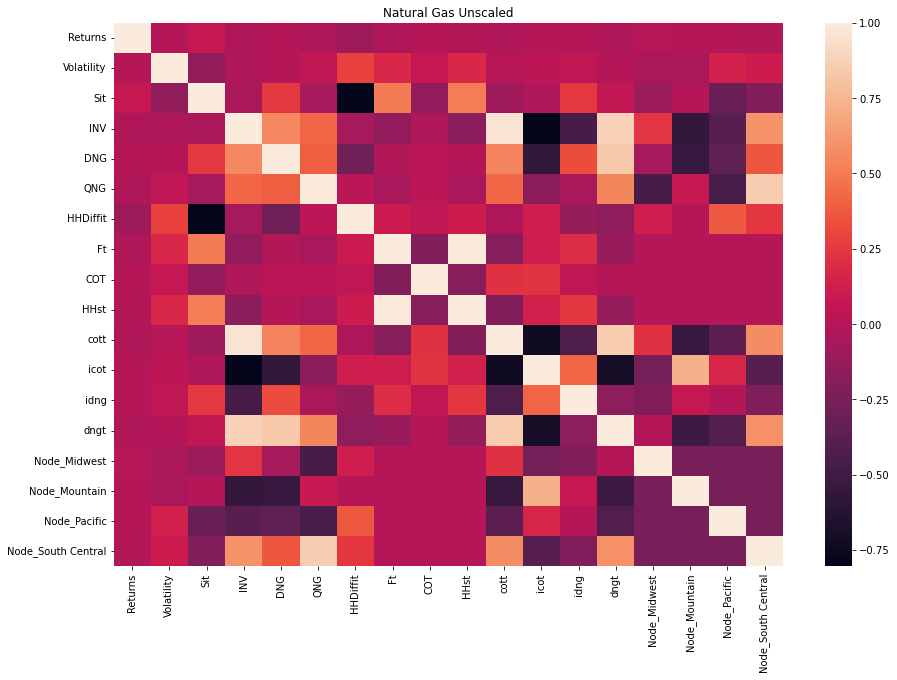

In [108]:
plt.figure(figsize=(15,10))
sns.heatmap(corrs_ns)

plt.title('Natural Gas Unscaled')

# Save an image of the chart and print it to the screen
plt.savefig("Natural Gas Unscaled.png")

plt.show()

In [109]:
X_train = train_df.drop(["Sit"], axis=1).values
y_train = train_df["Sit"].values

X_test = test_df.drop(["Sit"], axis=1).values
y_test = test_df["Sit"].values

In [110]:
# Initialize the model
model1 = LinearRegression()

# FIT THE MODEL
model1.fit(X_train, y_train)

# EVALUATE the MODEL
train_preds = model1.predict(X_train)
test_preds = model1.predict(X_test)

# PRINT the METRICS
print("TRAINING SET")

# Score the prediction with MSE and R2 {evaluation_metrics}
mse_train = mean_squared_error(y_train, train_preds)
r2_train = r2_score(y_train, train_preds)
mae_train = mean_absolute_error(y_train, train_preds)

print(f"mean squared error (MSE): {mse_train}")
print(f"R-squared (R2 ): {r2_train}")
print(f"MAE {mae_train}")

# We cannot evaluate the metrics {Score the prediction with MSE and R2} unless we have our expected output
# from the {train_preds and test_preds}

print()

# PRINT the METRICS
print("Testing SET")

# Score the prediction with MSE and R2 {evaluation_metrics}
mse_test = mean_squared_error(y_test, test_preds)
r2_test = r2_score(y_test, test_preds)
mae_test = mean_absolute_error(y_test, test_preds)

print(f"mean squared error (MSE): {mse_test}")
print(f"R-squared (R2 ): {r2_test}")
print(f"MAE {mae_test}")


# Compare the {evaluation_metrics} to test for overfitting
# Testing set is more important because the goal is to see how the model performs on unseen data.
# Run a new model with the goal of outperforming the Test Set evaluation metrics.

TRAINING SET
mean squared error (MSE): 3.9687172089367137e-23
R-squared (R2 ): 1.0
MAE 4.483124556712757e-12

Testing SET
mean squared error (MSE): 1.5053819999812915e-23
R-squared (R2 ): 1.0
MAE 3.0064638409848553e-12


In [111]:
X_train = train_df.drop(["Sit", "Returns"], axis=1).values
y_train = train_df["Sit"].values

X_test = test_df.drop(["Sit", "Returns"], axis=1).values
y_test = test_df["Sit"].values

In [112]:
# Initialize the model
model2 = LinearRegression()

# FIT THE MODEL
model2.fit(X_train, y_train)

# EVALUATE the MODEL
train_preds = model2.predict(X_train)
test_preds = model2.predict(X_test)

# PRINT the METRICS
print("TRAINING SET")

# Score the prediction with MSE and R2 {evaluation_metrics}
mse_train = mean_squared_error(y_train, train_preds)
r2_train = r2_score(y_train, train_preds)
mae_train = mean_absolute_error(y_train, train_preds)

print(f"mean squared error (MSE): {mse_train}")
print(f"R-squared (R2 ): {r2_train}")
print(f"MAE {mae_train}")

# We cannot evaluate the metrics {Score the prediction with MSE and R2} unless we have our expected output
# from the {train_preds and test_preds}

print()

# PRINT the METRICS
print("Testing SET")

# Score the prediction with MSE and R2 {evaluation_metrics}
mse_test = mean_squared_error(y_test, test_preds)
r2_test = r2_score(y_test, test_preds)
mae_test = mean_absolute_error(y_test, test_preds)

print(f"mean squared error (MSE): {mse_test}")
print(f"R-squared (R2 ): {r2_test}")
print(f"MAE {mae_test}")


# Compare the {evaluation_metrics} to test for overfitting
# Testing set is more important because the goal is to see how the model performs on unseen data.
# Run a new model with the goal of outperforming the Test Set evaluation metrics.

TRAINING SET
mean squared error (MSE): 6.164326961177927e-22
R-squared (R2 ): 1.0
MAE 2.0443090032297648e-11

Testing SET
mean squared error (MSE): 4.507140486502858e-22
R-squared (R2 ): 1.0
MAE 1.736228435655697e-11


In [113]:
X_train = train_df.drop(["Sit", "Returns", "Volatility"], axis=1).values
y_train = train_df["Sit"].values

X_test = test_df.drop(["Sit", "Returns", "Volatility"], axis=1).values
y_test = test_df["Sit"].values

In [114]:
# Initialize the model
model3 = LinearRegression()

# FIT THE MODEL
model3.fit(X_train, y_train)

# EVALUATE the MODEL
train_preds = model3.predict(X_train)
test_preds = model3.predict(X_test)

# PRINT the METRICS
print("TRAINING SET")

# Score the prediction with MSE and R2 {evaluation_metrics}
mse_train = mean_squared_error(y_train, train_preds)
r2_train = r2_score(y_train, train_preds)
mae_train = mean_absolute_error(y_train, train_preds)

print(f"mean squared error (MSE): {mse_train}")
print(f"R-squared (R2 ): {r2_train}")
print(f"MAE {mae_train}")

# We cannot evaluate the metrics {Score the prediction with MSE and R2} unless we have our expected output
# from the {train_preds and test_preds}

print()

# PRINT the METRICS
print("Testing SET")

# Score the prediction with MSE and R2 {evaluation_metrics}
mse_test = mean_squared_error(y_test, test_preds)
r2_test = r2_score(y_test, test_preds)
mae_test = mean_absolute_error(y_test, test_preds)

print(f"mean squared error (MSE): {mse_test}")
print(f"R-squared (R2 ): {r2_test}")
print(f"MAE {mae_test}")


# Compare the {evaluation_metrics} to test for overfitting
# Testing set is more important because the goal is to see how the model performs on unseen data.
# Run a new model with the goal of outperforming the Test Set evaluation metrics.

TRAINING SET
mean squared error (MSE): 1.4173124362000316e-21
R-squared (R2 ): 1.0
MAE 3.132374615279986e-11

Testing SET
mean squared error (MSE): 1.1158444373707322e-21
R-squared (R2 ): 1.0
MAE 2.814570044534467e-11


In [115]:
X_train = train_df.drop(["Sit", "Returns", "Volatility",  "HHDiffit"], axis=1).values
y_train = train_df["Sit"].values

X_test = test_df.drop(["Sit", "Returns", "Volatility",  "HHDiffit"], axis=1).values
y_test = test_df["Sit"].values

In [116]:
# Initialize the model
model3 = LinearRegression()

# FIT THE MODEL
model3.fit(X_train, y_train)

# EVALUATE the MODEL
train_preds = model3.predict(X_train)
test_preds = model3.predict(X_test)

# PRINT the METRICS
print("TRAINING SET")

# Score the prediction with MSE and R2 {evaluation_metrics}
mse_train = mean_squared_error(y_train, train_preds)
r2_train = r2_score(y_train, train_preds)
mae_train = mean_absolute_error(y_train, train_preds)

print(f"mean squared error (MSE): {mse_train}")
print(f"R-squared (R2 ): {r2_train}")
print(f"MAE {mae_train}")

# We cannot evaluate the metrics {Score the prediction with MSE and R2} unless we have our expected output
# from the {train_preds and test_preds}

print()

# PRINT the METRICS
print("Testing SET")

# Score the prediction with MSE and R2 {evaluation_metrics}
mse_test = mean_squared_error(y_test, test_preds)
r2_test = r2_score(y_test, test_preds)
mae_test = mean_absolute_error(y_test, test_preds)

print(f"mean squared error (MSE): {mse_test}")
print(f"R-squared (R2 ): {r2_test}")
print(f"MAE {mae_test}")


# Compare the {evaluation_metrics} to test for overfitting
# Testing set is more important because the goal is to see how the model performs on unseen data.
# Run a new model with the goal of outperforming the Test Set evaluation metrics.

TRAINING SET
mean squared error (MSE): 0.6478283339095944
R-squared (R2 ): 0.7297953275533923
MAE 0.5775563757891083

Testing SET
mean squared error (MSE): 0.7156502004002577
R-squared (R2 ): 0.4849123118662094
MAE 0.6478630660915246


In [117]:
X_train = train_df.drop(["Sit", "Returns", "Volatility",  "Ft"], axis=1).values
y_train = train_df["Sit"].values

X_test = test_df.drop(["Sit", "Returns", "Volatility",  "Ft"], axis=1).values
y_test = test_df["Sit"].values

In [118]:
# Initialize the model
model4 = LinearRegression()

# FIT THE MODEL
model4.fit(X_train, y_train)

# EVALUATE the MODEL
train_preds = model4.predict(X_train)
test_preds = model4.predict(X_test)

# PRINT the METRICS
print("TRAINING SET")

# Score the prediction with MSE and R2 {evaluation_metrics}
mse_train = mean_squared_error(y_train, train_preds)
r2_train = r2_score(y_train, train_preds)
mae_train = mean_absolute_error(y_train, train_preds)

print(f"mean squared error (MSE): {mse_train}")
print(f"R-squared (R2 ): {r2_train}")
print(f"MAE {mae_train}")

# We cannot evaluate the metrics {Score the prediction with MSE and R2} unless we have our expected output
# from the {train_preds and test_preds}

print()

# PRINT the METRICS
print("Testing SET")

# Score the prediction with MSE and R2 {evaluation_metrics}
mse_test = mean_squared_error(y_test, test_preds)
r2_test = r2_score(y_test, test_preds)
mae_test = mean_absolute_error(y_test, test_preds)

print(f"mean squared error (MSE): {mse_test}")
print(f"R-squared (R2 ): {r2_test}")
print(f"MAE {mae_test}")


# Compare the {evaluation_metrics} to test for overfitting
# Testing set is more important because the goal is to see how the model performs on unseen data.
# Run a new model with the goal of outperforming the Test Set evaluation metrics.

TRAINING SET
mean squared error (MSE): 3.69441808440241e-21
R-squared (R2 ): 1.0
MAE 4.2509078685197285e-11

Testing SET
mean squared error (MSE): 5.360573568459662e-21
R-squared (R2 ): 1.0
MAE 5.3768701021981716e-11


In [119]:
X_train = train_df.drop(["Sit", "HHst", "Returns", "Volatility", "Ft", "Node_Pacific"], axis=1).values
y_train = train_df["Sit"].values 

X_test = test_df.drop(["Sit", "HHst", "Returns", "Volatility", "Ft", "Node_Pacific"], axis=1).values
y_test = test_df["Sit"].values

In [120]:
# Initialize the model
model5 = LinearRegression()

# FIT THE MODEL
model5.fit(X_train, y_train)

# EVALUATE the MODEL
train_preds = model5.predict(X_train)
test_preds = model5.predict(X_test)

# PRINT the METRICS
print("TRAINING SET")

# Score the prediction with MSE and R2 {evaluation_metrics}
mse_train = mean_squared_error(y_train, train_preds)
r2_train = r2_score(y_train, train_preds)
mae_train = mean_absolute_error(y_train, train_preds)

print(f"mean squared error (MSE): {mse_train}")
print(f"R-squared (R2 ): {r2_train}")
print(f"MAE {mae_train}")

# We cannot evaluate the metrics {Score the prediction with MSE and R2} unless we have our expected output
# from the {train_preds and test_preds}

print()

# PRINT the METRICS
print("Testing SET")

# Score the prediction with MSE and R2 {evaluation_metrics}
mse_test = mean_squared_error(y_test, test_preds)
r2_test = r2_score(y_test, test_preds)
mae_test = mean_absolute_error(y_test, test_preds)

print(f"mean squared error (MSE): {mse_test}")
print(f"R-squared (R2 ): {r2_test}")
print(f"MAE {mae_test}")


# Compare the {evaluation_metrics} to test for overfitting
# Testing set is more important because the goal is to see how the model performs on unseen data.
# Run a new model with the goal of outperforming the Test Set evaluation metrics.

TRAINING SET
mean squared error (MSE): 0.6216745883200007
R-squared (R2 ): 0.7407038721328492
MAE 0.6390217937765009

Testing SET
mean squared error (MSE): 1.4392840426787825
R-squared (R2 ): -0.03592158528934153
MAE 1.0101527042749234


In [121]:
# Feature engineering, column selection.
# One must use ALL ONE-HOT ENCODED COLUMNS, one cannot simply use one column and leave the rest.
abs(df_ns.corr()["Sit"]).sort_values(ascending=False)

Sit                   1.000000
HHDiffit              0.804160
HHst                  0.507488
Ft                    0.503202
Node_Pacific          0.317758
idng                  0.249979
DNG                   0.247112
Node_South Central    0.209716
COT                   0.147051
Volatility            0.141232
Node_Midwest          0.100889
cott                  0.097432
Returns               0.076218
QNG                   0.061842
dngt                  0.058992
INV                   0.049910
icot                  0.023005
Node_Mountain         0.005129
Name: Sit, dtype: float64